In [1]:
versioninfo()

Julia Version 1.9.3
Commit bed2cd540a1 (2023-08-24 14:43 UTC)
Build Info:
  Official https://julialang.org/ release
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 24 × AMD Ryzen 9 3900X 12-Core Processor
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-14.0.6 (ORCJIT, znver2)
  Threads: 13 on 24 virtual cores
Environment:
  JULIA_PKG_SERVER = pkg.julialang.org


In [6]:
]instantiate

Precompiling project...
  ✓ RangeArrays
  ✓ PolygonOps
  ✓ SuiteSparse
  ✓ ExprTools
  ✓ Chain
  ✓ IndirectArrays
  ✓ Graphite2_jll
  ✓ Libmount_jll
  ✓ LLVMOpenMP_jll
  ✓ AbstractFFTs
  ✓ Kaleido_jll
  ✓ Bzip2_jll
  ✓ Qhull_jll
  ✓ Calculus
  ✓ Combinatorics
  ✓ StructTypes
  ✓ TensorCore
  ✓ CEnum
  ✓ Rmath_jll
  ✓ UnPack
  ✓ Lz4_jll
  ✓ Contour
  ✓ Match
  ✓ TriplotBase
  ✓ Xorg_libXau_jll
  ✓ libpng_jll
  ✓ ConcurrentUtilities
  ✓ libfdk_aac_jll
  ✓ OpenLibm_jll
  ✓ CommonSolve
  ✓ CompilerSupportLibraries_jll
  ✓ Imath_jll
  ✓ WoodburyMatrices
  ✓ SuiteSparse_jll
  ✓ IntelOpenMP_jll
  ✓ WinReg
  ✓ ManualMemory
  ✓ IterTools
  ✓ PkgVersion
  ✓ LAME_jll
  ✓ ShiftedArrays
  ✓ Grisu
  ✓ EarCut_jll
  ✓ Ogg_jll
  ✓ Observables
  ✓ JpegTurbo_jll
  ✓ EnumX
  ✓ Peaks
  ✓ Xorg_libXdmcp_jll
  ✓ NLopt_jll
  ✓ x265_jll
  ✓ Distances
  ✓ libaom_jll
  ✓ SIMDTypes
  ✓ x264_jll
  ✓ Pidfile
  ✓ Zstd_jll
  ✓ Expat_jll
  ✓ IntervalSets
  ✓ Extents
  ✓ AbstractTrees
  ✓ BitIntegers
  ✓ LZO_jll
  ✓ PCR

In [2]:
]precompile

In [1]:
using DatasetManager, LabDataSources, C3D, Statistics, CSV, DataFrames, PlotlyJS, StatsBase, HypothesisTests, MixedModels, CategoricalArrays, ProgressMeter, DataFramesMeta, StandardizedPredictors,
    LinearAlgebra, Random, StatsModels, MixedModelsExtras, Effects
using MixedModels: likelihoodratiotest

WebIO._IJuliaInit()

In [2]:
using PaperResearchCode

In [3]:
LinearAlgebra.BLAS.set_num_threads(4)
ProgressMeter.ijulia_behavior(:clear);

In [4]:
datapath = "../data"

subsets = [
    DataSubset("main", Source{C3DFile}, datapath, "PD [0-9]*/Patient [0-9]*/Session [0-2]/*.c3d")
    DataSubset("main", Source{C3DFile}, datapath, "Control [0-9]*/Patient [0-9]*/Session [0-2]/*.c3d")
]

labels = Dict(
    :group => ["PD", "Control"],
    :groupid => r"(?<=PD |Control )\d+",
    :subject => r"(?<=Patient )\d+",
    :session => r"(?<=Session )\d+",
    :task => r"(rrt|sip)"i,
    :cued => r"((un)?cued)"
)

conds = TrialConditions((:group,:groupid,:subject,:session,:task,:cued), labels; types=Dict(:groupid => Int, :subject => Int, :session => Int))

trials = findtrials(subsets, conds)

filter!(trials) do trial
    !hassubject(trial, 3) && # unusable data quality
    !hassubject(trial, 13) && # unusable data quality
    !hassubject(trial, 36) # influential outlier across both sessions and multiple dependent variables
end

demograph = CSV.read("../data/demographics.csv", DataFrame)
DatasetManager.addcondition!.(trials, :bodyweight => (t -> @subset(demograph, $"Subject Code" .== subject(t))[1, "Weight (kg)"]))

recodecondition!.(trials, :cued => c -> c == "cued" ? true : false)

summarize(trials; verbosity=25, ignoreconditions=(:groupid,:group,:bodyweight))

Subjects:
 └ 37: 1  2  4  5  6  7  8  9  10  11  12  …  32  33  34  35  37  38  39  40
Trials:
 ├ 272 trials
 └ Trials per subject:
   ├ 8: 31 subjects (84%)
   └ 4: 6 subjects (16%)
Conditions:
 ├ Observed levels:
 │ ├ task => ["rrt", "sip"]
 │ ├ cued => Bool[1, 0]
 │ └ session => [1, 2]
 └ Unique level combinations observed: 8 (full factorial)
     task │  cued │ session │ # trials 
    ──────┼───────┼─────────┼──────────
      rrt │  true │       1 │ 36       
      rrt │ false │       1 │ 36       
      sip │  true │       1 │ 36       
      sip │ false │       1 │ 36       
      rrt │  true │       2 │ 32       
      rrt │ false │       2 │ 32       
      sip │  true │       2 │ 32       
      sip │ false │       2 │ 32       
Sources:
 └ "main" => Source{C3DFile}, 272 trials (100%)


### Testing

In [ ]:
# t = rand(trials)
t = filter(t -> hassubject(t, 37) && hascondition(t, :task => "sip", :cued => true, :session => 1), trials)[1]

In [ ]:
cycles_analysis(t)

In [ ]:
all_strides = let trial = filter(t -> hassubject(t, 37) && t.name == "sip-stand-both-c", trials)[1]
    seg = Segment(trial, "main")
    right_strides, left_strides, fog = find_cycles(trial, source(seg))
    all_strides = sort!([right_strides; left_strides])
end
_extrema, _var = extrema(length.(getfield.(all_strides, :rising))), var(length.(getfield.(all_strides, :rising)))
@show _extrema, _var
p = plot([
        scatter(;y=length.(getfield.(all_strides, :rising)), x=first.(all_strides), name="S37_S1_PD_SIP_NC")
        # scatter(;y=length.(getfield.(all_strides, :falling)), x=midpoint.(all_strides), name="falling")
    ])
p

In [ ]:
all_strides = let trial = filter(t -> hassubject(t, 37) && t.name == "sip-stand-both-nc", trials)[1]
    seg = Segment(trial, "main")
    right_strides, left_strides, fog = find_cycles(trial, source(seg))
    all_strides = sort!([right_strides; left_strides])
end
_extrema, _var = extrema(length.(getfield.(all_strides, :rising))), var(length.(getfield.(all_strides, :rising)))
@show _extrema, _var
add_trace!(p, scatter(;y=length.(getfield.(all_strides, :rising)), x=first.(all_strides), name="S37_S1_PD_SIP_C"))
p

# Analysis

In [7]:
srs = analyzedataset(cycles_analysis, trials, Source{C3DFile});

Analyzing trials... 100%|███████████████████████████████| Time: 0:01:59


In [8]:
data = DatasetManager.stack(srs)
select!(data, Not([:groupid, :bodyweight]))

# Add variables from demographics
demo_factors = select(demograph, "Subject Code" => "subject", "FOGQ #3" => ((fogq3) -> fogq3 .> 0) => :llfreeze, "FOULQ" => ((foulq) -> foulq .> 0) => :ulfreeze, :MOCA, "MA side" => :ma)
leftjoin!(data, demo_factors; on="subject");

let 
    tmp = stack(select(demograph, "Subject Code" => "subject", "S1 Meds" => "1", "S2 Meds" => "2"),
        ["1", "2"], :subject; variable_name=:session, value_name=:meds)
    transform!(tmp, :session => x -> parse.(Int, x),
        :meds => x -> CategoricalVector(passmissing(x -> isone(x) ? "ON" : "OFF" ).(x)); renamecols=false)
    transform!(tmp, [:subject, :session] .=> CategoricalVector; renamecols=false)
    leftjoin!(data, tmp; on=[:subject,:session]);
end

let 
    tmp = stack(select(demograph, "Subject Code" => "subject", "S1 Bradykinesia" => "1", "S2 Bradykinesia" => "2"),
        ["1", "2"], :subject; variable_name=:session, value_name=:bradykinesia)
    transform!(tmp, :session => x -> parse.(Int, x); renamecols=false)
    transform!(tmp, [:subject, :session] .=> CategoricalVector; renamecols=false)
    leftjoin!(data, tmp; on=[:subject,:session]);
end

let 
    tmp = stack(select(demograph, "Subject Code" => "subject", "S1 RRT Freq" => "1", "S2 RRT Freq" => "2"),
        ["1", "2"], :subject; variable_name=:session, value_name=:cue_bpm)
    transform!(tmp, :session => x -> parse.(Int, x); renamecols=false)
    transform!(tmp, [:subject, :session] .=> CategoricalVector; renamecols=false)
    @transform!(tmp, :task = CategoricalVector(fill("rrt", length(:subject))))
    tmp2 = stack(select(demograph, "Subject Code" => "subject", "S1 SIP Freq" => "1", "S2 SIP Freq" => "2"),
        ["1", "2"], :subject; variable_name=:session, value_name=:cue_bpm)
    transform!(tmp2, :session => x -> parse.(Int, x); renamecols=false)
    transform!(tmp2, [:subject, :session] .=> CategoricalVector; renamecols=false)
    @transform!(tmp2, :task = CategoricalVector(fill("sip", length(:subject))))
    leftjoin!(data, vcat(tmp, tmp2); on=[:subject,:session,:task]);
end
transform!(data, [:cue_bpm, :task] => ByRow((bpm, task) -> task == "rrt" ? bpm/2 : bpm) => :cue_bpm) # correct for RRT cue recorded as 2* step BPM 

let
    updrs = stack(select(demograph, "Subject Code" => "subject", "UPDRS ON" => "ON", "UPDRS OFF" => "OFF"),
        ["ON", "OFF"], :subject; variable_name=:meds, value_name=:UPDRS)
    transform!(updrs, [:subject, :meds] .=> CategoricalVector; renamecols=false)
    leftjoin!(data, updrs; on=[:subject,:meds]);
end

# Flatten some variables
transform!(data, [:group,:meds] => ((g,s) -> ifelse.(g .== "Control", "Control", string.(g,Ref('_'),s))) => :group_meds);
data[!, :group_meds] = CategoricalArray(data[!, :group_meds]; levels=["Control", "PD_OFF", "PD_ON"], ordered=true);
@rtransform!(data, :sample = string(:subject, ifelse(:group == "Control", 'C', :meds == "ON" ? "PT" : "PF"), ifelse(:group == "Control", :session, 1)))

transform!(data, [:subject,:session] => ((g,s) -> string.(Ref('S'),g,Ref('_'),s)) => :subj_sesh);
transform!(data, [:subject,:session,:cued] => ((g,s,c) -> string.(Ref('S'),g,Ref('_'),s,Ref('_'),c)) => :subj_sesh_cue);

In [13]:
CSV.write("../data/data_results.csv", data)

"../data/data_results.csv"

In [9]:
vars = [ "cue_bpm", "act_bpm", "bpm_diff", "bpm_err", "numfog", "numsteps",
    "step_time_asym", "clock_var",
    "motor_var", "lag1_corr", "la_step_time_cov", "ma_step_time_cov", "step_time_cov_asym",
    "pci" ];
all_vars = [vars; "la_step_time"; "left_step_time"; "left_step_time_cov"; "ma_step_time"; "right_step_time"; "right_step_time_cov" ];

In [39]:
wide = unstack(data)

@rtransform!(wide, :bpm_err = (:act_bpm - :cue_bpm)/:cue_bpm*100, :bpm_diff = (:act_bpm - :cue_bpm))
@rtransform!(wide, :step_time_asym = ((60*1000)/:ma_step_time - (60*1000)/:la_step_time)/:cue_bpm*100)
allowmissing!(wide, :step_time_asym)
transform!(subset(wide, :group => x -> x .== "Control"; view=true), 
    [:ma_step_time_cov, :la_step_time_cov] => ByRow((ma, la) -> (mean([ma, la]), mean([ma, la]))) => [:ma_step_time_cov, :la_step_time_cov];
    renamecols=false)

rrtdata = @subset(wide, :task .== "rrt")
sipdata = @subset(wide, :task .== "sip");

In [40]:
# Removing egregious outliers
## RRT
outliers = subset(rrtdata, :subject => x -> x .== 26, :meds => x -> x .== "OFF"; view=true)
outliers[:, ["step_time_asym", "clock_var", "motor_var", "lag1_corr", "la_step_time_cov", "pci"]] .= missing

## SIP
outliers = subset(sipdata, :subject => x -> x .== 9; view=true) # Both sessions
outliers[:, ["clock_var", "motor_var", "lag1_corr", "la_step_time_cov", "ma_step_time_cov", "pci"]] .= missing

outliers = subset(sipdata, :subject => x -> x .== 11, :meds => x -> x .== "OFF"; view=true)
outliers[:, ["step_time_asym", "clock_var", "motor_var", "lag1_corr", "la_step_time_cov", "ma_step_time_cov", "pci"]] .= missing

outliers = subset(sipdata, :subject => x -> x .== 15, :meds => x -> x .== "OFF"; view=true)
outliers[:, ["clock_var", "motor_var", "lag1_corr", "la_step_time_cov", "ma_step_time_cov", "pci"]] .= missing;

outliers = subset(sipdata, :subject => x -> x .== 32, :meds => x -> x .== "OFF"; view=true)
outliers[:, ["clock_var", "motor_var", "lag1_corr", "la_step_time_cov", "ma_step_time_cov"]] .= missing;

outliers = subset(sipdata, :subject => x -> x .== 37, :meds => x -> x .== "ON", :cued => x -> x .== false; view=true)
outliers[:, ["clock_var", "motor_var", "lag1_corr"]] .= missing;

outliers = subset(sipdata, :subject => x -> x .== 39, :session => x -> x .== 1; view=true)
outliers[:, ["clock_var", "motor_var", "lag1_corr", "la_step_time_cov", "ma_step_time_cov", "pci"]] .= missing;

## Demographics

In [12]:
demo = unique(select(wide, Not([all_vars; "task";"cued"; "sample"; "subj_sesh"; "subj_sesh_cue"; "session"; "group_meds"])))
leftjoin!(demo, select(demograph, "Subject Code" => "subject", "Sex", "Age", "Height (cm)" => "height", "Weight (kg)" => "weight", "Years Dx" => "dx_length"); on=:subject)
transform!(demo, [:ma, :Sex] .=> CategoricalVector; renamecols=false);

In [13]:
gd = groupby(unique(select(demo, Not("meds")), [:subject, :group]), "group")
demo_table = combine(gd, x -> describe(x, :nnonmissing, :mean, :std, (x -> eltype(x) <: CategoricalValue ? count(==(minimum(x)), x) : nothing) => :Nmin, :min, :max;
        cols=[:Sex, :Age, :height, :weight, :MOCA, :ma, :dx_length]))
transform!(demo_table, [:mean, :std] .=> ByRow(x -> isnothing(x) ? nothing : round.(x; digits=1)); renamecols=false)

Row,group,variable,nnonmissing,mean,std,Nmin,min,max
,Cat…,Symbol,Int64,Union…,Union…,Union…,Any,Any
1,Control,Sex,12,,,5,Female,Male
2,Control,Age,12,69.5,8.8,,51,78
3,Control,height,11,165.3,11.9,,146.0,185.0
4,Control,weight,11,73.0,11.1,,57.0,93.1
5,Control,MOCA,12,27.8,1.6,,25,30
6,Control,ma,0,,,,,
7,Control,dx_length,0,NaN,NaN,,,
8,PD,Sex,25,,,7,Female,Male
9,PD,Age,25,67.4,6.6,,54,80


In [14]:
gd = groupby(@subset(demo, :group .== "PD"), "meds")
demo_table = combine(gd, x -> describe(x, :nnonmissing, :nmissing, :mean, :std, (x -> eltype(x) <: CategoricalValue ? count(==(minimum(x)), x) : nothing) => :Nmin, :min, :max;
        cols=[:UPDRS, :bradykinesia]))
transform!(demo_table, [:mean, :std] .=> ByRow(x -> isnothing(x) ? nothing : round.(x; digits=1)); renamecols=false)
sort!(demo_table, :variable)

Row,meds,variable,nnonmissing,nmissing,mean,std,Nmin,min,max
,Cat…?,Symbol,Int64,Int64,Float64,Float64,Nothing,Float64,Float64
1,OFF,UPDRS,22,1,32.1,10.9,,12.0,54.5
2,ON,UPDRS,24,0,25.1,9.7,,9.0,47.0
3,OFF,bradykinesia,23,0,17.0,7.3,,7.0,34.0
4,ON,bradykinesia,24,0,14.5,7.2,,4.5,32.0


In [25]:
df1 = sort!(@subset(data, :group .== "PD", :cued .== false, :task .== "rrt", :variable .== "act_bpm"), :meds);
df1 = sort!(unstack(select(df1, :subject, :meds, :bradykinesia), :meds, :bradykinesia; combine=last), :subject)

# Test for ON/OFF differences in bradykinesia subscore of UPDRS
OneSampleTTest(skipmissing(df1[!, :ON] .- df1[!, :OFF]) |> collect)

One sample t-test
-----------------
Population details:
    parameter of interest:   Mean
    value under h_0:         0
    point estimate:          -2.7619
    95% confidence interval: (-4.032, -1.491)

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0002

Details:
    number of observations:   21
    t-statistic:              -4.534572437205524
    degrees of freedom:       20
    empirical standard error: 0.6090772173455042


In [12]:
gd = groupby(rrtdata, [:group, :ulfreeze])

# Count of PFE (plausible freezing episodes) by group (PD group separated into freezers and non-freezers based on 
# upper limb freezing question) in the upper limbs during the RRT
combine(gd, :subject => (x -> length(unique(x))) => :Nsubs, :numfog => (x -> [sum(x) count(>(0), x)]) => [:count, :Ntrials])

Row,group,ulfreeze,Nsubs,count,Ntrials
,Cat…,Bool?,Int64,Float64,Float64
1,Control,missing,12,1.0,1.0
2,PD,false,18,2.0,2.0
3,PD,true,7,3.0,3.0


In [15]:
gd = groupby(rrtdata, [:group, :meds])

# Count of PFE (plausible freezing episodes) by med status in the upper limbs during the RRT
combine(gd, :subject => (x -> length(unique(x))) => :Nsubs,
    :numfog => (x -> [sum(x) count(>(0), x)]) => [:count, :Ntrials])

Row,group,meds,Nsubs,count,Ntrials
,Cat…,Cat…?,Int64,Float64,Float64
1,Control,OFF,12,1.0,1.0
2,PD,OFF,22,4.0,4.0
3,PD,ON,24,1.0,1.0


In [12]:
gd = groupby(rrtdata, [:group, :meds])

# Characteristics of number of complete reaches by group and meds
combine(gd, x -> describe(x, :mean, :std, :min, :max; cols=[:numsteps]))

Row,group,meds,variable,mean,std,min,max
,Cat…,Cat…?,Symbol,Float64,Float64,Float64,Float64
1,Control,OFF,numsteps,128.905,49.4007,65.0,267.0
2,PD,OFF,numsteps,103.196,35.448,41.0,210.0
3,PD,ON,numsteps,99.75,35.7679,33.0,205.0


In [11]:
gd = groupby(sipdata, [:group, :llfreeze])

# Count of PFE (plausible freezing episodes) by group (PD group separated into freezers and
# non-freezers based on FOGQ) in the lower limbs during the SIPT
combine(gd, :subject => (x -> length(unique(x))) => :Nsubs,
        :numfog => (x -> [sum(skipmissing(x)) count(>(0), skipmissing(x))]) => [:count, :Ntrials])

Row,group,llfreeze,Nsubs,count,Ntrials
,Cat…,Bool?,Int64,Float64,Float64
1,Control,missing,12,3.0,2.0
2,PD,false,14,46.0,7.0
3,PD,true,11,140.0,14.0


In [14]:
gd = groupby(sipdata, [:group, :meds])

# Count of PFE (plausible freezing episodes) by med status in the lower limbs during the SIPT
combine(gd, :subject => (x -> length(unique(x))) => :Nsubs,
    :numfog => (x -> [sum(skipmissing(x)) count(>(0), skipmissing(x))]) => [:count, :Ntrials])

Row,group,meds,Nsubs,count,Ntrials
,Cat…,Cat…?,Int64,Float64,Float64
1,Control,OFF,12,3.0,2.0
2,PD,OFF,22,108.0,13.0
3,PD,ON,24,78.0,8.0


In [13]:
gd = groupby(sipdata, [:group, :meds])

# Characteristics of number of complete reaches by group and meds
combine(gd, x -> describe(x, :mean, :std, :min, :max; cols=[:numsteps]))

Row,group,meds,variable,mean,std,min,max
,Cat…,Cat…?,Symbol,Float64,Float64,Float64,Float64
1,Control,OFF,numsteps,237.238,45.3409,149.0,322.0
2,PD,OFF,numsteps,235.761,71.1606,69.0,385.0
3,PD,ON,numsteps,245.854,61.5111,95.0,398.0


In [53]:
let
    # Number of negative motor variance estimates for RRT
    # Negative motor variance shouldn't arise from Wing-Kristofferson model
    gd = groupby(rrtdata, [:cued])
    df = combine(gd, x -> describe(x, (x -> count(<(0), x)) => :Nneg, length∘collect => :N; cols=[:motor_var]))
    display(df)
    gd = groupby(rrtdata, [:group, :cued])
    df = combine(gd, x -> describe(x, (x -> count(<(0), x)) => :Nneg, length∘collect => :N; cols=[:motor_var]))
    display(df)
end

Row,cued,variable,Nneg,N
,Cat…,Symbol,Int64,Int64
1,false,motor_var,34,67
2,true,motor_var,15,67


Row,group,cued,variable,Nneg,N
,Cat…,Cat…,Symbol,Int64,Int64
1,Control,false,motor_var,5,21
2,Control,true,motor_var,2,21
3,PD,false,motor_var,29,46
4,PD,true,motor_var,13,46


In [54]:
let
    # Number of negative motor variance estimates for SIPT
    gd = groupby(sipdata, [:cued])
    df = combine(gd, x -> describe(x, (x -> count(<(0), x)) => :Nneg, length∘collect => :N; cols=[:motor_var]))
    display(df)
    gd = groupby(sipdata, [:group, :cued])
    df = combine(gd, x -> describe(x, (x -> count(<(0), x)) => :Nneg, length∘collect => :N; cols=[:motor_var]))
    display(df)
end

Row,cued,variable,Nneg,N
,Cat…,Symbol,Int64,Int64
1,false,motor_var,17,61
2,true,motor_var,4,62


Row,group,cued,variable,Nneg,N
,Cat…,Cat…,Symbol,Int64,Int64
1,Control,false,motor_var,8,20
2,Control,true,motor_var,1,20
3,PD,false,motor_var,9,41
4,PD,true,motor_var,3,42


## Visual Exploration

In [11]:
using PlotlyJS: plot, scatter, histogram, box

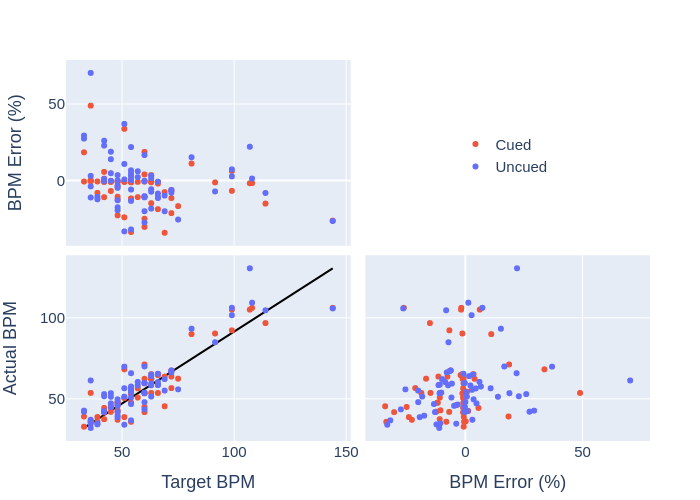

In [12]:
p = let
    bpm_err = :bpm_err
    df = rrtdata
    p = make_subplots(;rows=2, cols=2, shared_xaxes="columns", shared_yaxes="rows", start_cell="bottom-left",
        horizontal_spacing=0.025, vertical_spacing=0.025)
    
    cued = @subset(df, :cued .== true)
    uncued = @subset(df, :cued .== false)
    
    add_trace!(p, scatter(;x=extrema(collect(skipmissing(df[!,"cue_bpm"]))),
            y=extrema(collect(skipmissing(df[!,"act_bpm"]))), mode="lines", line_color="black", showlegend=false); row=1, col=1)
    add_trace!(p, scatter(cued; y=:act_bpm, x=:cue_bpm, text=:subj_sesh, mode="markers", marker_color="#ef553b", name="Cued", legendgroup="cued"); row=1, col=1)
    add_trace!(p, scatter(uncued; y=:act_bpm, x=:cue_bpm, text=:subj_sesh, mode="markers", marker_color="#636efa", name="Uncued", legendgroup="uncued"); row=1, col=1)
    # add_trace!(p, scatter(;x=extrema(collect(skipmissing(df[!,"cue_bpm"]))),
    #         y=extrema(collect(skipmissing(df[!,"bpm_err"]))), mode="lines", line_color="black", showlegend=false); row=2, col=1)
    add_trace!(p, scatter(cued; y=bpm_err, x=:cue_bpm, text=:subj_sesh, mode="markers", marker_color="#ef553b", name="Cued", legendgroup="cued", showlegend=false); row=2, col=1)
    add_trace!(p, scatter(uncued; y=bpm_err, x=:cue_bpm, text=:subj_sesh, mode="markers", marker_color="#636efa", name="Uncued", legendgroup="uncued", showlegend=false); row=2, col=1)
    # add_trace!(p, scatter(;x=extrema(collect(skipmissing(df[!,"bpm_err"]))),
    #         y=extrema(collect(skipmissing(df[!,"act_bpm"]))), mode="lines", line_color="black", showlegend=false); row=1, col=2)
    add_trace!(p, scatter(cued; y=:act_bpm, x=bpm_err, text=:subj_sesh, mode="markers", marker_color="#ef553b", name="Cued", legendgroup="cued", showlegend=false); row=1, col=2)
    add_trace!(p, scatter(uncued; y=:act_bpm, x=bpm_err, text=:subj_sesh, mode="markers", marker_color="#636efa", name="Uncued", legendgroup="uncued", showlegend=false); row=1, col=2)

    relayout!(p,
        yaxis=attr(;title="Actual BPM", scaleanchor="x1", scaleratio=1),
        xaxis=attr(;title="Target BPM"),
        xaxis2=attr(;title="BPM Error (%)"),
        yaxis3=attr(;title="BPM Error (%)", matches="x2"),
        height=750,
        width=750,
        font_size=15,
        legend=attr(;
            x=0.75,
            y=0.75,
            xanchor="center",
            yanchor="middle",
            tracegroupgap=0,
        ))
    
    p
end

In [ ]:
let _data = sipdata
    plot([
            histogram(_data; x=Symbol(vari), visible=(i==1), mode="markers", name="$vari")
        for (i,vari) in enumerate(vars)
        ], Layout(;title="Distribution of variable", width=700, height=550,
            updatemenus=[
                attr(;
                    buttons=[
                        attr(;
                            method="restyle",
                            args=["visible", axes(vars, 1) .== i],
                            label=v
                        )
                        for (i,v) in enumerate(vars) ],
                    x=1.05,
                    xanchor="left",
                    y=0.85,
                ),
                ],
    ))
end

In [ ]:
let _data = rrtdata, xax = :bpm_err
    plot([
            scatter(_data; x=xax, y=Symbol(vari), text=:subj_sesh_cue, visible=(i==1), mode="markers", name="$vari")
        for (i,vari) in enumerate(vars)
        ], Layout(;title="Variable vs potential correlate $xax", width=700, height=550,
            xaxis_title = string(xax),
            updatemenus=[
                attr(;
                    buttons=[
                        attr(;
                            method="restyle",
                            args=["visible", axes(vars, 1) .== i],
                            label=v
                        )
                        for (i,v) in enumerate(vars) ],
                    x=1.05,
                    xanchor="left",
                    y=0.85,
                ),
                ],
    ))
end

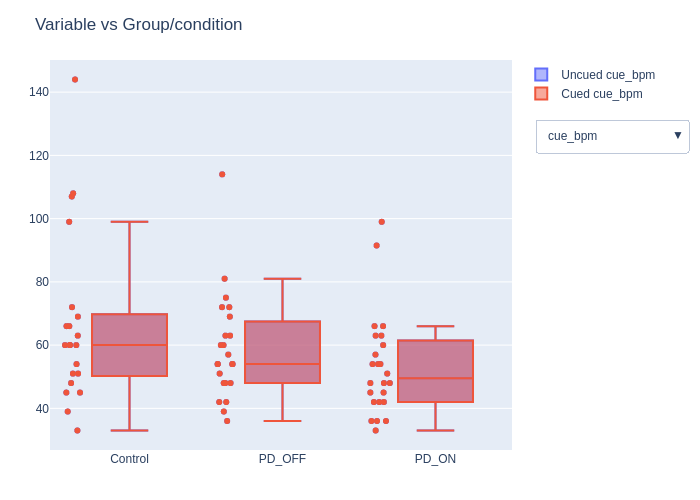

In [12]:
let _data = sort(rrtdata, [:group_meds])
    PlotlyJS.plot(reduce(vcat, [[
        box(@subset(_data, :cued .== false); x=:group_meds, y=Symbol(vari), text=:subj_sesh, boxpoints="all", visible=(i==1), name="Uncued $vari")
        box(@subset(_data, :cued .== true); x=:group_meds, y=Symbol(vari), text=:subj_sesh, boxpoints="all", visible=(i==1), name="Cued $vari") ]
            for (i,vari) in enumerate(vars)
        ]), Layout(;title="Variable vs Group/condition", width=650, height=600,
            updatemenus=[attr(;
                buttons=[
                    attr(;
                        method="restyle",
                        args=["visible", repeat(axes(vars, 1) .== i; inner=2)],
                        label=v
                    )
                    for (i,v) in enumerate(vars) ],
                x=1.05,
                xanchor="left",
                y=0.85,
            )],
    ))
end

# Statistics

In [42]:
ENV["LMER"] = "afex::lmer_alt"

"afex::lmer_alt"

In [43]:
using AlgebraOfGraphics, CairoMakie, MixedModelsMakie, JellyMe4, RCall
using MixedModels: likelihoodratiotest
CairoMakie.activate!(; type="svg");

In [44]:
R"library(emmeans)"

RObject{StrSxp}
[1] "emmeans"   "stats"     "graphics"  "grDevices" "utils"     "datasets" 
[7] "methods"   "base"     


In [45]:
contrasts = Dict{Symbol,Any}()
contrasts[:subject] = Grouping()
contrasts[:sample] = Grouping()
contrasts[:session] = Grouping()
contrasts[:group] = DummyCoding(; base="Control")
contrasts[:meds] = DummyCoding(; base="OFF")
contrasts[:group_meds] = HypothesisCoding([-2 1 1; 0 -1 1]; levels=["Control", "PD_OFF", "PD_ON"], labels=["PD vs Control", "PD_ON vs PD_OFF"])
contrasts[:cued] = DummyCoding(; base=false);

In [48]:
function stats_summary(model, bootstrap)
    base = DataFrame(coeftable(model))
    covint = DataFrame(shortestcovint(bootstrap))
    @subset!(covint, :type .== "β")
    @transform!(covint, $(Symbol("95% CI")) = string.('[',  round.(:lower, sigdigits=1), ',', round.(:upper, sigdigits=1), ']'))
    rename!(covint, :names => :Name)
    select!(covint, :Name, Symbol("95% CI"))
    
    leftjoin!(base, covint; on=:Name)
    select!(base, :Name, Symbol("Coef."), Symbol("95% CI"), Not([:Name, Symbol("Coef."), Symbol("95% CI")]))
    # dof, nobs
end

stats_summary (generic function with 1 method)

Maximal random-effects model: `@formula(Y ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)`

Dependent variables:
- `cue_bpm` (only comparing group effect)
- `bpm_err`
- `clock_var`
- `motor_var`
- `pci`
- `(ma|la)_step_time_cov` (COV of each side is not independent due to the task requiring matching a beat, as errors in the previous cycle will require negative feedback to maintain beatmatching)

## RRT stats

### Cue BPM

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [115]:
cue_rrt_lmm01 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + (1+group_meds|subject) + (1+group_meds|sample)),
        @subset(rrtdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + (1 + group_meds | subject) + (1 + group_meds | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -276.1828   552.3657   584.3657   595.0323   619.8778

Variance components:
                    Column            Variance Std.Dev.   Corr.
sample   (Intercept)                   27.22155  5.21743
         group_meds: PD vs Control    225.79472 15.02647 -1.00
         group_meds: PD_ON vs PD_OFF    1.27678  1.12995 +0.43 -0.43
subject  (Intercept)                  299.82699 17.31551
         group_meds: PD vs Control    459.58950 21.43804 -0.75
         group_meds: PD_ON vs PD_OFF   30.17287  5.49298 -0.29 +0.85
Residual                               18.68207  4.32228
 Number of obs: 68; levels of grouping factors: 67, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────
                                 Coef.  Std. Error      z  Pr(>|z|)
───────────────────

In [117]:
cue_rrt_lmm02 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + zerocorr(1+group_meds|subject) + zerocorr(1+group_meds|sample)),
        @subset(rrtdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + MixedModels.ZeroCorr((1 + group_meds | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -276.2487   552.4974   572.4974   576.3571   594.6925

Variance components:
                    Column            Variance  Std.Dev.   Corr.
sample   (Intercept)                     0.00000  0.00000
         group_meds: PD vs Control     926.03516 30.43083   .  
         group_meds: PD_ON vs PD_OFF     0.00000  0.00000   .     .  
subject  (Intercept)                   103.26320 10.16185
         group_meds: PD vs Control    3912.38525 62.54906   .  
         group_meds: PD_ON vs PD_OFF     0.00000  0.00000   .     .  
Residual                                16.48474  4.06014
 Number of obs: 68; levels of grouping factors: 67, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────
                                 Co

In [118]:
cue_rrt_lmm02.rePCA

(sample = [1.0, 1.0, 1.0], subject = [0.5000000000000001, 1.0, 1.0])

In [119]:
cue_rrt_lmm03 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + zerocorr(1+group_meds|subject) + (1|sample)),
        @subset(rrtdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 257 	 Time: 0:00:00 ( 0.96 ms/it)


Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + MixedModels.ZeroCorr((1 + group_meds | subject)) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -278.3753   556.7507   572.7507   575.1913   590.5067

Variance components:
                    Column            Variance  Std.Dev.   Corr.
subject  (Intercept)                    79.88794  8.93801
         group_meds: PD vs Control    4368.92826 66.09787   .  
         group_meds: PD_ON vs PD_OFF     0.00000  0.00000   .     .  
sample   (Intercept)                    47.10323  6.86318
Residual                                18.66796  4.32064
 Number of obs: 68; levels of grouping factors: 37, 67

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────
                                 Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────
(Intercept)                   59.1358      3.13942  18.84    <1e-78


In [120]:
cue_rrt_lmm03.rePCA

(subject = [0.5, 1.0, 1.0], sample = [1.0])

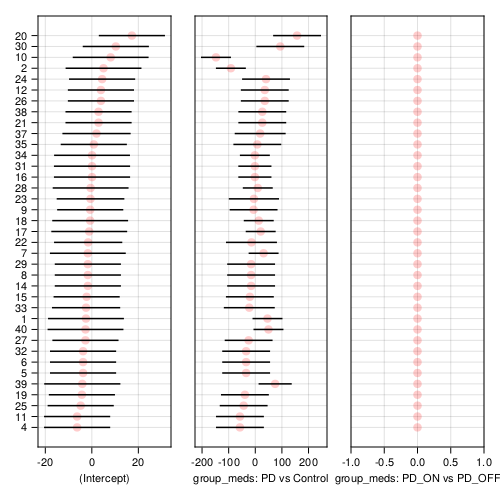

In [121]:
let lmm = cue_rrt_lmm03
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

In [129]:
cue_rrt_lmm04 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + (1|subject) + (1|sample)),
        @subset(rrtdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -280.2757   560.5515   572.5515   573.9285   585.8685

Variance components:
            Column    Variance Std.Dev. 
sample   (Intercept)   47.65271  6.90309
subject  (Intercept)  317.65891 17.82299
Residual               18.47162  4.29786
 Number of obs: 68; levels of grouping factors: 67, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────
                                 Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────
(Intercept)                   59.1573      3.10467  19.05    <1e-80
group_meds: PD vs Control    -18.8272     13.2801   -1.42    0.1563
group_meds: PD_ON vs PD_OFF   -5.54032     2.48976  -2.23    0.0261
───────────────────────────────────────────────────────────────────

In [130]:
cue_rrt_lmm05 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + (1|subject)),
        @subset(rrtdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -280.5264   561.0527   571.0527   572.0205   582.1503

Variance components:
            Column    Variance Std.Dev. 
subject  (Intercept)  317.73860 17.82522
Residual               64.78119  8.04868
 Number of obs: 68; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────
                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────
(Intercept)                   59.1526     3.099    19.09    <1e-80
group_meds: PD vs Control    -18.8295    13.2612   -1.42    0.1556
group_meds: PD_ON vs PD_OFF   -5.5386     2.46429  -2.25    0.0246
──────────────────────────────────────────────────────────────────

In [131]:
likelihoodratiotest(cue_rrt_lmm04, cue_rrt_lmm05)

|                                                           | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:--------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| cue_bpm ~ 1 + group_meds + (1 \| subject)                 |         5 |      561 |     |        |        |
| cue_bpm ~ 1 + group_meds + (1 \| subject) + (1 \| sample) |         6 |      561 |   1 |      1 | 0.4789 |


`cue_rrt_lmm06` is clearly better (via LR test) than all, with the potential exception of `cue_rrt_lmm02`. The worst-case conservative p-value there is 0.098/2. However, the simpler model has 5 fewer dof and similar ish deviance (therefore slightly better AIC, AICc, and BIC). We choose the simpler, most general model, `cue_rrt_lmm06`.

##### **Random effects caterpillar charts**

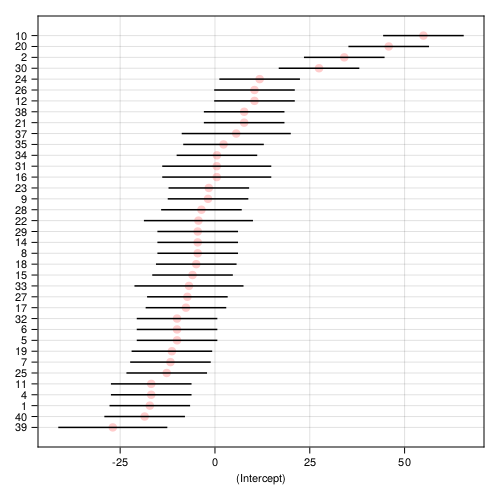

In [132]:
let lmm = cue_rrt_lmm05
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

##### **Bootstrap**

In [133]:
cue_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, cue_rrt_lmm05);

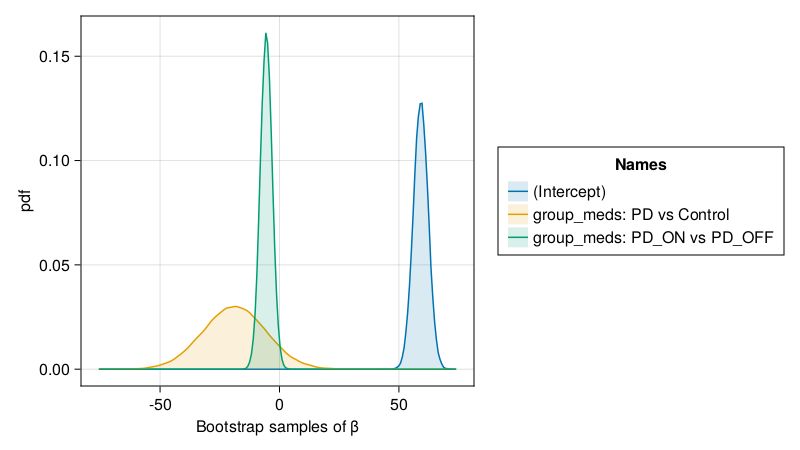

In [134]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(cue_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

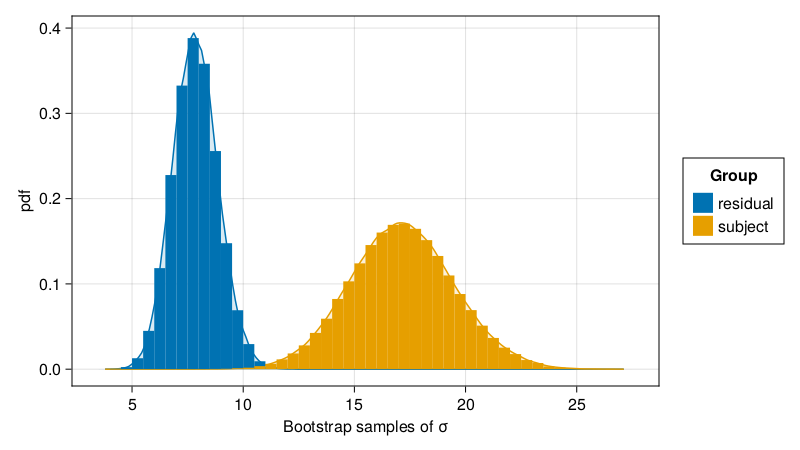

In [136]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(cue_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf)),
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [137]:
print(cue_rrt_lmm05)

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -280.5264   561.0527   571.0527   572.0205   582.1503

Variance components:
            Column    Variance Std.Dev. 
subject  (Intercept)  317.73860 17.82522
Residual               64.78119  8.04868
 Number of obs: 68; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────
                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────
(Intercept)                   59.1526     3.099    19.09    <1e-80
group_meds: PD vs Control    -18.8295    13.2612   -1.42    0.1556
group_meds: PD_ON vs PD_OFF   -5.5386     2.46429  -2.25    0.0246
──────────────────────────────────────────────────────────────────

In [138]:
stats_summary(cue_rrt_lmm05, cue_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),59.1526,"[50.0,70.0]",3.099,19.0876,3.20032e-81
2,group_meds: PD vs Control,-18.8295,"[-40.0,7.0]",13.2612,-1.41989,0.155639
3,group_meds: PD_ON vs PD_OFF,-5.5386,"[-10.0,-0.7]",2.46429,-2.24754,0.0246052


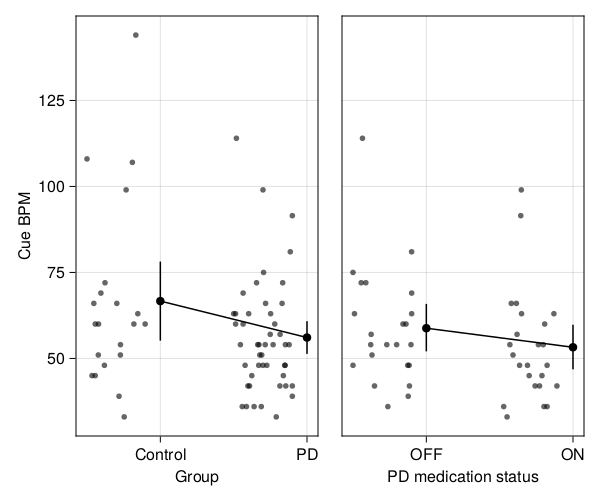

In [143]:
let variable = :cue_bpm, lmm = cue_rrt_lmm05
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(@subset(rrtdata, :cued .== false)) * mapping(:group, variable) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel="Cue BPM")

    aog_p += AlgebraOfGraphics.data(let data = @subset(rrtdata, :cued .== false)
            gd = groupby(data, :group)
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = @subset(rrtdata, :cued .== false)
            gd = groupby(data, :group)
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(rrtdata, :group .== "PD", :cued .== false)) * 
        mapping(:meds, variable) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(rrtdata, :group .== "PD", :cued .== false)
            gd = groupby(data, :meds)
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, :group_meds .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
        end) * mapping(:meds, variable) * (visual(Scatter) + visual(Lines))
    draw!(axright, aog_p)
    save("cue_bpm_rrt.png", fg)
    fg
end

##### Post-hoc: Session learning effect in control group

In [78]:
gd = groupby(sort!(@subset(rrtdata, :group .== "Control", :cued .== false), :session), :subject)
OneSampleTTest(convert(Vector{Float64}, combine(gd, :cue_bpm => diff)[!, :cue_bpm_diff]))

One sample t-test
-----------------
Population details:
    parameter of interest:   Mean
    value under h_0:         0
    point estimate:          2.77778
    95% confidence interval: (-9.916, 15.47)

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.6274

Details:
    number of observations:   9
    t-statistic:              0.504638765041128
    degrees of freedom:       8
    empirical standard error: 5.504487507120839


### BPM_err

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [144]:
bpmerr_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 2130 	 Time: 0:00:00 ( 0.32 ms/it)
  objective:  1003.0567433904164


Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -501.5284  1003.0567  1101.0567  1158.0335  1243.7768

Variance components:
                          Column                   Variance Std.Dev.   Corr.
sample   (Intercept)                               136.24116 11.67224
         group_meds: PD vs Control                  95.18390  9.75622 -0.67
         group_meds: PD_ON vs PD_OFF               215.87618 14.69273 -0.84 +0.17
         cued: true                                  7.17222  2.67810 -0.67 +0.64 +0.43
         group_meds: PD vs Control & cued: true    130.81231 11.43732 +0.10 -0.19 +0.00 -0.79
         group_meds: PD_ON vs PD_OFF & cued: true    2.72176  1.64978 -0.29 +0.90 -0.27 +0.44 -0.18
subject  (Intercept)                                81.61648  9.03418


In [145]:
bpmerr_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds * cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -528.6874  1057.3748  1095.3748  1101.9265  1150.7153

Variance components:
                          Column                    Variance   Std.Dev.    Corr.
sample   (Intercept)                               188.8345762 13.7417094
         group_meds: PD vs Control                   0.0390164  0.1975257   .  
         group_meds: PD_ON vs PD_OFF                19.5386582  4.4202554   .     .  
         cued: true                                  0.0000000  0.0000000   .     .     .  
         group_meds: PD vs Control & cued: true      0.0004896  0.0221268   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true    0.0000000  0.0000000   .     .     .     .     . 

In [146]:
bpmerr_rrt_lmm02.rePCA

(sample = [0.25, 0.5, 0.75, 1.0, 1.0, 1.0], subject = [0.25, 0.5, 0.75, 1.0, 1.0, 1.0])

In [147]:
bpmerr_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds * cued + zerocorr(1+cued+group_meds|subject) + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 216 	 Time: 0:00:00 ( 0.68 ms/it)


Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued + group_meds | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -528.7240  1057.4480  1085.4480  1088.9191  1126.2252

Variance components:
                    Column             Variance   Std.Dev.    Corr.
sample   (Intercept)                  188.8597931 13.7426269
         group_meds: PD vs Control      0.1246267  0.3530251   .  
         group_meds: PD_ON vs PD_OFF   17.4783303  4.1807093   .     .  
subject  (Intercept)                   21.0183490  4.5845773
         cued: true                    43.0084738  6.5580846   .  
         group_meds: PD vs Control      0.0012153  0.0348608   .     .  
         group_meds: PD_ON vs PD_OFF    0.0000000  0.0000000   .     .     .  
Residual                               26.8633475  5.1829864
 Number of obs: 136; levels of grouping factors: 6

In [148]:
bpmerr_rrt_lmm03.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0], subject = [0.3333333333333333, 0.6666666666666666, 1.0, 1.0])

In [149]:
bpmerr_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds * cued + zerocorr(1+cued|subject) + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 104 	 Time: 0:00:00 ( 1.29 ms/it)


Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -528.7233  1057.4466  1081.4466  1083.9832  1116.3984

Variance components:
                    Column            Variance Std.Dev.   Corr.
sample   (Intercept)                  182.64401 13.51458
         group_meds: PD vs Control     38.32089  6.19039   .  
         group_meds: PD_ON vs PD_OFF   42.96075  6.55444   .     .  
subject  (Intercept)                   20.56391  4.53474
         cued: true                    42.91246  6.55076   .  
Residual                               26.92040  5.18849
 Number of obs: 136; levels of grouping factors: 67, 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|

In [150]:
bpmerr_rrt_lmm04.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0], subject = [0.5, 1.0])

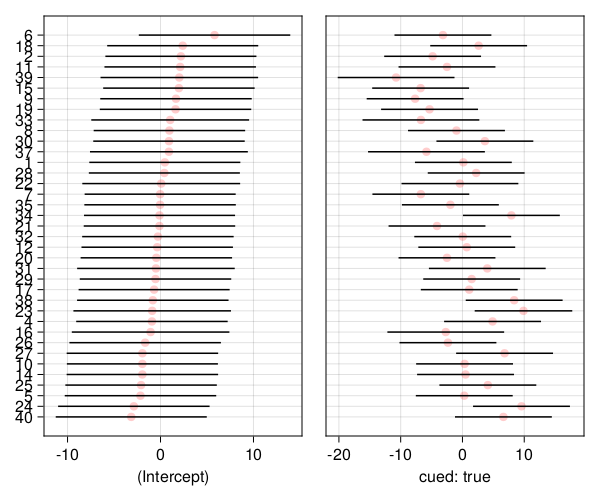

In [151]:
caterpillar!(
  Figure(; resolution=(600, 500)),
  ranefinfo(bpmerr_rrt_lmm04, :subject),
)

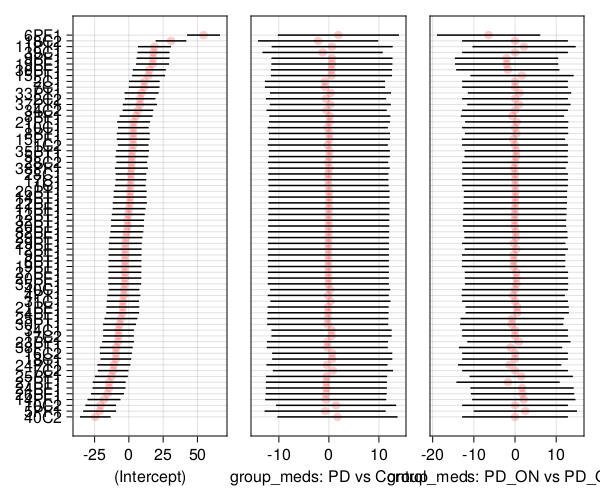

In [152]:
caterpillar!(
  Figure(; resolution=(600, 500)),
  ranefinfo(bpmerr_rrt_lmm04, :sample),
)

##### **Dropping non-significant variance components:**

In [153]:
bpmerr_rrt_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds * cued + zerocorr(1+cued|subject) + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued | subject)) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -528.7272  1057.4545  1077.4545  1079.2145  1106.5810

Variance components:
            Column    Variance Std.Dev.   Corr.
subject  (Intercept)   21.26479  4.61138
         cued: true    43.01557  6.55863   .  
sample   (Intercept)  191.51557 13.83891
Residual               26.88331  5.18491
 Number of obs: 136; levels of grouping factors: 37, 67

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.600348     1.96608  -0.31    0.7601
group_meds: PD vs Control                 -0.5012       8.46151  -0.06    0.9528


In [154]:
likelihoodratiotest(bpmerr_rrt_lmm04, bpmerr_rrt_lmm05)

|                                                                                                                                                      | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:---------------------------------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued \| subject)) + (1 \| sample)                                    |        10 |     1057 |     |        |        |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued \| subject)) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        12 |     1057 |   0 |      2 | 0.9960 |


In [167]:
bpmerr_rrt_lmm06 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds * cued + (1|subject) + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -529.2848  1058.5696  1076.5696  1077.9982  1102.7835

Variance components:
            Column   Variance Std.Dev.
sample   (Intercept)  170.0804 13.0415
subject  (Intercept)    0.0000  0.0000
Residual               51.5050  7.1767
 Number of obs: 136; levels of grouping factors: 67, 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.695024     1.81895  -0.38    0.7024
group_meds: PD vs Control                 -0.717826     7.83787  -0.09    0.9270
group_meds: PD_ON vs PD_OFF                6.39303      4.38469   1.46    0.1448
cued: true

In [168]:
likelihoodratiotest(bpmerr_rrt_lmm06, bpmerr_rrt_lmm05)

|                                                                                                                   | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:----------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample)                              |         9 |     1059 |     |        |        |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued \| subject)) + (1 \| sample) |        10 |     1057 |   1 |      1 | 0.2910 |


In [169]:
bpmerr_rrt_lmm07 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds * cued + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -529.2848  1058.5696  1074.5696  1075.7035  1097.8708

Variance components:
            Column   Variance Std.Dev.
sample   (Intercept)  170.0804 13.0415
Residual               51.5050  7.1767
 Number of obs: 136; levels of grouping factors: 67

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.695024     1.81895  -0.38    0.7024
group_meds: PD vs Control                 -0.717826     7.83787  -0.09    0.9270
group_meds: PD_ON vs PD_OFF                6.39303      4.38469   1.46    0.1448
cued: true                                -3.66468      1.2327   -2.9

In [170]:
likelihoodratiotest(bpmerr_rrt_lmm05, bpmerr_rrt_lmm06, bpmerr_rrt_lmm07)

|                                                                                                                   | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:----------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 \| sample)                                               |         8 |     1059 |     |        |        |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample)                              |         9 |     1059 |   0 |      1 | NaN    |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued \| subject)) + (1 \| sample) |        10 |     1057 |   1 |      1 | 0.2910 |


##### **Random effects caterpillar chart**

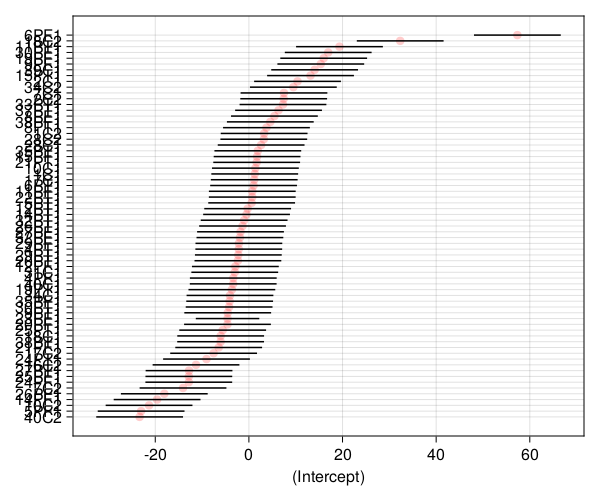

In [171]:
caterpillar!(
  Figure(; resolution=(600, 500)),
  ranefinfo(bpmerr_rrt_lmm07, :sample),
)

##### PD only analysis diversion

In [ ]:
PD_bpmerr_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1+meds*cued+
            (1+meds*cued|subject)),
        @subset(rrtdata, :group .== "PD"); contrasts)
    print(lmtmp)
    lmtmp
end;

In [ ]:
PD_bpmerr_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1+meds*cued+
            zerocorr(1+meds*cued|subject)),
        @subset(rrtdata, :group .== "PD"); contrasts)
    print(lmtmp)
    lmtmp
end;

In [ ]:
PD_bpmerr_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1+meds*cued+
            zerocorr(1+meds+cued|subject)),
        @subset(rrtdata, :group .== "PD"); contrasts)
    print(lmtmp)
    lmtmp
end;

In [ ]:
PD_bpmerr_rrt_lmm03.rePCA

In [ ]:
PD_bpmerr_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1+meds*cued+
            zerocorr(1+meds|subject)),
        @subset(rrtdata, :group .== "PD"); contrasts)
    print(lmtmp)
    lmtmp
end;

In [ ]:
likelihoodratiotest(PD_bpmerr_rrt_lmm03, PD_bpmerr_rrt_lmm04)

In [ ]:
caterpillar!(
  Figure(; resolution=(600, 500)),
  ranefinfo(PD_bpmerr_rrt_lmm03, :subject),
)

##### **Bootstrap**

In [172]:
bpmerr_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, bpmerr_rrt_lmm07);

┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary

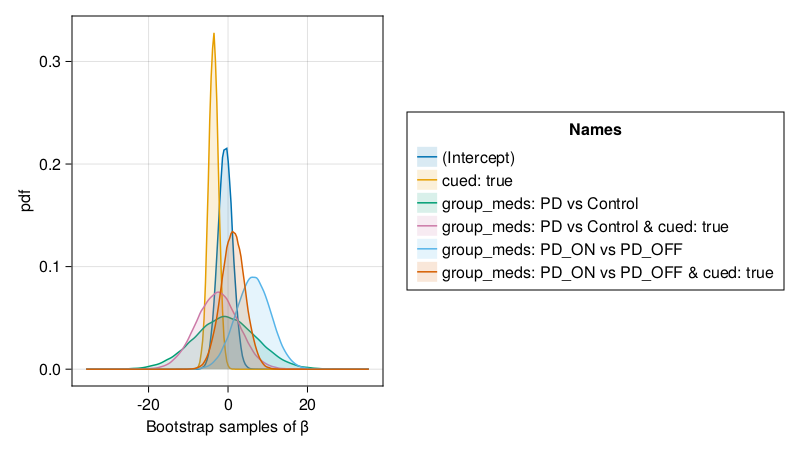

In [173]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(bpmerr_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

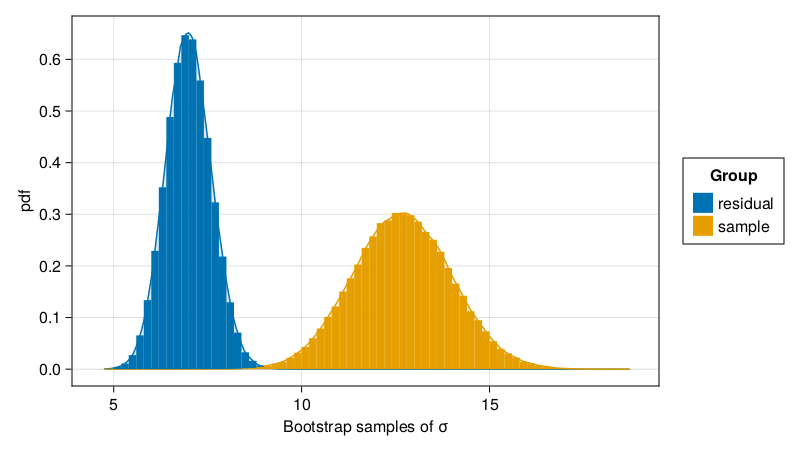

In [174]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(bpmerr_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [175]:
print(bpmerr_rrt_lmm07)

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -529.2848  1058.5696  1074.5696  1075.7035  1097.8708

Variance components:
            Column   Variance Std.Dev.
sample   (Intercept)  170.0804 13.0415
Residual               51.5050  7.1767
 Number of obs: 136; levels of grouping factors: 67

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.695024     1.81895  -0.38    0.7024
group_meds: PD vs Control                 -0.717826     7.83787  -0.09    0.9270
group_meds: PD_ON vs PD_OFF                6.39303      4.38469   1.46    0.1448
cued: true                                -3.66468      1.2327   -2.9

In [176]:
stats_summary(bpmerr_rrt_lmm07, bpmerr_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),-0.695024,"[-4.0,3.0]",1.81895,-0.382102,0.702386
2,group_meds: PD vs Control,-0.717826,"[-20.0,10.0]",7.83787,-0.0915843,0.927028
3,group_meds: PD_ON vs PD_OFF,6.39303,"[-2.0,20.0]",4.38469,1.45803,0.144831
4,cued: true,-3.66468,"[-6.0,-1.0]",1.2327,-2.97288,0.00295018
5,group_meds: PD vs Control & cued: true,-2.73597,"[-10.0,8.0]",5.32839,-0.51347,0.607623
6,group_meds: PD_ON vs PD_OFF & cued: true,1.24563,"[-4.0,7.0]",2.96155,0.420602,0.674046


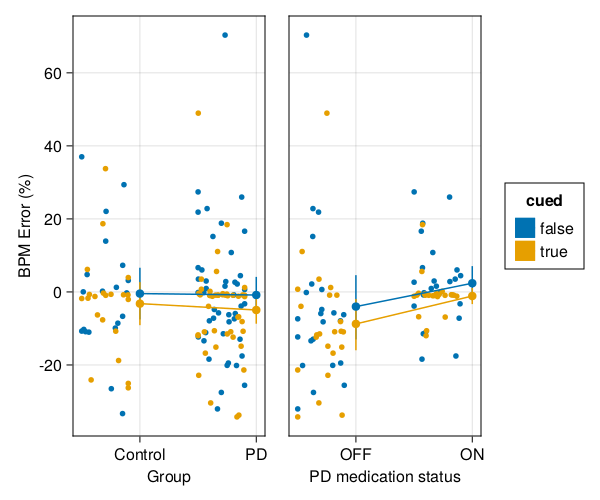

In [419]:
let variable = :bpm_err, _data = rrtdata, lmm = bpmerr_rrt_lmm07, ylabel="BPM Error (%)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
    
    legend!(fg[1,3], grid)
    save("$(variable)_rrt.png", fg)
    fg
end

### Step time asym

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [192]:
steptimeasym_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 741 	 Time: 0:00:00 ( 0.28 ms/it)


Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -360.3693   720.7386   818.7386   877.0719   960.7327

Variance components:
                          Column                   Variance Std.Dev.   Corr.
sample   (Intercept)                                2.762308 1.662019
         group_meds: PD vs Control                 10.696492 3.270549 -0.28
         group_meds: PD_ON vs PD_OFF                7.289882 2.699978 -0.11 -0.13
         cued: true                                 0.819873 0.905468 -0.87 +0.47 -0.23
         group_meds: PD vs Control & cued: true    12.079691 3.475585 +0.82 -0.65 -0.21 -0.66
         group_meds: PD_ON vs PD_OFF & cued: true   5.472272 2.339289 -0.12 -0.13 -0.05 -0.19 -0.27
subject  (Intercept)                               12.951574 3.

In [193]:
steptimeasym_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -367.2566   734.5131   772.5131   779.1798   827.5721

Variance components:
                          Column                   Variance Std.Dev.   Corr.
sample   (Intercept)                                0.187240 0.432713
         group_meds: PD vs Control                  4.556765 2.134658   .  
         group_meds: PD_ON vs PD_OFF                7.588587 2.754739   .     .  
         cued: true                                 0.000000 0.000000   .     .     .  
         group_meds: PD vs Control & cued: true     0.000000 0.000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true   5.744930 2.396858   .     .     .     .     .  
subject  (Intercept

In [194]:
steptimeasym_rrt_lmm02.rePCA

(sample = [0.25, 0.5, 0.75, 1.0, 1.0, 1.0], subject = [0.3333333333333333, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0])

In [197]:
steptimeasym_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + zerocorr(1+group_meds|subject) + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -368.0476   736.0952   762.0952   765.1286   799.7671

Variance components:
                    Column             Variance   Std.Dev.    Corr.
sample   (Intercept)                   0.00004084 0.00639028
         group_meds: PD vs Control     1.45115915 1.20464067   .  
         group_meds: PD_ON vs PD_OFF  24.33929393 4.93348700   .     .  
subject  (Intercept)                   9.06155175 3.01024114
         group_meds: PD vs Control    22.30472068 4.72278738   .  
         group_meds: PD_ON vs PD_OFF   4.69660444 2.16716507   .     .  
Residual                               6.65876963 2.58045919
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
────────────────────────────────────────────

In [196]:
steptimeasym_rrt_lmm03.rePCA

(sample = [0.5, 1.0, 1.0], subject = [0.4234491483515908, 0.7331255094437767, 1.0])

In [198]:
steptimeasym_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + zerocorr(1+group_meds|subject) + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject)) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -368.0590   736.1181   758.1181   760.2820   789.9943

Variance components:
                    Column            Variance   Std.Dev.   Corr.
subject  (Intercept)                  12.3550034 3.5149685
         group_meds: PD vs Control     0.0002168 0.0147252   .  
         group_meds: PD_ON vs PD_OFF  16.7032845 4.0869652   .     .  
sample   (Intercept)                   0.1205397 0.3471883
Residual                               6.6588713 2.5804789
 Number of obs: 134; levels of grouping factors: 37, 66

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────

In [199]:
steptimeasym_rrt_lmm04.rePCA

(subject = [0.3333333333333333, 0.6666666666666666, 1.0], sample = [1.0])

In [200]:
steptimeasym_rrt_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + zerocorr(1+group_meds|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
  -368.0613   736.1226   756.1226   757.9112   785.1010

Variance components:
                    Column           Variance Std.Dev.  Corr.
subject  (Intercept)                  12.42757 3.52528
         group_meds: PD vs Control     0.00000 0.00000   .  
         group_meds: PD_ON vs PD_OFF  16.91921 4.11330   .     .  
Residual                               6.68390 2.58532
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.338489    0.671331  -0.50    0.6141
group

In [201]:
likelihoodratiotest(steptimeasym_rrt_lmm04, steptimeasym_rrt_lmm05)

|                                                                                                                                | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------------------------------------------ | ---------:| --------:| ---:| ------:|:------ |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject))                 |        10 |      736 |     |        |        |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) + (1 \| sample) |        11 |      736 |   0 |      1 | 0.9465 |


In [202]:
steptimeasym_rrt_lmm06 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + (1|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -376.0898   752.1796   768.1796   769.3316   791.3623

Variance components:
            Column   Variance Std.Dev.
subject  (Intercept)  11.30060 3.36164
Residual              10.37288 3.22069
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.307209    0.682248  -0.45    0.6525
group_meds: PD vs Control                 -2.84276     2.9233    -0.97    0.3308
group_meds: PD_ON vs PD_OFF                1.43252     0.975294   1.47    0.1419
cued: true                                 0.813271    0.5573

In [203]:
likelihoodratiotest(steptimeasym_rrt_lmm05, steptimeasym_rrt_lmm06)

|                                                                                                                | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                                    |         8 |      752 |     |        |        |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) |        10 |      736 |  16 |      2 | 0.0003 |


In [204]:
steptimeasym_rrt_lmm05p1 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + zerocorr(0+group_meds|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((0 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
  -370.2101   740.4202   760.4202   762.2088   789.3986

Variance components:
                Column       Variance Std.Dev.  Corr.
subject  group_meds: Control  11.69606 3.41995
         group_meds: PD_OFF   18.08633 4.25280   .  
         group_meds: PD_ON    16.39731 4.04936   .     .  
Residual                       6.69163 2.58682
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.382324    0.61787   -0.62    0.5361
group_meds: PD vs Control                 -3.

In [213]:
steptimeasym_rrt_lmm05p2 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + (1+group_meds|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -368.0426   736.0852   762.0852   765.1185   799.7571

Variance components:
                    Column            Variance Std.Dev.   Corr.
subject  (Intercept)                  12.383352 3.518999
         group_meds: PD vs Control     0.186116 0.431412 +0.70
         group_meds: PD_ON vs PD_OFF  16.981472 4.120858 -0.03 -0.18
Residual                               6.691347 2.586764
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.339254    0.670838  -0.51    0.6131
group_meds: PD vs

In [214]:
likelihoodratiotest(steptimeasym_rrt_lmm05, steptimeasym_rrt_lmm05p2)

|                                                                                                                | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) |        10 |      736 |     |        |        |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds \| subject)                       |        13 |      736 |   0 |      3 | 0.9981 |


In [215]:
steptimeasym_rrt_lmm05p3 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + zerocorr(1+fulldummy(group_meds)|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
  -368.0426   736.0852   758.0852   760.2491   789.9615

Variance components:
                Column       VarianceStd.Dev.  Corr.
subject  (Intercept)          8.49760 2.91506
         group_meds: Control  3.19812 1.78833   .  
         group_meds: PD_OFF   9.00410 3.00068   .     .  
         group_meds: PD_ON    7.97657 2.82428   .     .     .  
Residual                      6.69139 2.58677
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.339253    0.67084   -0

In [216]:
likelihoodratiotest(steptimeasym_rrt_lmm05, steptimeasym_rrt_lmm05p3)

|                                                                                                                | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) |        10 |      736 |     |        |        |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) |        11 |      736 |   0 |      1 | 0.8468 |


In [209]:
steptimeasym_rrt_lmm03p1 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds * cued + zerocorr(1+group_meds|subject) + zerocorr(0+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject)) + MixedModels.ZeroCorr((0 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -368.0389   736.0778   762.0778   765.1111   799.7497

Variance components:
                    Column            Variance Std.Dev.   Corr.
sample   group_meds: Control           0.158300 0.397869
         group_meds: PD_OFF            6.838368 2.615027   .  
         group_meds: PD_ON             5.812295 2.410870   .     .  
subject  (Intercept)                   8.935547 2.989239
         group_meds: PD vs Control    23.443006 4.841798   .  
         group_meds: PD_ON vs PD_OFF   4.363108 2.088805   .     .  
Residual                               6.659682 2.580636
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────

##### **Random effects caterpillar chart**

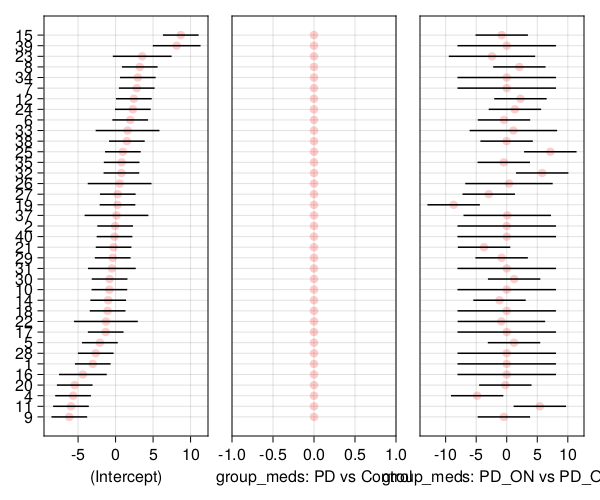

In [207]:
let lmm = steptimeasym_rrt_lmm05
    caterpillar!(
      Figure(; resolution=(600, 500)),
      ranefinfo(lmm, :subject),
    )
end

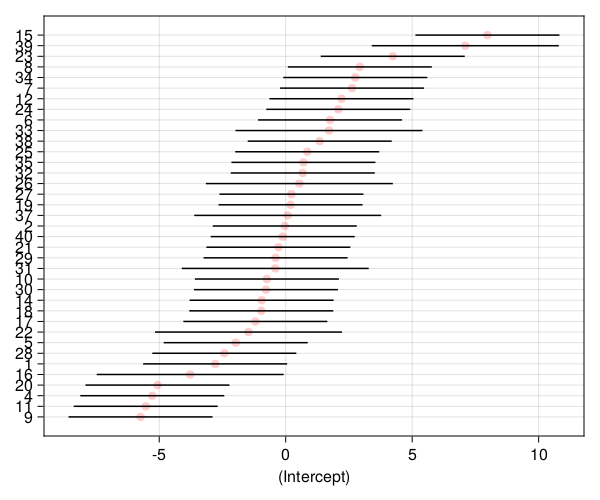

In [212]:
let lmm = steptimeasym_rrt_lmm06
    caterpillar!(
      Figure(; resolution=(600, 500)),
      ranefinfo(lmm, :subject),
    )
end

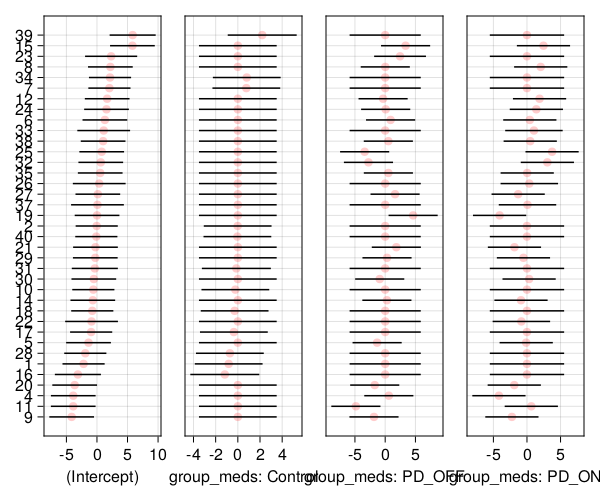

In [230]:
let lmm = steptimeasym_rrt_lmm05p3
    caterpillar!(
      Figure(; resolution=(600, 500)),
      ranefinfo(lmm, :subject),
    )
end

##### **Bootstrap**

In [232]:
steptimeasym_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, steptimeasym_rrt_lmm05);

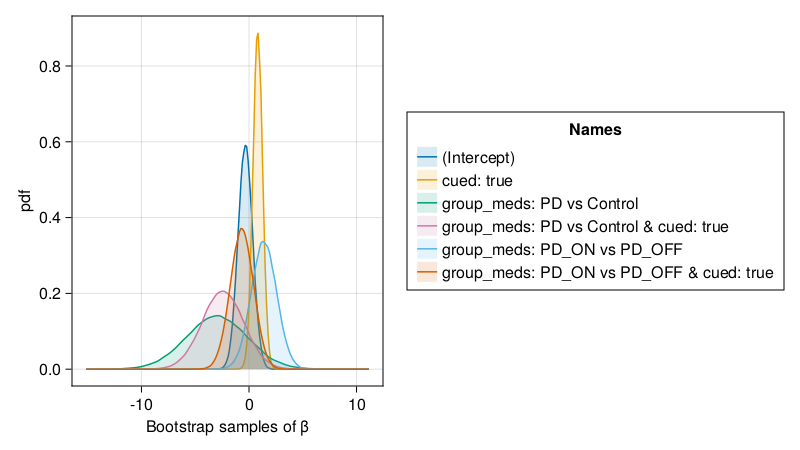

In [233]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(steptimeasym_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

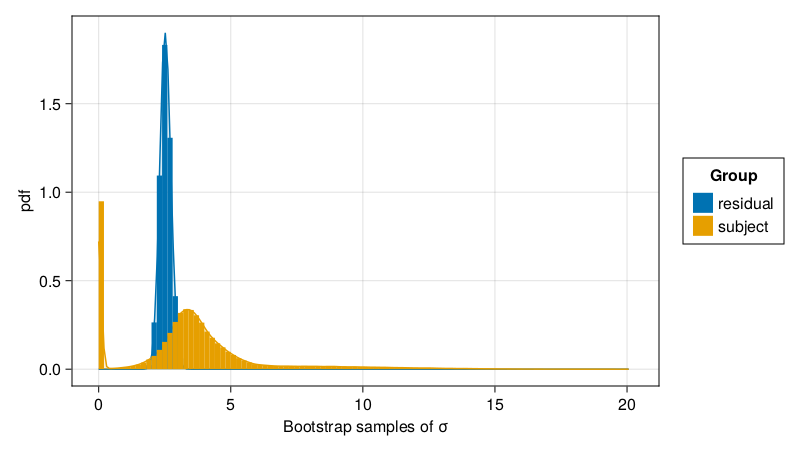

In [235]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(steptimeasym_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [236]:
print(steptimeasym_rrt_lmm05)

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
  -368.0613   736.1226   756.1226   757.9112   785.1010

Variance components:
                    Column           Variance Std.Dev.  Corr.
subject  (Intercept)                  12.42757 3.52528
         group_meds: PD vs Control     0.00000 0.00000   .  
         group_meds: PD_ON vs PD_OFF  16.91921 4.11330   .     .  
Residual                               6.68390 2.58532
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.338489    0.671331  -0.50    0.6141
group

In [237]:
stats_summary(steptimeasym_rrt_lmm05, steptimeasym_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),-0.338489,"[-2.0,1.0]",0.671331,-0.504206,0.614117
2,group_meds: PD vs Control,-2.99253,"[-8.0,3.0]",2.85554,-1.04797,0.294651
3,group_meds: PD_ON vs PD_OFF,1.38756,"[-0.9,4.0]",1.18012,1.17578,0.239683
4,cued: true,0.813271,"[-0.06,2.0]",0.44736,1.81793,0.0690744
5,group_meds: PD vs Control & cued: true,-2.42345,"[-6.0,1.0]",1.92636,-1.25805,0.208375
6,group_meds: PD_ON vs PD_OFF & cued: true,-0.659059,"[-3.0,1.0]",1.07918,-0.610706,0.541394


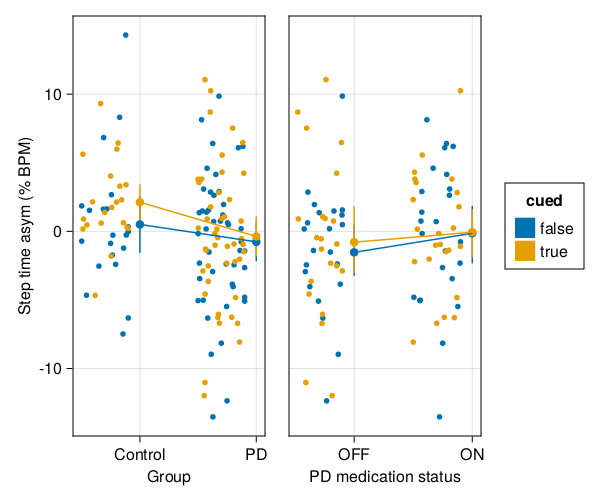

In [240]:
let variable = :step_time_asym, _data = @subset(rrtdata, .!ismissing.($variable)), lmm = steptimeasym_rrt_lmm05, ylabel="Step time asym (% BPM)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
    
    legend!(fg[1,3], grid)
    save("$(variable)_rrt.png", fg)
    fg
end

### PCI

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [244]:
pci_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 961 	 Time: 0:00:00 ( 0.31 ms/it)
  objective:  600.1161605942913


Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -300.0581   600.1162   698.1162   756.4495   840.1103

Variance components:
                          Column                  Variance Std.Dev.   Corr.
sample   (Intercept)                               0.918174 0.958214
         group_meds: PD vs Control                 2.498832 1.580770 +0.81
         group_meds: PD_ON vs PD_OFF               6.094185 2.468640 +0.75 +0.48
         cued: true                                0.495659 0.704030 -0.97 -0.88 -0.81
         group_meds: PD vs Control & cued: true    3.295403 1.815325 -0.93 -0.93 -0.77 +0.99
         group_meds: PD_ON vs PD_OFF & cued: true  2.509042 1.583996 -0.75 -0.49 -0.99 +0.81 +0.77
subject  (Intercept)                               5.520209 2.349512
         gro

In [245]:
pci_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds * cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -311.5611   623.1223   661.1223   667.7889   716.1812

Variance components:
                          Column                  Variance Std.Dev.  Corr.
sample   (Intercept)                                0.00000 0.00000
         group_meds: PD vs Control                  0.00000 0.00000   .  
         group_meds: PD_ON vs PD_OFF               10.89112 3.30017   .     .  
         cued: true                                 0.00000 0.00000   .     .     .  
         group_meds: PD vs Control & cued: true     0.00000 0.00000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true   0.00000 0.00000   .     .     .     .     .  
subject  (Intercept)                        

In [246]:
pci_rrt_lmm02.rePCA

(sample = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0])

In [247]:
pci_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds * cued + (1|subject) + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -313.7134   627.4268   645.4268   646.8784   671.5074

Variance components:
            Column   VarianceStd.Dev.
sample   (Intercept)  1.72268 1.31251
subject  (Intercept)  5.16868 2.27347
Residual              2.98393 1.72740
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                                8.65676     0.461968  18.74    <1e-77
group_meds: PD vs Control                  2.59276     1.97817    1.31    0.1900
group_meds: PD_ON vs PD_OFF                0.351823    0.661258   0.53    0.5947
cued: true        

In [248]:
pci_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds * cued + (1|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -316.9743   633.9486   649.9486   651.1006   673.1313

Variance components:
            Column   VarianceStd.Dev.
subject  (Intercept)  5.86500 2.42178
Residual              4.02067 2.00516
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                                8.65552     0.469801  18.42    <1e-75
group_meds: PD vs Control                  2.4938      2.0119     1.24    0.2152
group_meds: PD_ON vs PD_OFF                0.405071    0.608386   0.67    0.5055
cued: true                                -0.217501    0.34697   -0.63    0

In [249]:
likelihoodratiotest(pci_rrt_lmm03, pci_rrt_lmm04)

|                                                                                  | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| pci ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                 |         8 |      634 |     |        |        |
| pci ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample) |         9 |      627 |   7 |      1 | 0.0107 |


Variance components in `pci_rrt_lmm04` are significant; `pci_rrt_lmm04` is the optimally reduced model.

##### **Random effects caterpillar chart**

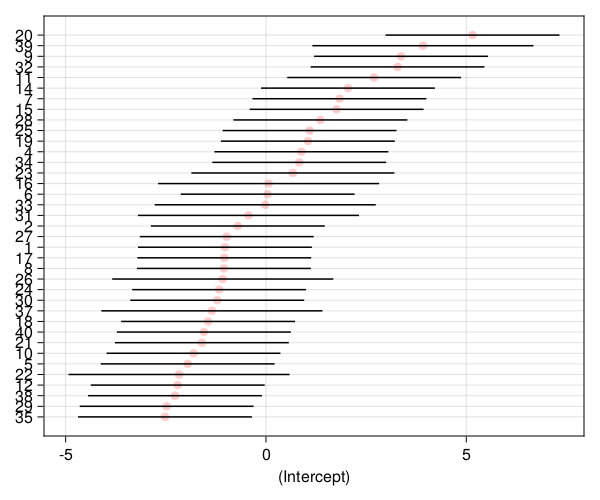

In [251]:
caterpillar!(
  Figure(; resolution=(600, 500)),
  ranefinfo(pci_rrt_lmm03, :subject),
)

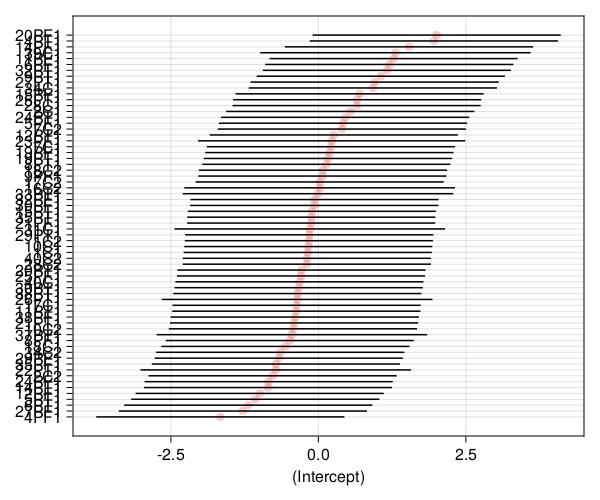

In [252]:
caterpillar!(
  Figure(; resolution=(600, 500)),
  ranefinfo(pci_rrt_lmm03, :sample),
)

In [253]:
pci_rrt_lmm = pci_rrt_lmm04;

##### **Bootstrap**

In [254]:
pci_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, pci_rrt_lmm);

┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180


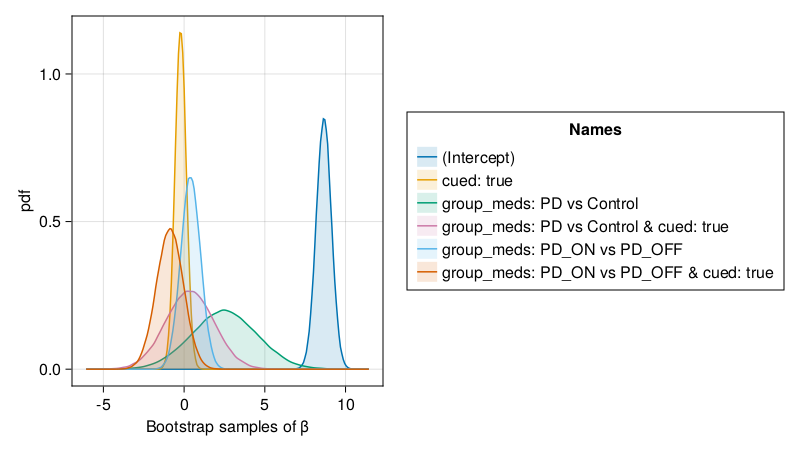

In [255]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(pci_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

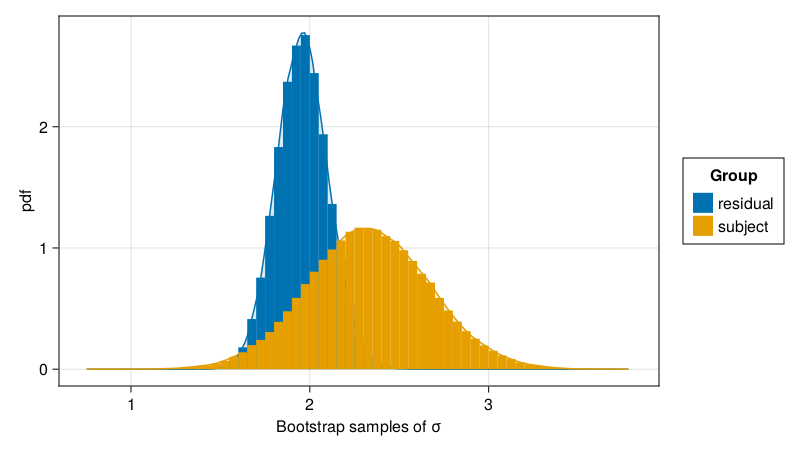

In [303]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(pci_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [257]:
print(pci_rrt_lmm)

Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -316.9743   633.9486   649.9486   651.1006   673.1313

Variance components:
            Column   VarianceStd.Dev.
subject  (Intercept)  5.86500 2.42178
Residual              4.02067 2.00516
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                                8.65552     0.469801  18.42    <1e-75
group_meds: PD vs Control                  2.4938      2.0119     1.24    0.2152
group_meds: PD_ON vs PD_OFF                0.405071    0.608386   0.67    0.5055
cued: true                                -0.217501    0.34697   -0.63    0

In [258]:
stats_summary(pci_rrt_lmm, pci_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),8.65552,"[8.0,10.0]",0.469801,18.4238,8.46068e-76
2,group_meds: PD vs Control,2.4938,"[-2.0,6.0]",2.0119,1.23952,0.215151
3,group_meds: PD_ON vs PD_OFF,0.405071,"[-0.8,2.0]",0.608386,0.665813,0.505531
4,cued: true,-0.217501,"[-0.9,0.5]",0.34697,-0.62686,0.530751
5,group_meds: PD vs Control & cued: true,0.351051,"[-3.0,3.0]",1.49407,0.234962,0.814238
6,group_meds: PD_ON vs PD_OFF & cued: true,-0.877979,"[-3.0,0.8]",0.837001,-1.04896,0.294197


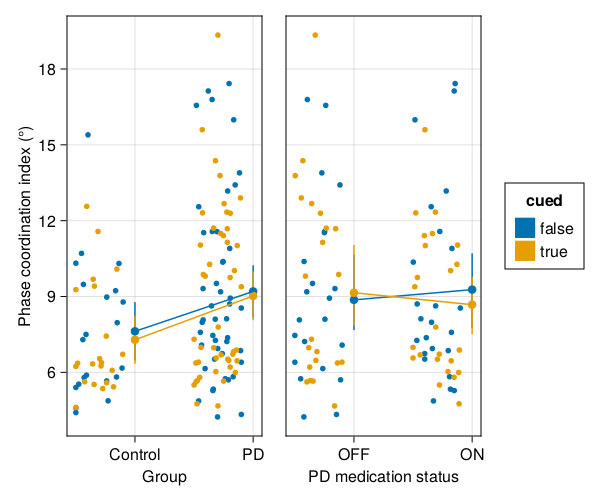

In [259]:
let variable = :pci, _data = @subset(rrtdata, .!ismissing.($variable)), lmm = pci_rrt_lmm, ylabel="Phase coordination index (°)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
    
    legend!(fg[1,3], grid)
    save("$(variable)_rrt.png", fg)
    fg
end

### Clock var

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [260]:
clockvar_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(clock_var ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 1830 	 Time: 0:00:00 ( 0.31 ms/it)
  objective:  -924.4632589094875


Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
   462.2316  -924.4633  -826.4633  -768.1299  -684.4691

Variance components:
                          Column                   Variance   Std.Dev.    Corr.
sample   (Intercept)                               0.00001114 0.00333812
         group_meds: PD vs Control                 0.00028625 0.01691904 +0.98
         group_meds: PD_ON vs PD_OFF               0.00037279 0.01930788 +0.90 +0.92
         cued: true                                0.00000445 0.00211007 -0.49 -0.36 -0.47
         group_meds: PD vs Control & cued: true    0.00005472 0.00739732 -0.77 -0.69 -0.75 +0.92
         group_meds: PD_ON vs PD_OFF & cued: true  0.00038193 0.01954300 -0.64 -0.68 -0.87 +0.48 +0.68
subject  (Intercept)                           

In [261]:
clockvar_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(clock_var ~ 1 + group_meds * cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
   421.4113  -842.8225  -804.8225  -798.1559  -749.7636

Variance components:
                          Column                   Variance   Std.Dev.    Corr.
sample   (Intercept)                               0.00000000 0.00000000
         group_meds: PD vs Control                 0.00000000 0.00000484   .  
         group_meds: PD_ON vs PD_OFF               0.00083584 0.02891091   .     .  
         cued: true                                0.00000000 0.00000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.00000000 0.00000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.00078779 0.02806753   .     .     .     .     .  
sub

In [262]:
pci_rrt_lmm02.rePCA

(sample = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0])

In [263]:
clockvar_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(clock_var ~ 1 + group_meds * cued + (1|subject) + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
   411.1773  -822.3545  -804.3545  -802.9029  -778.2740

Variance components:
            Column    Variance   Std.Dev.  
sample   (Intercept)  0.00000568 0.00238371
subject  (Intercept)  0.00003897 0.00624297
Residual              0.00009501 0.00974708
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.0106178   0.00161032   6.59    <1e-10
group_meds: PD vs Control                  0.0171853   0.00691305   2.49    0.0129
group_meds: PD_ON vs PD_OFF                0.00889667  0.00

In [264]:
clockvar_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(clock_var ~ 1 + group_meds * cued + (1|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
   411.1094  -822.2187  -806.2187  -805.0667  -783.0360

Variance components:
            Column    Variance   Std.Dev.  
subject  (Intercept)  0.00004105 0.00640718
Residual              0.00009854 0.00992663
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.0106102   0.00161698   6.56    <1e-10
group_meds: PD vs Control                  0.0171346   0.00694215   2.47    0.0136
group_meds: PD_ON vs PD_OFF                0.0089529   0.00298246   3.00    0.0027
cued: true                             

In [265]:
likelihoodratiotest(clockvar_rrt_lmm03, clockvar_rrt_lmm04)

|                                                                                        | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                 |         8 |     -822 |     |        |        |
| clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample) |         9 |     -822 |   0 |      1 | 0.7125 |


##### **Random effects caterpillar chart**

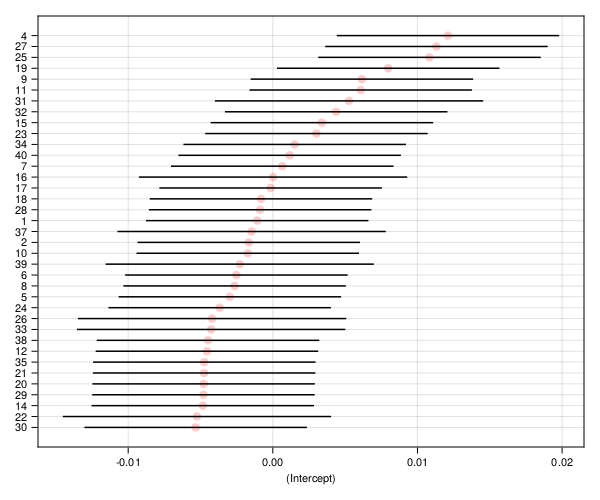

In [268]:
caterpillar!(
  Figure(; resolution=(600, 500), fontsize=11),
  ranefinfo(clockvar_rrt_lmm04, :subject),
)

In [269]:
clockvar_rrt_lmm = clockvar_rrt_lmm04;

##### **Bootstrap**

In [270]:
clockvar_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, clockvar_rrt_lmm);

┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary

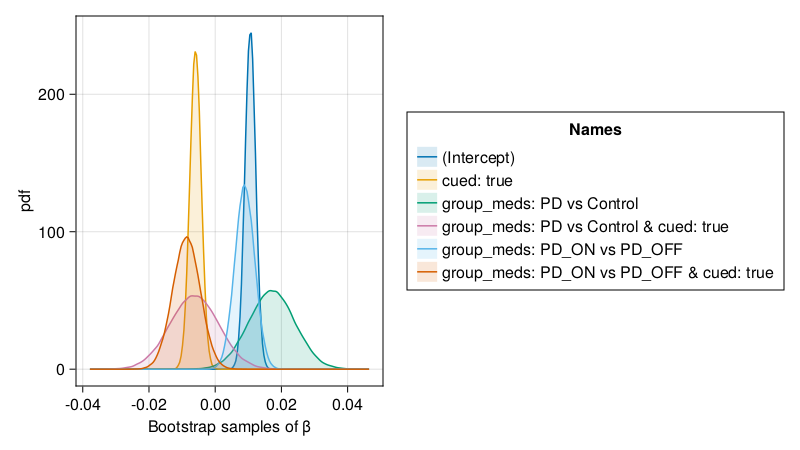

In [271]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(clockvar_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

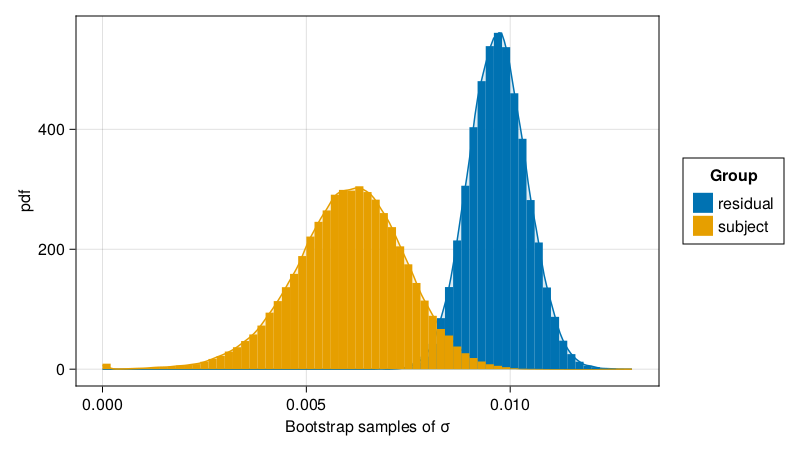

In [304]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(clockvar_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [273]:
print(clockvar_rrt_lmm)

Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
   411.1094  -822.2187  -806.2187  -805.0667  -783.0360

Variance components:
            Column    Variance   Std.Dev.  
subject  (Intercept)  0.00004105 0.00640718
Residual              0.00009854 0.00992663
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.0106102   0.00161698   6.56    <1e-10
group_meds: PD vs Control                  0.0171346   0.00694215   2.47    0.0136
group_meds: PD_ON vs PD_OFF                0.0089529   0.00298246   3.00    0.0027
cued: true                             

In [274]:
stats_summary(clockvar_rrt_lmm, clockvar_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),0.0106102,"[0.007,0.01]",0.00161698,6.56175,5.31802e-11
2,group_meds: PD vs Control,0.0171346,"[0.004,0.03]",0.00694215,2.4682,0.0135794
3,group_meds: PD_ON vs PD_OFF,0.0089529,"[0.003,0.01]",0.00298246,3.00185,0.00268341
4,cued: true,-0.00594086,"[-0.009,-0.003]",0.00171769,-3.45864,0.00054292
5,group_meds: PD vs Control & cued: true,-0.00629543,"[-0.02,0.008]",0.00739647,-0.85114,0.394692
6,group_meds: PD_ON vs PD_OFF & cued: true,-0.00868088,"[-0.02,-0.0006]",0.00414361,-2.095,0.0361706


In [27]:
mods = (clockvar_rrt_lmm04, rrtdata);
@rput mods;
R"""
mod_emm = emmeans(mods, list(pairwise ~ group_meds*cued))
summary(contrast(mod_emm, "pairwise")[c(6,8,9,11,12,15)], adjust = "holm")
"""

┌ Warning: RCall.jl: Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172
┌ Warning: RCall.jl: Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172


RObject{VecSxp}
 contrast                    estimate      SE  df t.ratio p.value
 PD_OFF false - PD_ON false -0.008953 0.00306 108  -2.928  0.0166
 PD_OFF false - PD_OFF true  0.002650 0.00306 102   0.865  1.0000
 PD_OFF false - PD_ON true   0.002378 0.00306 108   0.778  1.0000
 PD_ON false - PD_OFF true   0.011603 0.00306 108   3.795  0.0012
 PD_ON false - PD_ON true    0.011331 0.00293 102   3.864  0.0012
 PD_OFF true - PD_ON true   -0.000272 0.00306 108  -0.089  1.0000

Degrees-of-freedom method: kenward-roger 
P value adjustment: holm method for 6 tests 


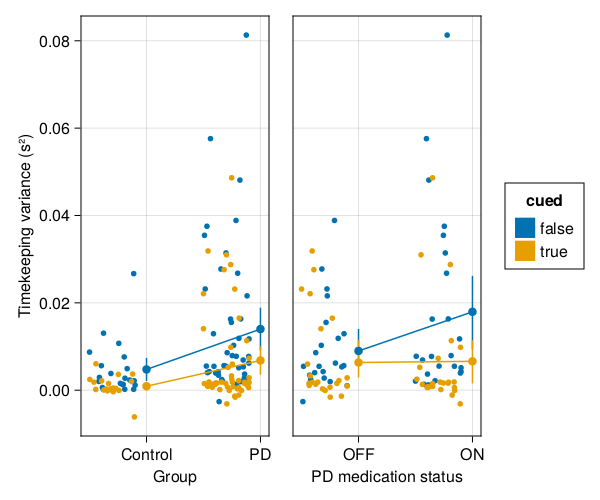

In [275]:
let variable = :clock_var, _data = @subset(rrtdata, .!ismissing.($variable)), lmm = clockvar_rrt_lmm, ylabel="Timekeeping variance (s²)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
    
    legend!(fg[1,3], grid)
    save("$(variable)_rrt.png", fg)
    fg
end

### Motor var

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [277]:
motorvar_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 997 	 Time: 0:00:00 ( 0.30 ms/it)
  objective:  -1184.3765673918417


Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
   592.1883 -1184.3766 -1086.3766 -1028.0432  -944.3824

Variance components:
                          Column                   Variance   Std.Dev.    Corr.
sample   (Intercept)                               0.00000103 0.00101251
         group_meds: PD vs Control                 0.00000923 0.00303787 +1.00
         group_meds: PD_ON vs PD_OFF               0.00001899 0.00435721 +0.08 +0.08
         cued: true                                0.00000132 0.00114676 -0.61 -0.61 +0.07
         group_meds: PD vs Control & cued: true    0.00001184 0.00344050 -0.61 -0.61 +0.07 +1.00
         group_meds: PD_ON vs PD_OFF & cued: true  0.00001600 0.00400061 -0.33 -0.33 -0.64 +0.50 +0.50
subject  (Intercept)                           

In [278]:
motorvar_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds * cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
   583.2201 -1166.4403 -1128.4403 -1121.7736 -1073.3813

Variance components:
                          Column                   Variance   Std.Dev.    Corr.
sample   (Intercept)                               0.00000000 0.00000000
         group_meds: PD vs Control                 0.00000000 0.00000000   .  
         group_meds: PD_ON vs PD_OFF               0.00000000 0.00000289   .     .  
         cued: true                                0.00000000 0.00000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.00000000 0.00000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.00003471 0.00589150   .     .     .     .     .  
sub

In [279]:
motorvar_rrt_lmm02.rePCA

(sample = [0.5, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [0.3333333333333333, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0])

In [283]:
motorvar_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds * cued + zerocorr(1+group_meds|subject) + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject)) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
   580.3517 -1160.7033 -1138.7033 -1136.5394 -1106.8271

Variance components:
                    Column            Variance   Std.Dev.    Corr.
subject  (Intercept)                  0.00000157 0.00125369
         group_meds: PD vs Control    0.00003693 0.00607733   .  
         group_meds: PD_ON vs PD_OFF  0.00001130 0.00336084   .     .  
sample   (Intercept)                  0.00000000 0.00000000
Residual                              0.00000639 0.00252708
 Number of obs: 134; levels of grouping factors: 37, 66

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────

In [28]:
motorvar_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds * cued + zerocorr(1+group_meds|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 73 	 Time: 0:00:00 ( 3.52 ms/it)


Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + zerocorr(1 + group_meds | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
   580.3517 -1160.7033 -1140.7033 -1138.9147 -1111.7249

Variance components:
                    Column            Variance   Std.Dev.    Corr.
subject  (Intercept)                  0.00000157 0.00125368
         group_meds: PD vs Control    0.00003693 0.00607733   .  
         group_meds: PD_ON vs PD_OFF  0.00001130 0.00336085   .     .  
Residual                              0.00000639 0.00252708
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.000622125  0.00044867  

In [286]:
likelihoodratiotest(motorvar_rrt_lmm03, motorvar_rrt_lmm04)

|                                                                                                                           | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| motor_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject))                 |        10 |    -1161 |     |        |        |
| motor_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) + (1 \| sample) |        11 |    -1161 |   0 |      1 | NaN    |


In [293]:
motorvar_rrt_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds * cued + (1|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
   575.0690 -1150.1379 -1134.1379 -1132.9859 -1110.9552

Variance components:
            Column    Variance   Std.Dev.  
subject  (Intercept)  0.00000206 0.00143660
Residual              0.00000933 0.00305493
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.000642235  0.000444315  -1.45    0.1483
group_meds: PD vs Control                 -0.00238368   0.00190969   -1.25    0.2120
group_meds: PD_ON vs PD_OFF               -0.00149016   0.000912951  -1.63    0.1026
cued: true                 

In [294]:
likelihoodratiotest(motorvar_rrt_lmm04, motorvar_rrt_lmm05)

|                                                                                                           | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:--------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                                    |         8 |    -1150 |     |        |        |
| motor_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) |        10 |    -1161 |  11 |      2 | 0.0051 |


In [29]:
motorvar_rrt_lmm = motorvar_rrt_lmm04;

##### **Random effects caterpillar chart**

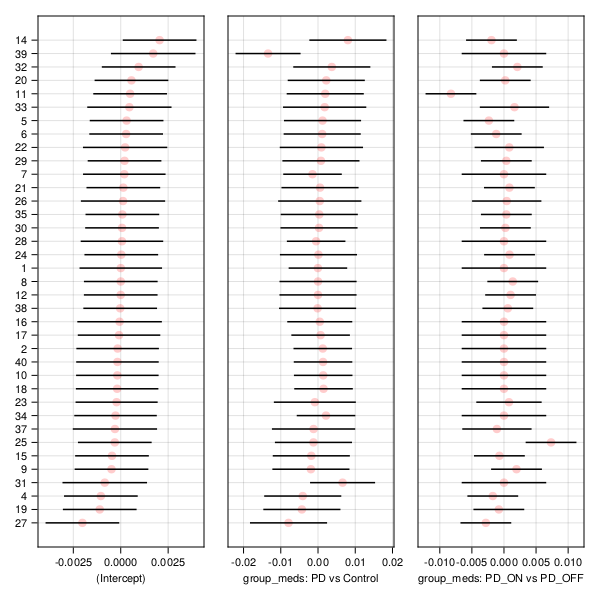

In [295]:
caterpillar!(
  Figure(; resolution=(600, 600), fontsize=11),
  ranefinfo(motorvar_rrt_lmm04, :subject),
)

##### **Bootstrap**

In [297]:
motorvar_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, motorvar_rrt_lmm);

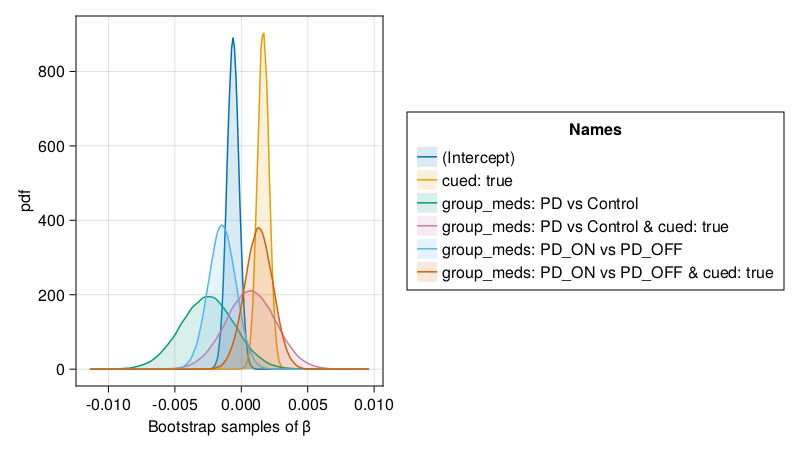

In [298]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(motorvar_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

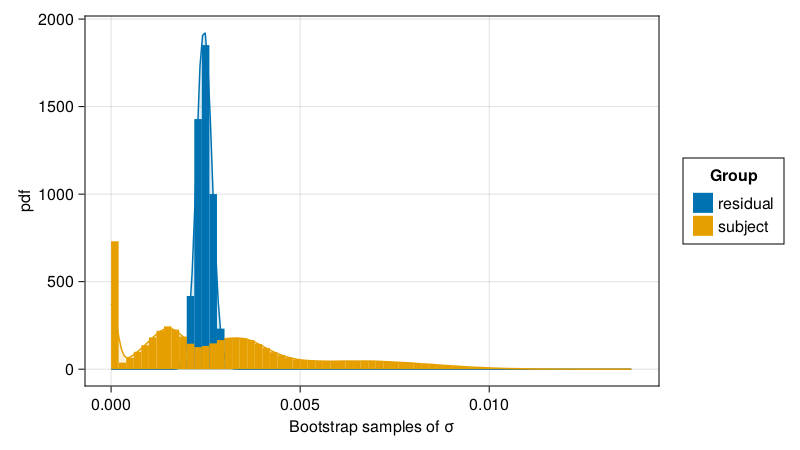

In [305]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(motorvar_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [300]:
print(motorvar_rrt_lmm)

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
   580.3517 -1160.7033 -1140.7033 -1138.9147 -1111.7249

Variance components:
                    Column            Variance   Std.Dev.    Corr.
subject  (Intercept)                  0.00000157 0.00125368
         group_meds: PD vs Control    0.00003693 0.00607733   .  
         group_meds: PD_ON vs PD_OFF  0.00001130 0.00336085   .     .  
Residual                              0.00000639 0.00252708
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.000622125

In [301]:
stats_summary(motorvar_rrt_lmm, motorvar_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),-0.000622125,"[-0.002,0.0002]",0.00044867,-1.3866,0.165564
2,group_meds: PD vs Control,-0.0025319,"[-0.007,0.001]",0.00204244,-1.23964,0.215108
3,group_meds: PD_ON vs PD_OFF,-0.00143922,"[-0.004,0.0005]",0.00102988,-1.39747,0.162274
4,cued: true,0.00165238,"[0.0008,0.003]",0.000437283,3.77874,0.000157621
5,group_meds: PD vs Control & cued: true,0.000713926,"[-0.003,0.004]",0.00188297,0.37915,0.704577
6,group_meds: PD_ON vs PD_OFF & cued: true,0.00132633,"[-0.0008,0.003]",0.00105486,1.25734,0.20863


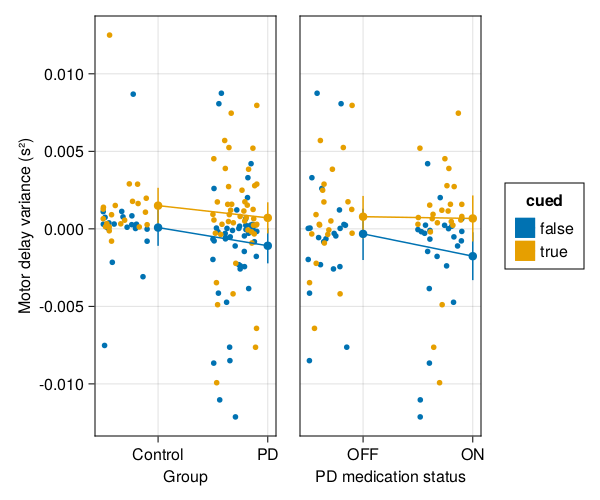

In [309]:
let variable = :motor_var, _data = @subset(rrtdata, .!ismissing.($variable)), lmm = motorvar_rrt_lmm, ylabel="Motor delay variance (s²)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
    
    legend!(fg[1,3], grid)
    save("$(variable)_rrt.png", fg)
    fg
end

### $P_I(1)$ (Lag one correlation)

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [310]:
lag1corr_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 1218 	 Time: 0:00:00 ( 0.40 ms/it)


Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
    -2.6689     5.3378   103.3378   161.6711   245.3319

Variance components:
                          Column                   Variance  Std.Dev.   Corr.
sample   (Intercept)                               0.0157293 0.1254166
         group_meds: PD vs Control                 0.0772561 0.2779497 -0.16
         group_meds: PD_ON vs PD_OFF               0.0145808 0.1207512 -0.90 -0.26
         cued: true                                0.0028127 0.0530353 -0.83 +0.57 +0.59
         group_meds: PD vs Control & cued: true    0.0065668 0.0810358 -0.70 +0.38 +0.57 +0.93
         group_meds: PD_ON vs PD_OFF & cued: true  0.0044614 0.0667939 -0.35 +0.43 +0.22 +0.37 +0.19
subject  (Intercept)                               0.0035474 

In [311]:
lag1corr_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds * cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
    -6.0484    12.0969    50.0969    56.7636   105.1558

Variance components:
                          Column                    Variance    Std.Dev.    Corr.
sample   (Intercept)                               0.014826190 0.121762842
         group_meds: PD vs Control                 0.034413409 0.185508515   .  
         group_meds: PD_ON vs PD_OFF               0.009795513 0.098972283   .     .  
         cued: true                                0.000000000 0.000000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.000000000 0.000000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000466 0.000682432   .     .     .    

In [312]:
lag1corr_rrt_lmm02.rePCA

(sample = [0.25, 0.5, 0.75, 1.0, 1.0, 1.0], subject = [0.5, 1.0, 1.0, 1.0, 1.0, 1.0])

In [313]:
lag1corr_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds * cued + zerocorr(1+cued|subject) + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
    -6.0563    12.1125    36.1125    38.6910    70.8866

Variance components:
                    Column           Variance Std.Dev.   Corr.
sample   (Intercept)                  0.011321 0.106400
         group_meds: PD vs Control    0.065706 0.256332   .  
         group_meds: PD_ON vs PD_OFF  0.026046 0.161388   .     .  
subject  (Intercept)                  0.000000 0.000000
         cued: true                   0.024284 0.155834   .  
Residual                              0.038227 0.195516
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)

In [314]:
lag1corr_rrt_lmm03.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0], subject = [1.0, 1.0])

In [315]:
lag1corr_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds * cued + (1|subject) + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
    -8.5566    17.1132    39.1132    41.2772    70.9895

Variance components:
                    Column            Variance  Std.Dev.   Corr.
sample   (Intercept)                  0.0037880 0.0615464
         group_meds: PD vs Control    0.0375312 0.1937296   .  
         group_meds: PD_ON vs PD_OFF  0.0329002 0.1813840   .     .  
subject  (Intercept)                  0.0050756 0.0712436
Residual                              0.0523568 0.2288162
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────

In [316]:
lag1corr_rrt_lmm04.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0], subject = [1.0])

In [318]:
lag1corr_rrt_lmm04p1 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds * cued + zerocorr(0+cued|subject) + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((0 + cued | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
    -5.5467    11.0933    35.0933    37.6719    69.8674

Variance components:
                    Column           Variance Std.Dev.   Corr.
sample   (Intercept)                  0.014264 0.119432
         group_meds: PD vs Control    0.021448 0.146451   .  
         group_meds: PD_ON vs PD_OFF  0.018672 0.136644   .     .  
subject  cued: false                  0.009827 0.099130
         cued: true                   0.025179 0.158679   .  
Residual                              0.033232 0.182297
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)

In [324]:
likelihoodratiotest(lag1corr_rrt_lmm03, lag1corr_rrt_lmm04)

|                                                                                                                                                        | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------------------------------------------------------------------ | ---------:| --------:| ---:| ------:|:------ |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample))                              |        11 |       17 |     |        |        |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued \| subject)) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        12 |       12 |   5 |      1 | 0.0253 |


In [323]:
likelihoodratiotest(lag1corr_rrt_lmm04, lag1corr_rrt_lmm04p1)

|                                                                                                                                                        | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------------------------------------------------------------------ | ---------:| --------:| ---:| ------:|:------ |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample))                              |        11 |       17 |     |        |        |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((0 + cued \| subject)) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        12 |       11 |   6 |      1 | 0.0141 |


In [328]:
lag1corr_rrt_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds * cued + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
    -8.6960    17.3920    37.3920    39.1806    66.3704

Variance components:
                    Column            Variance  Std.Dev.   Corr.
sample   (Intercept)                  0.0061130 0.0781857
         group_meds: PD vs Control    0.0563014 0.2372791   .  
         group_meds: PD_ON vs PD_OFF  0.0427023 0.2066454   .     .  
Residual                              0.0523547 0.2288114
 Number of obs: 134; levels of grouping factors: 66

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.0372262   0.0321409   1.16   

In [330]:
likelihoodratiotest(lag1corr_rrt_lmm04p1, lag1corr_rrt_lmm05)

|                                                                                                                                                        | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------------------------------------------------------------------ | ---------:| --------:| ---:| ------:|:------ |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| sample))                                               |        10 |       17 |     |        |        |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((0 + cued \| subject)) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        12 |       11 |   6 |      2 | 0.0429 |


In [341]:
lag1corr_rrt_lmm = lag1corr_rrt_lmm04p1;

##### **Random effects caterpillar chart**

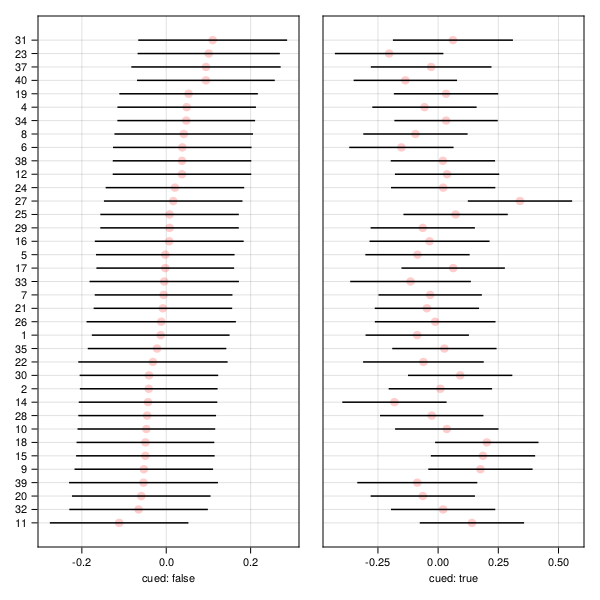

In [340]:
caterpillar!(
  Figure(; resolution=(600, 600), fontsize=11),
  ranefinfo(lag1corr_rrt_lmm04p1, :subject),
)

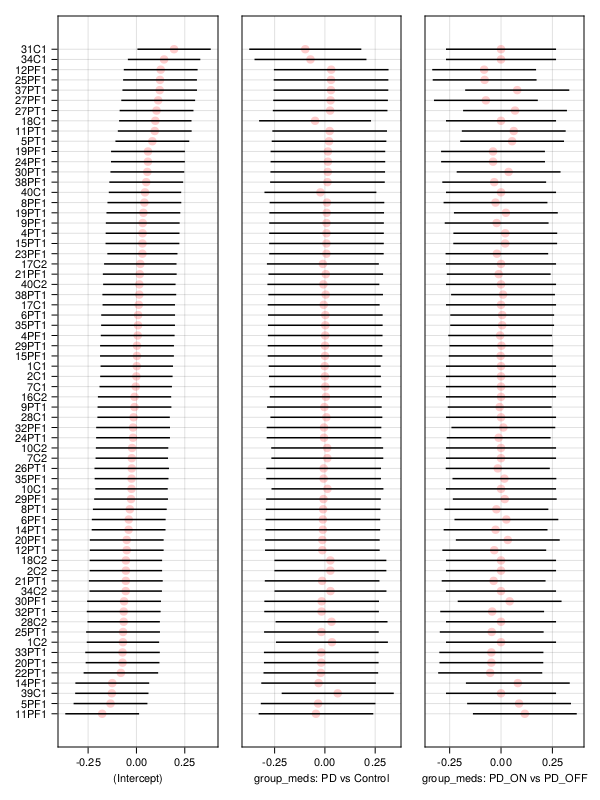

In [338]:
caterpillar!(
  Figure(; resolution=(600, 800), fontsize=11),
  ranefinfo(lag1corr_rrt_lmm04p1, :sample),
)

##### **Bootstrap**

In [342]:
lag1corr_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, lag1corr_rrt_lmm);

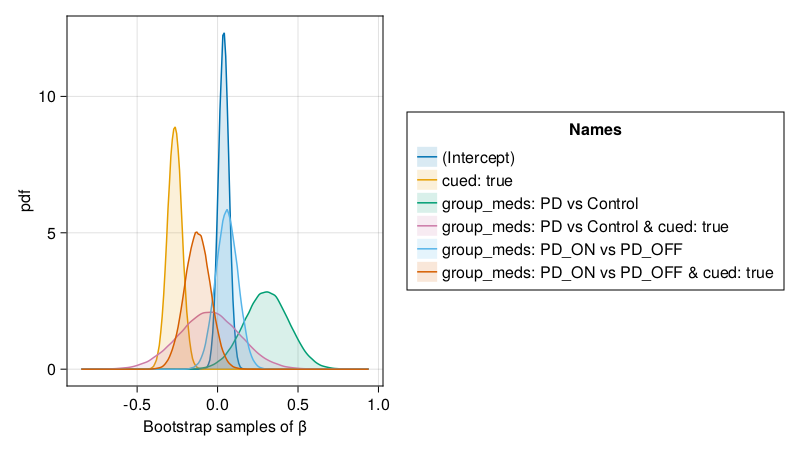

In [343]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(lag1corr_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

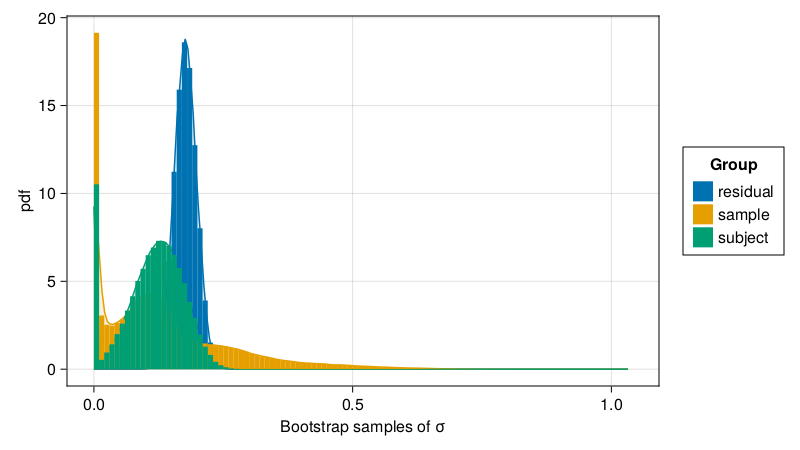

In [348]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(lag1corr_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [345]:
print(lag1corr_rrt_lmm)

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
   580.3517 -1160.7033 -1140.7033 -1138.9147 -1111.7249

Variance components:
                    Column            Variance   Std.Dev.    Corr.
subject  (Intercept)                  0.00000157 0.00125368
         group_meds: PD vs Control    0.00003693 0.00607733   .  
         group_meds: PD_ON vs PD_OFF  0.00001130 0.00336085   .     .  
Residual                              0.00000639 0.00252708
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.000622125

In [346]:
stats_summary(lag1corr_rrt_lmm, lag1corr_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),0.0382095,"[-0.03,0.1]",0.0325221,1.17488,0.240043
2,group_meds: PD vs Control,0.305108,"[0.04,0.6]",0.138645,2.20064,0.0277619
3,group_meds: PD_ON vs PD_OFF,0.0568689,"[-0.08,0.2]",0.0689544,0.824731,0.409524
4,cued: true,-0.26642,"[-0.4,-0.2]",0.0443964,-6.00094,1.96178e-9
5,group_meds: PD vs Control & cued: true,-0.0518358,"[-0.4,0.3]",0.190554,-0.272027,0.785601
6,group_meds: PD_ON vs PD_OFF & cued: true,-0.124573,"[-0.3,0.03]",0.0781497,-1.59403,0.11093


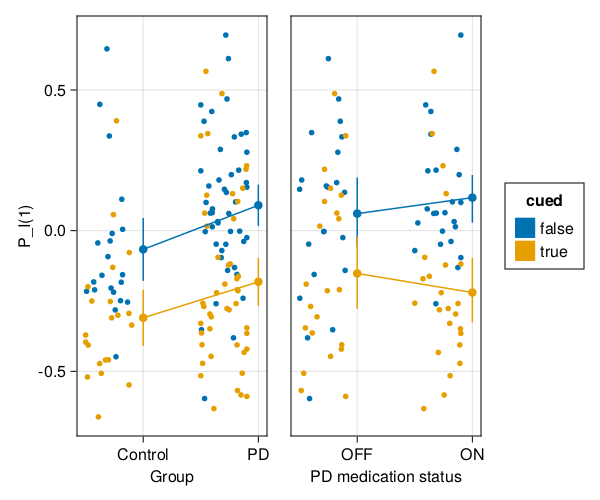

In [347]:
let variable = :lag1_corr, _data = @subset(rrtdata, .!ismissing.($variable)), lmm = lag1corr_rrt_lmm, ylabel="P_I(1)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
    
    legend!(fg[1,3], grid)
    save("$(variable)_rrt.png", fg)
    fg
end

### MA Step time COV

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [351]:
macov_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 1330 	 Time: 0:00:00 ( 0.31 ms/it)
  objective:  587.4629295838258


Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -293.7315   587.4629   685.4629   742.4397   828.1830

Variance components:
                          Column                   Variance Std.Dev.   Corr.
sample   (Intercept)                                2.148378 1.465735
         group_meds: PD vs Control                  0.293157 0.541439 -0.52
         group_meds: PD_ON vs PD_OFF                2.234757 1.494910 -0.19 +0.58
         cued: true                                 1.427512 1.194785 -0.90 +0.46 +0.15
         group_meds: PD vs Control & cued: true     2.703717 1.644298 -0.32 +0.02 -0.07 +0.69
         group_meds: PD_ON vs PD_OFF & cued: true  10.184395 3.191300 -0.27 -0.27 -0.80 +0.33 +0.33
subject  (Intercept)                                3.171952 

In [352]:
macov_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds * cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -309.4017   618.8033   656.8033   663.3551   712.1438

Variance components:
                          Column                  Variance Std.Dev.   Corr.
sample   (Intercept)                               0.000000 0.000000
         group_meds: PD vs Control                 0.000000 0.000000   .  
         group_meds: PD_ON vs PD_OFF               4.472884 2.114919   .     .  
         cued: true                                0.000000 0.000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.000000 0.000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000 0.000000   .     .     .     .     .  
subject  (Intercept)    

In [353]:
macov_rrt_lmm02.rePCA

(sample = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [0.5000000000000001, 1.0, 1.0, 1.0, 1.0, 1.0])

In [354]:
macov_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds * cued + zerocorr(1+cued|subject) + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -309.4150   618.8299   642.8299   645.3665   677.7818

Variance components:
                    Column           VarianceStd.Dev.  Corr.
sample   (Intercept)                  0.00000 0.00000
         group_meds: PD vs Control    0.00000 0.00000   .  
         group_meds: PD_ON vs PD_OFF  4.35398 2.08662   .     .  
subject  (Intercept)                  1.93504 1.39106
         cued: true                   0.00000 0.00000   .  
Residual                              3.74352 1.93482
 Number of obs: 136; levels of grouping factors: 67, 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
────

In [363]:
macov_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds * cued + (1|subject) + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -309.9855   619.9710   637.9710   639.3996   664.1849

Variance components:
            Column   Variance Std.Dev. 
sample   (Intercept)  0.531334 0.728927
subject  (Intercept)  2.132309 1.460243
Residual              3.824945 1.955747
 Number of obs: 136; levels of grouping factors: 67, 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                                6.84471       0.351214  19.49    <1e-83
group_meds: PD vs Control                  2.66971       1.5106     1.77    0.0772
group_meds: PD_ON vs PD_OFF                0.562529      0.61956    

In [359]:
macov_rrt_lmm04p1 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds * cued + (1|subject) + zerocorr(0+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + MixedModels.ZeroCorr((0 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -309.3804   618.7607   640.7607   642.8898   672.7999

Variance components:
                Column       Variance Std.Dev.   Corr.
sample   group_meds: Control  0.000000 0.000000
         group_meds: PD_OFF   1.325592 1.151344   .  
         group_meds: PD_ON    0.852947 0.923551   .     .  
subject  (Intercept)          1.942512 1.393740
Residual                      3.743115 1.934713
 Number of obs: 136; levels of grouping factors: 67, 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                                6.8

In [361]:
macov_rrt_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds * cued + (1|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -310.3107   620.6213   636.6213   637.7552   659.9226

Variance components:
            Column   VarianceStd.Dev.
subject  (Intercept)  2.34221 1.53043
Residual              4.14939 2.03701
 Number of obs: 136; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                                6.84909       0.354587  19.32    <1e-82
group_meds: PD vs Control                  2.62995       1.52498    1.72    0.0846
group_meds: PD_ON vs PD_OFF                0.579096      0.604435   0.96    0.3380
cued: true                                -1.15627

In [49]:
macov_rrt_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds * cued + (1|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -307.9694   615.9389   631.9389   633.0727   655.2401

Variance components:
            Column   VarianceStd.Dev.
subject  (Intercept)  2.20671 1.48550
Residual              4.03124 2.00779
 Number of obs: 136; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                                6.81265     0.346807  19.64    <1e-85
group_meds: PD vs Control                  2.85312     1.49166    1.91    0.0558
group_meds: PD_ON vs PD_OFF                0.576744    0.595641   0.97    0.3329
cued: true                                -1.06173     0.34486

In [364]:
likelihoodratiotest(macov_rrt_lmm03, macov_rrt_lmm04, macov_rrt_lmm05)

|                                                                                                                                                               | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                                                                                 |         8 |      621 |     |        |        |
| ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample)                                                                 |         9 |      620 |   1 |      1 | 0.4200 |
| ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + cued \| subject)) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        12 |      619 |   1 |      3 | 0.7672 |


In [50]:
macov_rrt_lmm = macov_rrt_lmm05;

##### **Random effects caterpillar chart**

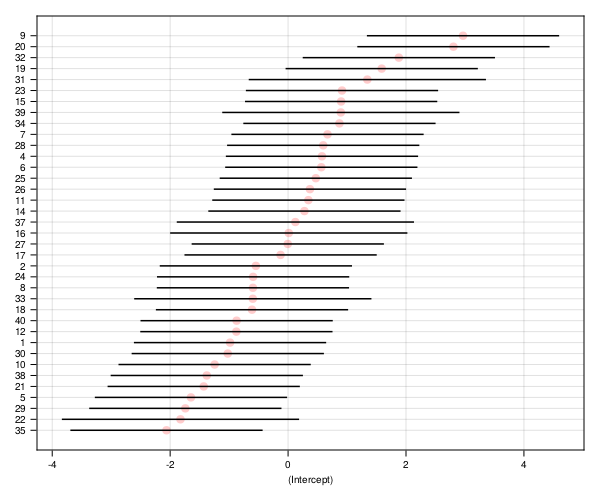

In [51]:
caterpillar!(
  Figure(; resolution=(600, 500), fontsize=10),
  ranefinfo(macov_rrt_lmm, :subject),
)

##### **Bootstrap**

In [52]:
macov_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, macov_rrt_lmm);

┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/mcePw/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/mcePw/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/mcePw/src/optsummary.jl:180


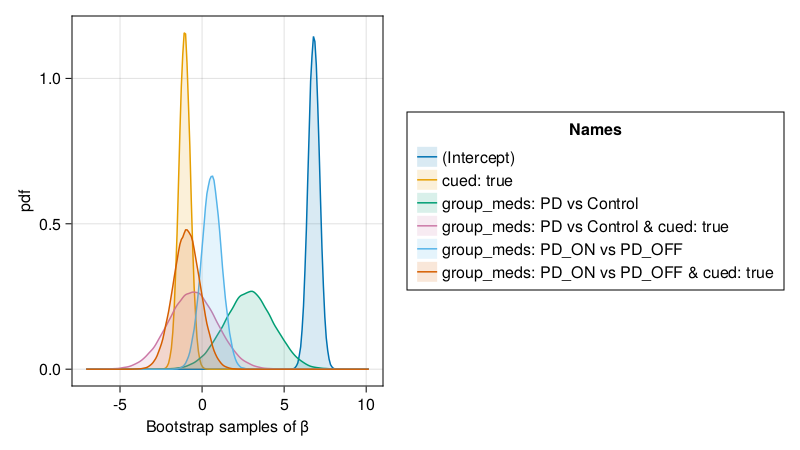

In [53]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(macov_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

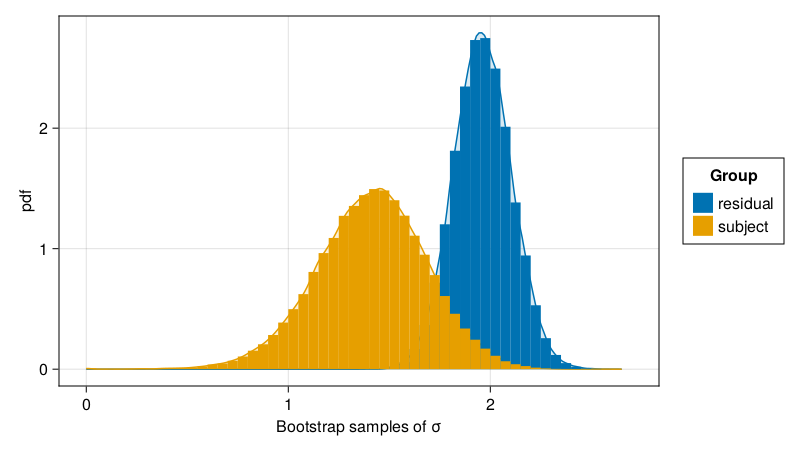

In [54]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(macov_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [55]:
print(macov_rrt_lmm)

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -307.9694   615.9389   631.9389   633.0727   655.2401

Variance components:
            Column   VarianceStd.Dev.
subject  (Intercept)  2.20671 1.48550
Residual              4.03124 2.00779
 Number of obs: 136; levels of grouping factors: 37

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                                6.81265     0.346807  19.64    <1e-85
group_meds: PD vs Control                  2.85312     1.49166    1.91    0.0558
group_meds: PD_ON vs PD_OFF                0.576744    0.595641   0.97    0.3329
cued: true                                -1.06173     0.34486

In [56]:
stats_summary(macov_rrt_lmm, macov_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),6.81265,"[6.0,8.0]",0.346807,19.6439,6.51708e-86
2,group_meds: PD vs Control,2.85312,"[-0.08,6.0]",1.49166,1.91272,0.0557845
3,group_meds: PD_ON vs PD_OFF,0.576744,"[-0.6,2.0]",0.595641,0.968273,0.332908
4,cued: true,-1.06173,"[-2.0,-0.4]",0.344868,-3.07866,0.00207936
5,group_meds: PD vs Control & cued: true,-0.569999,"[-4.0,2.0]",1.4907,-0.38237,0.702187
6,group_meds: PD_ON vs PD_OFF & cued: true,-0.941552,"[-3.0,0.6]",0.82854,-1.1364,0.25579


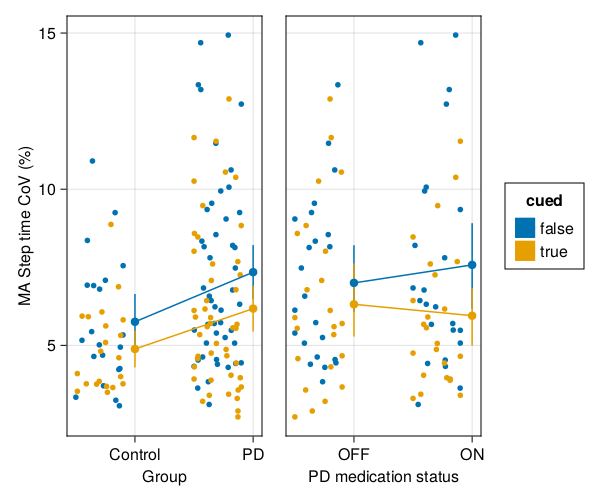

In [57]:
let variable = :ma_step_time_cov, _data = @subset(rrtdata, .!ismissing.($variable)), lmm = macov_rrt_lmm, ylabel="MA Step time CoV (%)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
    
    legend!(fg[1,3], grid)
    save("$(variable)_rrt.png", fg)
    fg
end

### LA Step time COV

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [377]:
lacov_rrt_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds * cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 1950 	 Time: 0:00:00 ( 0.28 ms/it)


Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -282.2254   564.4509   662.4509   720.7842   804.4450

Variance components:
                          Column                   Variance Std.Dev.   Corr.
sample   (Intercept)                                2.784596 1.668711
         group_meds: PD vs Control                  1.598012 1.264125 +0.23
         group_meds: PD_ON vs PD_OFF                4.339710 2.083197 +0.24 +0.72
         cued: true                                 1.687989 1.299226 -0.95 -0.37 -0.16
         group_meds: PD vs Control & cued: true     2.989962 1.729151 -0.70 +0.07 +0.03 +0.68
         group_meds: PD_ON vs PD_OFF & cued: true   7.914130 2.813206 -0.56 -0.30 -0.76 +0.37 +0.41
subject  (Intercept)                                1.557631 

In [378]:
lacov_rrt_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds * cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -296.2682   592.5363   630.5363   637.2030   685.5953

Variance components:
                          Column                  Variance Std.Dev.   Corr.
sample   (Intercept)                               0.192375 0.438606
         group_meds: PD vs Control                 0.100163 0.316486   .  
         group_meds: PD_ON vs PD_OFF               6.415880 2.532959   .     .  
         cued: true                                0.000000 0.000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.000000 0.000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000 0.000000   .     .     .     .     .  
subject  (Intercept)    

In [379]:
lacov_rrt_lmm02.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0], subject = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0])

In [380]:
lacov_rrt_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds * cued + (1|subject) + zerocorr(1+group_meds|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -296.2682   592.5363   614.5363   616.7003   646.4126

Variance components:
                    Column           Variance Std.Dev.   Corr.
sample   (Intercept)                  0.132677 0.364248
         group_meds: PD vs Control    0.635877 0.797419   .  
         group_meds: PD_ON vs PD_OFF  6.595882 2.568245   .     .  
subject  (Intercept)                  1.988571 1.410167
Residual                              2.844968 1.686703
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────────────────
(Interc

In [381]:
lacov_rrt_lmm03.rePCA

(sample = [0.33333333333333337, 0.6666666666666667, 1.0], subject = [1.0])

In [59]:
lacov_rrt_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds * cued + (1|subject) + (1|sample)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 23 	 Time: 0:00:00 (18.85 ms/it)


Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -296.0845   592.1690   610.1690   611.6207   636.2496

Variance components:
            Column   Variance Std.Dev. 
sample   (Intercept)  0.997414 0.998706
subject  (Intercept)  2.526634 1.589539
Residual              2.777104 1.666465
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────────────────
(Intercept)                                7.2761     0.356085  20.43    <1e-92
group_meds: PD vs Control                  4.24822    1.52628    2.78    0.0054
group_meds: PD_ON vs PD_OFF                1.08555    0.588341   1.85    0.0650
cue

In [383]:
likelihoodratiotest(lacov_rrt_lmm03, lacov_rrt_lmm04)

|                                                                                                                                  | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample)                                    |         9 |      594 |     |        |        |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        11 |      593 |   2 |      2 | 0.4585 |


In [384]:
lacov_rrt_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds * cued + (1|subject)),
        rrtdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -298.6739   597.3479   613.3479   614.4999   636.5306

Variance components:
            Column   VarianceStd.Dev.
subject  (Intercept)  2.81760 1.67857
Residual              3.47682 1.86462
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────────────────
(Intercept)                                7.23513    0.360051  20.09    <1e-89
group_meds: PD vs Control                  4.41578    1.54368    2.86    0.0042
group_meds: PD_ON vs PD_OFF                1.12083    0.56339    1.99    0.0467
cued: true                                -1.18493    0.322651  -3.6

In [385]:
likelihoodratiotest(lacov_rrt_lmm03, lacov_rrt_lmm04, lacov_rrt_lmm05)

|                                                                                                                                  | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                                                    |         8 |      597 |     |        |        |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample)                                    |         9 |      594 |   3 |      1 | 0.0713 |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        11 |      593 |   2 |      2 | 0.4585 |


In [60]:
lacov_rrt_lmm = lacov_rrt_lmm04;

##### **Random effects caterpillar chart**

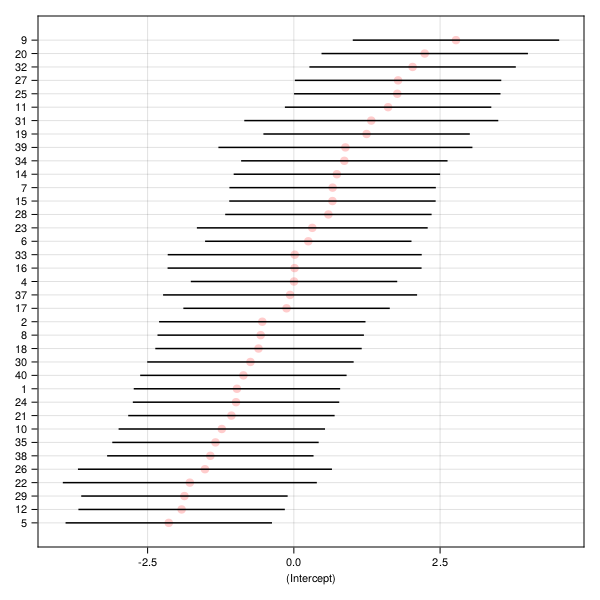

In [61]:
caterpillar!(
  Figure(; resolution=(600, 600), fontsize=11),
  ranefinfo(lacov_rrt_lmm, :subject),
)

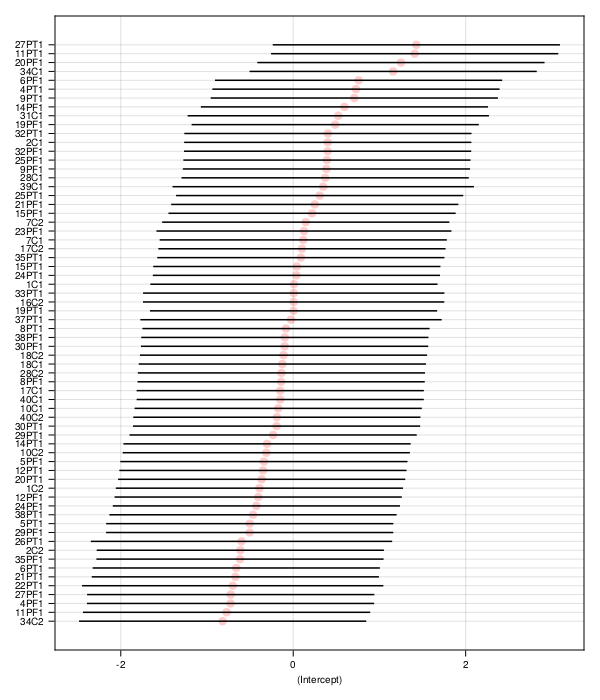

In [62]:
caterpillar!(
  Figure(; resolution=(600, 700), fontsize=10),
  ranefinfo(lacov_rrt_lmm, :sample),
)

##### **Bootstrap**

In [63]:
lacov_rrt_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, lacov_rrt_lmm);

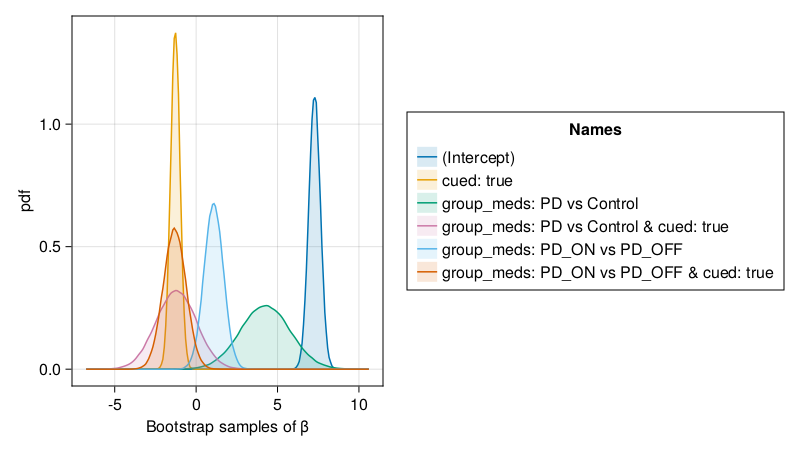

In [64]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(lacov_rrt_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

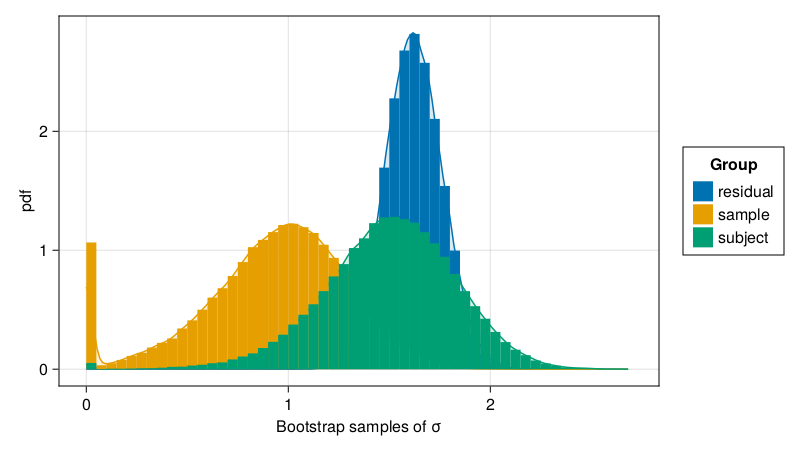

In [65]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(lacov_rrt_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [66]:
print(lacov_rrt_lmm)

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -296.0845   592.1690   610.1690   611.6207   636.2496

Variance components:
            Column   Variance Std.Dev. 
sample   (Intercept)  0.997414 0.998706
subject  (Intercept)  2.526634 1.589539
Residual              2.777104 1.666465
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────────────────
(Intercept)                                7.2761     0.356085  20.43    <1e-92
group_meds: PD vs Control                  4.24822    1.52628    2.78    0.0054
group_meds: PD_ON vs PD_OFF                1.08555    0.588341   1.85    0.0650
cue

In [67]:
stats_summary(lacov_rrt_lmm, lacov_rrt_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),7.2761,"[7.0,8.0]",0.356085,20.4336,8.41021e-93
2,group_meds: PD vs Control,4.24822,"[1.0,7.0]",1.52628,2.78338,0.00537965
3,group_meds: PD_ON vs PD_OFF,1.08555,"[-0.08,2.0]",0.588341,1.8451,0.0650232
4,cued: true,-1.27947,"[-2.0,-0.7]",0.288362,-4.43703,9.12098e-6
5,group_meds: PD vs Control & cued: true,-1.22322,"[-4.0,1.0]",1.24171,-0.985114,0.324568
6,group_meds: PD_ON vs PD_OFF & cued: true,-1.3221,"[-3.0,0.06]",0.695622,-1.9006,0.0573548


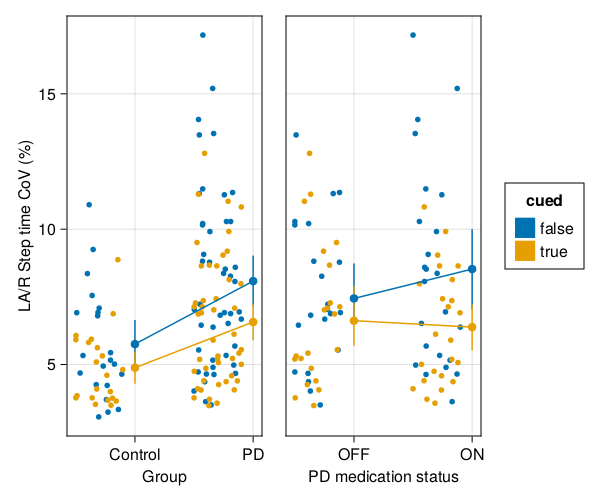

In [68]:
let variable = :la_step_time_cov, _data = @subset(rrtdata, .!ismissing.($variable)), lmm = lacov_rrt_lmm, ylabel="LA/R Step time CoV (%)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
    
    legend!(fg[1,3], grid)
    save("$(variable)_rrt.png", fg)
    fg
end

## SIPT Stats

### Cue BPM

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [17]:
cue_sip_lmm01 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + (1+group_meds|subject)+(1+group_meds|sample)),
        @subset(sipdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + (1 + group_meds | subject) + (1 + group_meds | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -297.1279   594.2557   626.2557   636.9224   661.7678

Variance components:
                    Column             Variance   Std.Dev.   Corr.
sample   (Intercept)                     0.640375  0.800234
         group_meds: PD vs Control       5.758813  2.399753 +1.00
         group_meds: PD_ON vs PD_OFF   320.563547 17.904289 -0.39 -0.39
subject  (Intercept)                   232.290291 15.241073
         group_meds: PD vs Control    1290.736208 35.926817 -0.04
         group_meds: PD_ON vs PD_OFF   122.571288 11.071192 -0.78 -0.03
Residual                               102.986329 10.148218
 Number of obs: 68; levels of grouping factors: 67, 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────
                                Coef.  Std. Error      z  Pr(>|z

In [18]:
cue_sip_lmm02 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + zerocorr(1+group_meds|subject) + zerocorr(1+group_meds|sample)),
        @subset(sipdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + MixedModels.ZeroCorr((1 + group_meds | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -298.5718   597.1435   617.1435   621.0032   639.3386

Variance components:
                    Column             Variance   Std.Dev.   Corr.
sample   (Intercept)                     0.000000  0.000000
         group_meds: PD vs Control       0.000000  0.000000   .  
         group_meds: PD_ON vs PD_OFF     0.009429  0.097103   .     .  
subject  (Intercept)                   270.814462 16.456441
         group_meds: PD vs Control    1072.083057 32.742679   .  
         group_meds: PD_ON vs PD_OFF   277.448984 16.656800   .     .  
Residual                               103.062816 10.151986
 Number of obs: 68; levels of grouping factors: 67, 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────
                    

In [20]:
cue_sip_lmm02.rePCA

(sample = [1.0, 1.0, 1.0], subject = [0.3333333333333333, 0.6666666666666666, 1.0])

In [19]:
cue_sip_lmm03 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + zerocorr(1+group_meds|subject)),
        @subset(sipdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + MixedModels.ZeroCorr((1 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
  -298.5718   597.1435   611.1435   613.0102   626.6801

Variance components:
                    Column            Variance Std.Dev.  Corr.
subject  (Intercept)                   270.8102 16.4563
         group_meds: PD vs Control    1072.3782 32.7472   .  
         group_meds: PD_ON vs PD_OFF   277.4678 16.6574   .     .  
Residual                               103.0561 10.1517
 Number of obs: 68; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────
                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────
(Intercept)                  124.063      3.27231  37.91    <1e-99
group_meds: PD vs Control     27.7007    14.4812    1.91    0.0558
group_meds: PD_ON vs PD_

In [21]:
cue_sip_lmm04 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + zerocorr(0+group_meds|subject)),
        @subset(sipdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + MixedModels.ZeroCorr((0 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
  -300.7010   601.4021   615.4021   617.2687   630.9386

Variance components:
                Column       Variance Std.Dev.  Corr.
subject  group_meds: Control  390.0048 19.7485
         group_meds: PD_OFF   535.4547 23.1399   .  
         group_meds: PD_ON    234.6053 15.3168   .     .  
Residual                      102.9741 10.1476
 Number of obs: 68; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────
                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────
(Intercept)                  124.177      2.99532  41.46    <1e-99
group_meds: PD vs Control     28.0438    13.9312    2.01    0.0441
group_meds: PD_ON vs PD_OFF  -12.8693     6.55515  -1.96    0.0496
──

In [22]:
likelihoodratiotest(cue_sip_lmm03, cue_sip_lmm04)

|                                                                              | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:---------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| cue_bpm ~ 1 + group_meds + MixedModels.ZeroCorr((1 + group_meds \| subject)) |         7 |      597 |     |        |        |
| cue_bpm ~ 1 + group_meds + MixedModels.ZeroCorr((0 + group_meds \| subject)) |         7 |      601 |  -4 |      0 | NaN    |


In [396]:
cue_sip_lmm05 = let
    lmtmp = fit(MixedModel, @formula(cue_bpm ~ 1 + group_meds + (1|subject)),
        @subset(sipdata, :cued .== false); contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -299.7362   599.4724   609.4724   610.4401   620.5699

Variance components:
            Column   Variance Std.Dev.
subject  (Intercept)  274.0917 16.5557
Residual              200.6388 14.1647
 Number of obs: 68; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────
                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────
(Intercept)                  124.075      3.23974  38.30    <1e-99
group_meds: PD vs Control     27.0734    13.9028    1.95    0.0515
group_meds: PD_ON vs PD_OFF  -13.1748     4.28238  -3.08    0.0021
──────────────────────────────────────────────────────────────────

In [24]:
likelihoodratiotest(cue_sip_lmm03, cue_sip_lmm05)

|                                                                              | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:---------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| cue_bpm ~ 1 + group_meds + (1 \| subject)                                    |         5 |      599 |     |        |        |
| cue_bpm ~ 1 + group_meds + MixedModels.ZeroCorr((1 + group_meds \| subject)) |         7 |      597 |   2 |      2 | 0.3121 |


`cue_sip_lmm05` is the optimally reduced model according to the LR tests and the various information criteria. Additionally, it is the same reduced model as for the RRT.

In [398]:
cue_sip_lmm = cue_sip_lmm05;

##### **Random effects caterpillar charts**

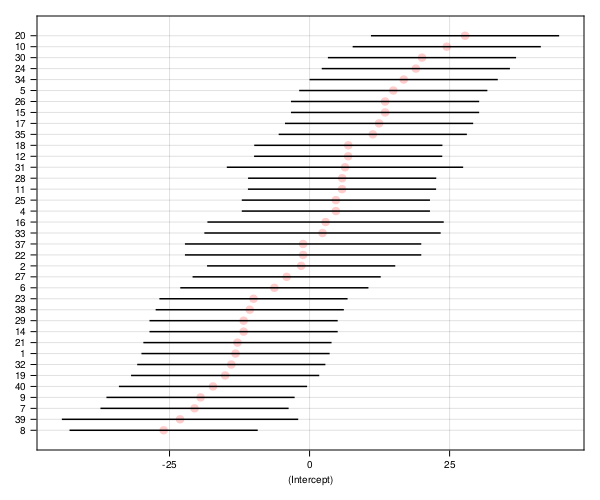

In [399]:
caterpillar!(
  Figure(; resolution=(600, 500), fontsize=10),
  ranefinfo(cue_sip_lmm, :subject),
)

##### **Bootstrap**

In [400]:
cue_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, cue_sip_lmm);

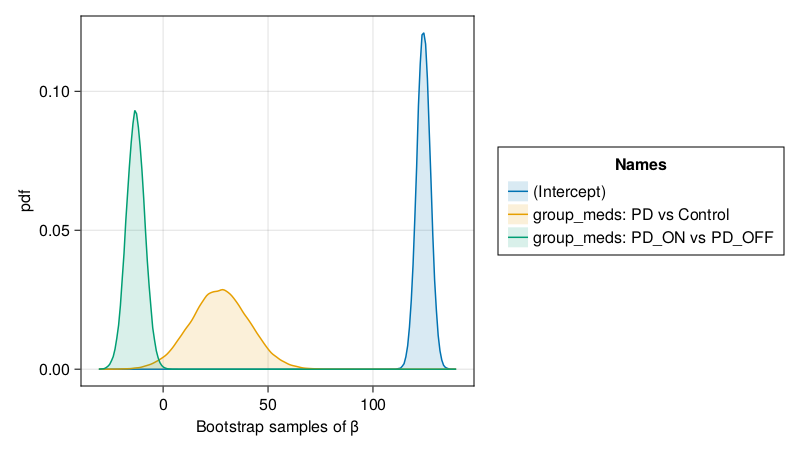

In [401]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(cue_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

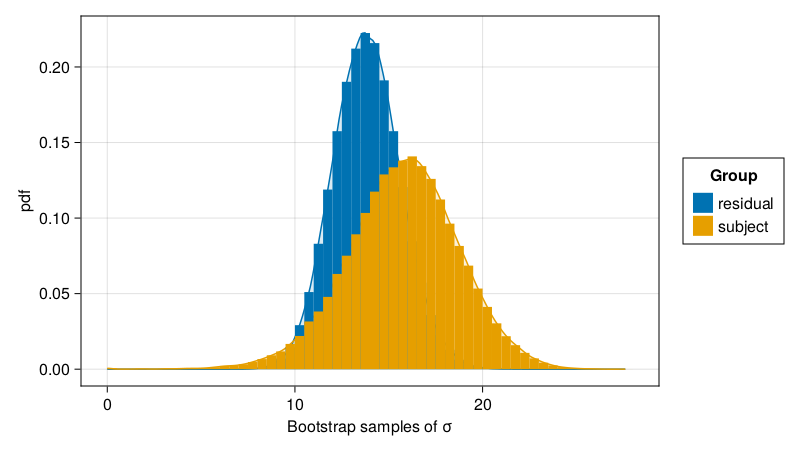

In [402]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(cue_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [403]:
print(cue_sip_lmm)

Linear mixed model fit by maximum likelihood
 cue_bpm ~ 1 + group_meds + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -299.7362   599.4724   609.4724   610.4401   620.5699

Variance components:
            Column   Variance Std.Dev.
subject  (Intercept)  274.0917 16.5557
Residual              200.6388 14.1647
 Number of obs: 68; levels of grouping factors: 37

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────
                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────
(Intercept)                  124.075      3.23974  38.30    <1e-99
group_meds: PD vs Control     27.0734    13.9028    1.95    0.0515
group_meds: PD_ON vs PD_OFF  -13.1748     4.28238  -3.08    0.0021
──────────────────────────────────────────────────────────────────

In [404]:
stats_summary(cue_sip_lmm, cue_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),124.075,"[100.0,100.0]",3.23974,38.2977,6.68e-321
2,group_meds: PD vs Control,27.0734,"[0.2,50.0]",13.9028,1.94734,0.0514943
3,group_meds: PD_ON vs PD_OFF,-13.1748,"[-20.0,-5.0]",4.28238,-3.07652,0.0020943


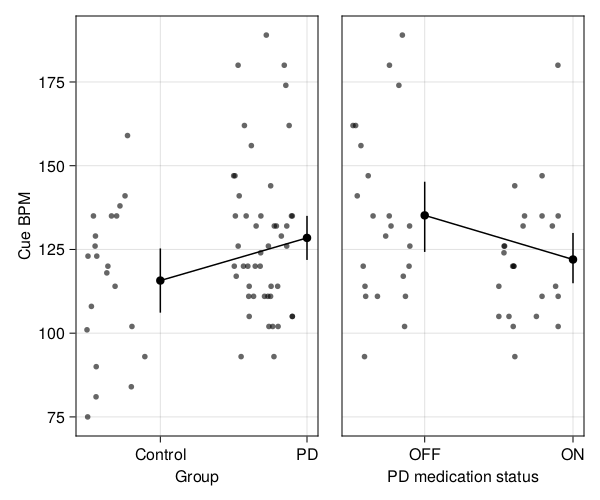

In [407]:
let variable = :cue_bpm
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(@subset(sipdata, :cued .== false)) * mapping(:group, variable) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel="Cue BPM")

    aog_p += AlgebraOfGraphics.data(let data = @subset(sipdata, :cued .== false)
            gd = groupby(data, :group)
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = @subset(sipdata, :cued .== false)
            gd = groupby(data, :group)
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(sipdata, :group .== "PD", :cued .== false)) * 
        mapping(:meds, variable) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(sipdata, :group .== "PD", :cued .== false)
            gd = groupby(data, :meds)
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(cue_sip_lmm), :group_meds .!= "Control")
            transform!(data, :group_meds .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
        end) * mapping(:meds, variable) * (visual(Scatter) + visual(Lines))
    draw!(axright, aog_p)
    
    save("$(variable)_sip.png", fg)
    fg
end

### BPM error (%)

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [129]:
bpmerr_sip_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds*cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 2264 	 Time: 0:00:00 ( 0.27 ms/it)
  objective:  960.0325726155427


Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -480.0163   960.0326  1058.0326  1115.0093  1200.7527

Variance components:
                          Column                   Variance   Std.Dev.   Corr.
sample   (Intercept)                                11.827673  3.439138
         group_meds: PD vs Control                  42.260612  6.500816 -0.83
         group_meds: PD_ON vs PD_OFF                11.246888  3.353638 +0.23 -0.26
         cued: true                                  1.233930  1.110824 -0.14 +0.13 -0.23
         group_meds: PD vs Control & cued: true     11.393066  3.375362 -0.21 +0.20 -0.25 +1.00
         group_meds: PD_ON vs PD_OFF & cued: true   14.505149  3.808563 -0.49 +0.34 -0.26 -0.72 -0.68
subject  (Intercept)                                67.9

In [130]:
bpmerr_sip_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds*cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -494.1424   988.2848  1026.2848  1032.8365  1081.6252

Variance components:
                          Column                    Variance   Std.Dev.    Corr.
sample   (Intercept)                                 7.5521984  2.7481263
         group_meds: PD vs Control                 166.9469525 12.9207954   .  
         group_meds: PD_ON vs PD_OFF               253.4635052 15.9205372   .     .  
         cued: true                                  0.0000000  0.0000000   .     .     .  
         group_meds: PD vs Control & cued: true      0.0000000  0.0000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true    0.0000419  0.0064718   .     .     .     .     . 

In [131]:
bpmerr_sip_lmm02.rePCA

(sample = [0.25, 0.5, 0.75, 1.0, 1.0, 1.0], subject = [0.5, 1.0, 1.0, 1.0, 1.0, 1.0])

In [132]:
bpmerr_sip_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds*cued + (1|subject) + zerocorr(1+group_meds|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -494.2076   988.4152  1010.4152  1012.5442  1042.4544

Variance components:
                    Column            Variance   Std.Dev.   Corr.
sample   (Intercept)                   25.636497  5.063250
         group_meds: PD vs Control      0.477479  0.690998   .  
         group_meds: PD_ON vs PD_OFF  205.877395 14.348428   .     .  
subject  (Intercept)                   29.727475  5.452291
Residual                               35.438944  5.953062
 Number of obs: 136; levels of grouping factors: 67, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────

In [133]:
bpmerr_sip_lmm03.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0], subject = [1.0])

##### **Random effects caterpillar chart**

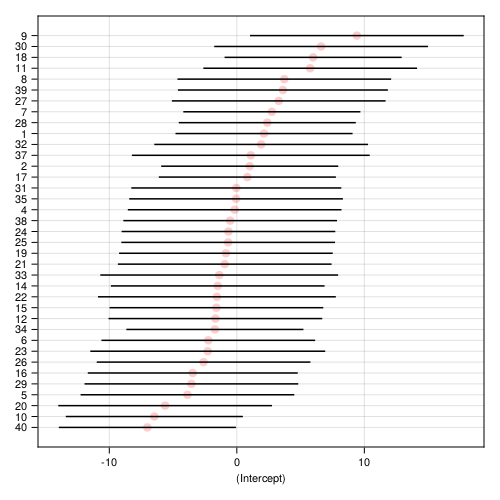

In [134]:
let lmm = bpmerr_sip_lmm03
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

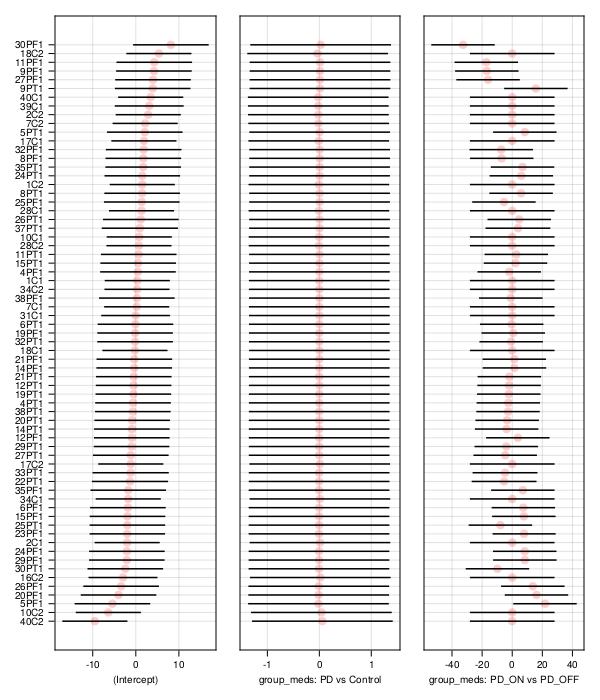

In [135]:
let lmm = bpmerr_sip_lmm03
    figsubject = caterpillar!(Figure(; resolution=(600, 700), fontsize=10),
      ranefinfo(lmm, :sample),
    )
end

##### **Continued...**

In [136]:
bpmerr_sip_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds*cued + zerocorr(1+group_meds|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -495.7645   991.5291  1011.5291  1013.2891  1040.6556

Variance components:
                    Column            Variance Std.Dev.   Corr.
sample   (Intercept)                   50.08285  7.07692
         group_meds: PD vs Control     17.86872  4.22714   .  
         group_meds: PD_ON vs PD_OFF  238.68586 15.44946   .     .  
Residual                               35.43863  5.95304
 Number of obs: 136; levels of grouping factors: 67

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.61994     1.36646   4.11    <1e-04
group_m

In [137]:
likelihoodratiotest(bpmerr_sip_lmm03, bpmerr_sip_lmm04)

|                                                                                                                         | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:----------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| sample))                  |        10 |      992 |     |        |        |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        11 |      988 |   3 |      1 | 0.0776 |


In [408]:
bpmerr_sip_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds*cued + (1|subject) + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -495.4542   990.9085  1008.9085  1010.3371  1035.1224

Variance components:
            Column   Variance Std.Dev.
sample   (Intercept)  59.35814 7.70442
subject  (Intercept)  32.13629 5.66889
Residual              35.43633 5.95284
 Number of obs: 136; levels of grouping factors: 67, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.54602     1.51973   3.65    0.0003
group_meds: PD vs Control                 -1.45356     6.53417  -0.22    0.8240
group_meds: PD_ON vs PD_OFF                5.28938     2.89623   1.83    0.0678
cued: true      

In [141]:
likelihoodratiotest(bpmerr_sip_lmm03, bpmerr_sip_lmm05)

|                                                                                                                         | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:----------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample)                                    |         9 |      991 |     |        |        |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        11 |      988 |   2 |      2 | 0.2875 |


##### **Random effects caterpillar chart**

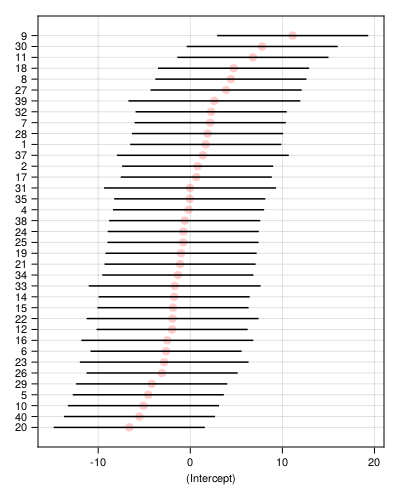

In [142]:
let lmm = bpmerr_sip_lmm05
    figsubject = caterpillar!(Figure(; resolution=(400, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

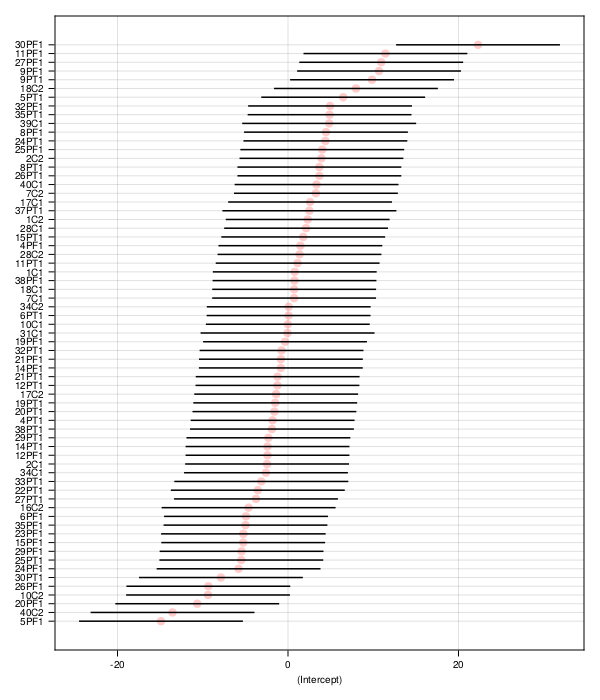

In [143]:
let lmm = bpmerr_sip_lmm05
    figsubject = caterpillar!(Figure(; resolution=(600, 700), fontsize=10),
      ranefinfo(lmm, :sample),
    )
end

##### **Bootstrap**

In [409]:
bpmerr_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, bpmerr_sip_lmm05);

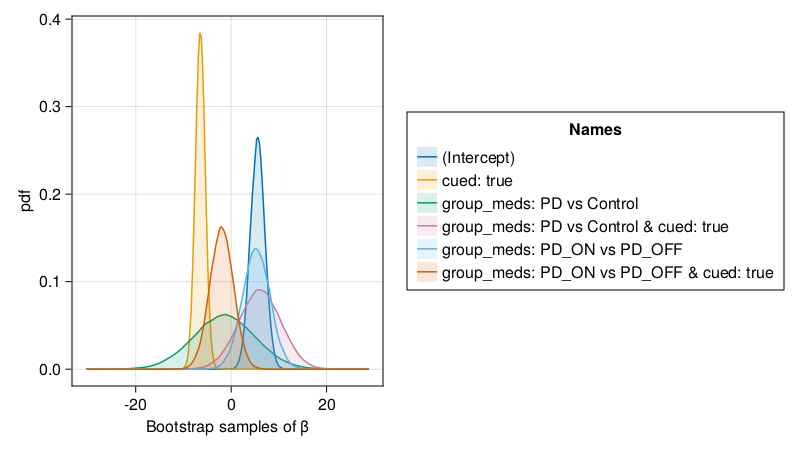

In [410]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(bpmerr_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

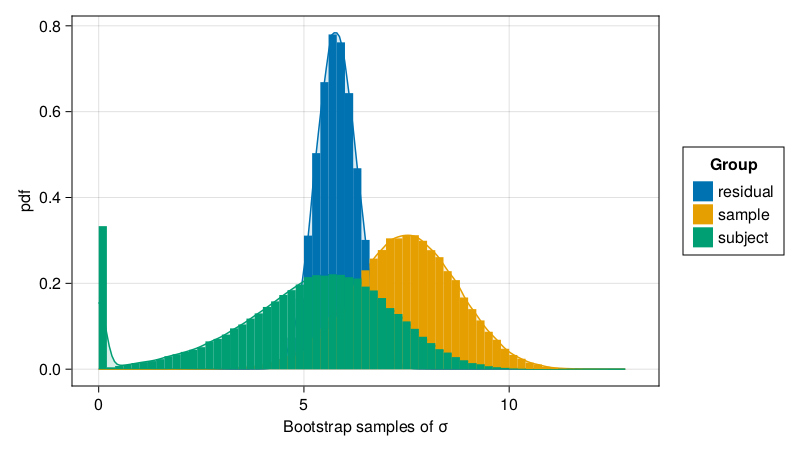

In [411]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(bpmerr_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

Large proportion of subject random effects have singular variance.

##### **Continued...**

In [147]:
bpmerr_sip_lmm06 = let
    lmtmp = fit(MixedModel,
        @formula(bpm_err ~ 1 + group_meds*cued + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -496.9814   993.9628  1009.9628  1011.0966  1033.2640

Variance components:
            Column   Variance Std.Dev.
sample   (Intercept)  92.04730 9.59413
Residual              35.43569 5.95279
 Number of obs: 136; levels of grouping factors: 67

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.61812     1.3793    4.07    <1e-04
group_meds: PD vs Control                 -1.22507     5.94425  -0.21    0.8367
group_meds: PD_ON vs PD_OFF                5.30522     3.3244    1.60    0.1105
cued: true                                -6.45997     1.02248  -6.32    <1

In [148]:
likelihoodratiotest(bpmerr_sip_lmm05, bpmerr_sip_lmm06)

|                                                                                      | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------ | ---------:| --------:| ---:| ------:|:------ |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 \| sample)                  |         8 |      994 |     |        |        |
| bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample) |         9 |      991 |   3 |      1 | 0.0805 |


#### Final model and results

In [412]:
print(bpmerr_sip_lmm05)

Linear mixed model fit by maximum likelihood
 bpm_err ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -495.4542   990.9085  1008.9085  1010.3371  1035.1224

Variance components:
            Column   Variance Std.Dev.
sample   (Intercept)  59.35814 7.70442
subject  (Intercept)  32.13629 5.66889
Residual              35.43633 5.95284
 Number of obs: 136; levels of grouping factors: 67, 37

  Fixed-effects parameters:
───────────────────────────────────────────────────────────────────────────────
                                             Coef.  Std. Error      z  Pr(>|z|)
───────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.54602     1.51973   3.65    0.0003
group_meds: PD vs Control                 -1.45356     6.53417  -0.22    0.8240
group_meds: PD_ON vs PD_OFF                5.28938     2.89623   1.83    0.0678
cued: true      

In [413]:
stats_summary(bpmerr_sip_lmm05, bpmerr_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),5.54602,"[3.0,9.0]",1.51973,3.64935,0.000262902
2,group_meds: PD vs Control,-1.45356,"[-10.0,10.0]",6.53417,-0.222455,0.82396
3,group_meds: PD_ON vs PD_OFF,5.28938,"[-0.4,10.0]",2.89623,1.8263,0.0678057
4,cued: true,-6.45997,"[-8.0,-4.0]",1.02249,-6.3179,2.65146e-10
5,group_meds: PD vs Control & cued: true,6.03957,"[-3.0,10.0]",4.41973,1.3665,0.171781
6,group_meds: PD_ON vs PD_OFF & cued: true,-1.98193,"[-7.0,3.0]",2.45651,-0.806807,0.419778


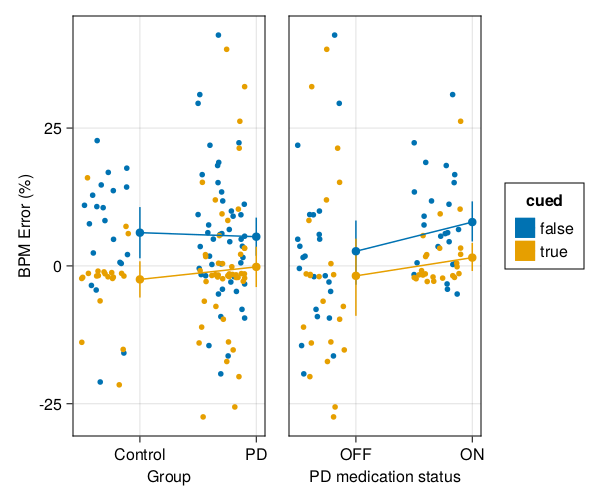

In [418]:
let variable = :bpm_err, _data = sipdata, lmm = bpmerr_sip_lmm05, ylabel="BPM Error (%)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
        
    legend!(fg[1,3], grid)
    save("$(variable)_sip.png", fg)
    fg
end

### Step time asymmetry (% Cue BPM)

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [47]:
steptimeasym_sip_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds*cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 1343 	 Time: 0:00:01 ( 0.77 ms/it)


Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -353.5497   707.0994   805.0994   863.4327   947.0935

Variance components:
                          Column                   Variance Std.Dev.   Corr.
sample   (Intercept)                                0.000000 0.000000
         group_meds: PD vs Control                  0.066855 0.258563  +NaN
         group_meds: PD_ON vs PD_OFF                0.588496 0.767135  +NaN +0.99
         cued: true                                 0.375021 0.612390  +NaN -0.97 -0.96
         group_meds: PD vs Control & cued: true    13.796622 3.714380  +NaN +0.96 +0.96 -1.00
         group_meds: PD_ON vs PD_OFF & cued: true   0.212260 0.460717  +NaN -0.99 -1.00 +0.96 -0.96
subject  (Intercept)                               26.997541 5.

In [48]:
steptimeasym_sip_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds*cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -363.3289   726.6578   764.6578   771.3245   819.7168

Variance components:
                          Column                  Variance Std.Dev.  Corr.
sample   (Intercept)                                0.00000 0.00000
         group_meds: PD vs Control                  0.00000 0.00000   .  
         group_meds: PD_ON vs PD_OFF               17.83175 4.22277   .     .  
         cued: true                                 0.00000 0.00000   .     .     .  
         group_meds: PD vs Control & cued: true     7.84348 2.80062   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true   0.00000 0.00000   .     .     .     .     .  
subject  (Intercept)             

In [49]:
steptimeasym_sip_lmm02.rePCA

(sample = [0.5, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0])

In [421]:
steptimeasym_sip_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds*cued + (1|subject) + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -364.9260   729.8521   747.8521   749.3037   773.9327

Variance components:
            Column   Variance Std.Dev.
sample   (Intercept)   2.65689 1.63000
subject  (Intercept)  23.37658 4.83493
Residual               5.29422 2.30092
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.562002     0.87042   -0.65    0.5185
group_meds: PD vs Control                 -4.45545      3.72263   -1.20    0.2314
group_meds: PD_ON vs PD_OFF               -0.0703449    0.865839  -0.08    0.93

In [51]:
steptimeasym_sip_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(step_time_asym ~ 1 + group_meds*cued + (1|subject)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -367.5381   735.0761   751.0761   752.2281   774.2589

Variance components:
            Column   Variance Std.Dev.
subject  (Intercept)  24.68967 4.96887
Residual               6.86032 2.61922
 Number of obs: 134; levels of grouping factors: 37

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.569611     0.879851  -0.65    0.5174
group_meds: PD vs Control                 -4.49629      3.76306   -1.19    0.2321
group_meds: PD_ON vs PD_OFF               -0.0341422    0.798104  -0.04    0.9659
cued: true                                 0.276446    

In [52]:
likelihoodratiotest(steptimeasym_sip_lmm03, steptimeasym_sip_lmm04)

|                                                                                             | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                 |         8 |      735 |     |        |        |
| step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample) |         9 |      730 |   5 |      1 | 0.0223 |


In [422]:
steptimeasym_sip_lmm = steptimeasym_sip_lmm03;

##### **Random effects caterpillar chart**

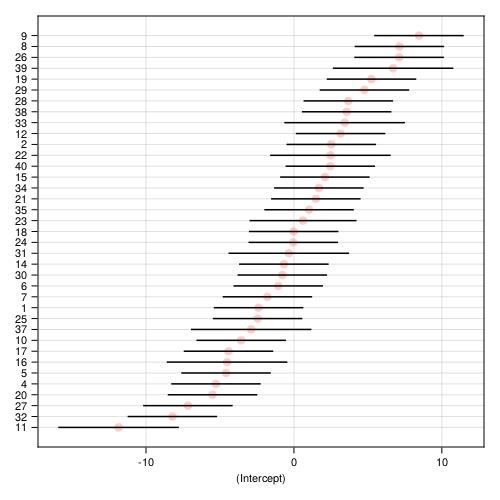

In [53]:
let lmm = steptimeasym_sip_lmm03
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

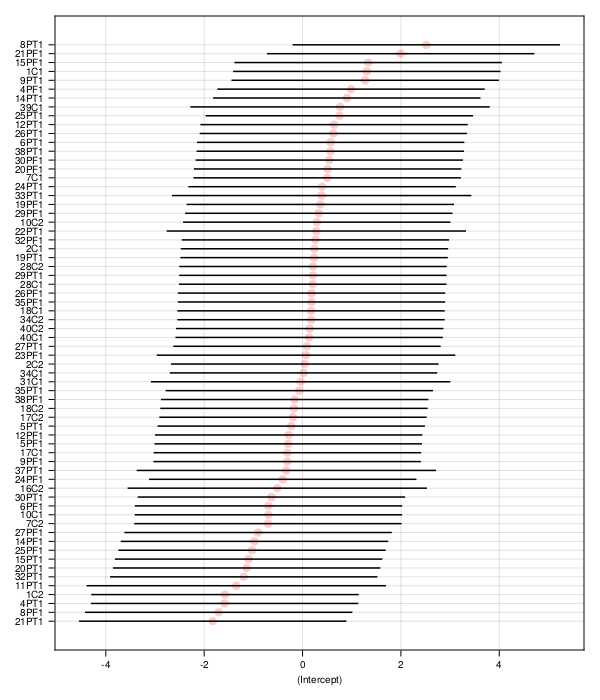

In [54]:
let lmm = steptimeasym_sip_lmm03
    figsubject = caterpillar!(Figure(; resolution=(600, 700), fontsize=10),
      ranefinfo(lmm, :sample),
    )
end

In [55]:
extrema(leverage(steptimeasym_sip_lmm03))

(0.26117076868561045, 0.4812340354702064)

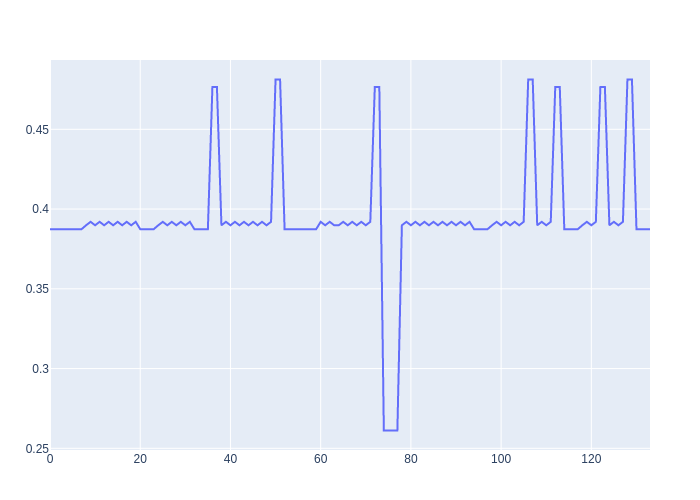

In [56]:
plot(scatter(;y=leverage(steptimeasym_sip_lmm03)))

##### **Bootstrap**

In [423]:
steptimeasym_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, steptimeasym_sip_lmm);

┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180


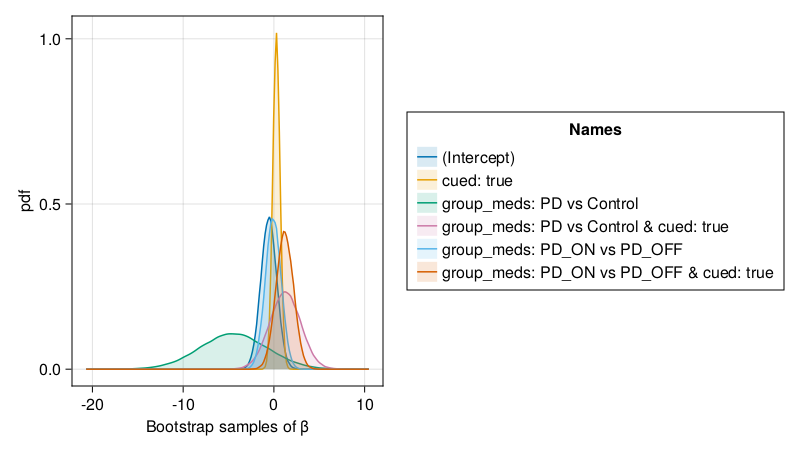

In [424]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(steptimeasym_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

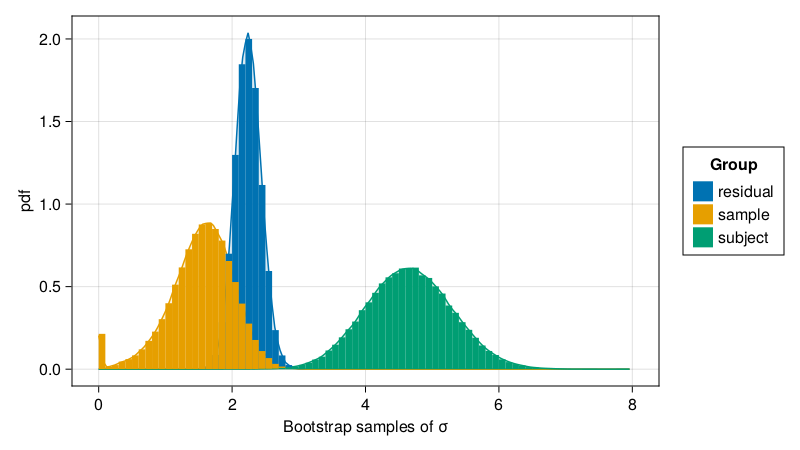

In [425]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(steptimeasym_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [426]:
print(steptimeasym_sip_lmm)

Linear mixed model fit by maximum likelihood
 step_time_asym ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -364.9260   729.8521   747.8521   749.3037   773.9327

Variance components:
            Column   Variance Std.Dev.
sample   (Intercept)   2.65689 1.63000
subject  (Intercept)  23.37658 4.83493
Residual               5.29422 2.30092
 Number of obs: 134; levels of grouping factors: 66, 37

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.562002     0.87042   -0.65    0.5185
group_meds: PD vs Control                 -4.45545      3.72263   -1.20    0.2314
group_meds: PD_ON vs PD_OFF               -0.0703449    0.865839  -0.08    0.93

In [427]:
stats_summary(steptimeasym_sip_lmm03, steptimeasym_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),-0.562002,"[-2.0,1.0]",0.87042,-0.645668,0.518495
2,group_meds: PD vs Control,-4.45545,"[-10.0,3.0]",3.72263,-1.19686,0.231362
3,group_meds: PD_ON vs PD_OFF,-0.0703449,"[-2.0,2.0]",0.865839,-0.0812448,0.935247
4,cued: true,0.276446,"[-0.5,1.0]",0.398147,0.694331,0.487475
5,group_meds: PD vs Control & cued: true,1.23873,"[-2.0,5.0]",1.71445,0.722524,0.469972
6,group_meds: PD_ON vs PD_OFF & cued: true,1.19505,"[-0.6,3.0]",0.960457,1.24425,0.213408


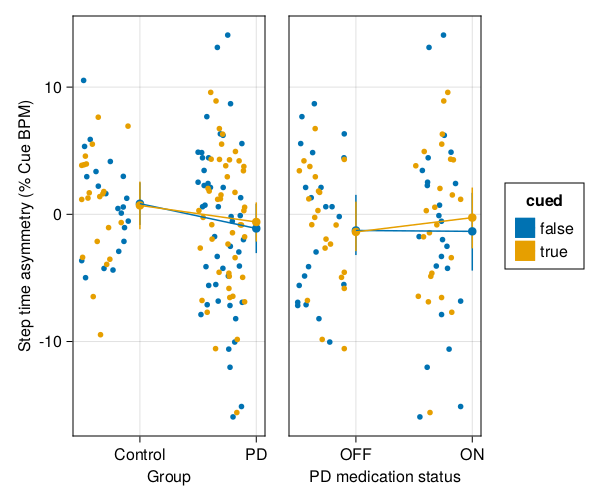

In [428]:
let variable = :step_time_asym, _data = @subset(sipdata, .!ismissing.($variable)), lmm = steptimeasym_sip_lmm, ylabel="Step time asymmetry (% Cue BPM)"
    
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
        
    legend!(fg[1,3], grid)
    save("$(variable)_sip.png", fg)
    fg
end

### PCI

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [82]:
pci_sip_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds*cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 1066 	 Time: 0:00:00 ( 0.26 ms/it)
  objective:  515.9333931735777


Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -257.9667   515.9334   613.9334   676.7539   753.6829

Variance components:
                          Column                  Variance Std.Dev.   Corr.
sample   (Intercept)                               0.667081 0.816750
         group_meds: PD vs Control                 0.094300 0.307083 -0.23
         group_meds: PD_ON vs PD_OFF               1.845323 1.358427 +0.43 -0.04
         cued: true                                0.066195 0.257283 -0.03 +0.08 -0.85
         group_meds: PD vs Control & cued: true    2.402712 1.550068 -0.86 +0.33 -0.79 +0.53
         group_meds: PD_ON vs PD_OFF & cued: true  0.204708 0.452446 -0.75 +0.14 -0.71 +0.59 +0.92
subject  (Intercept)                               2.753875 1.659480
         gro

In [83]:
pci_sip_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds*cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -267.7318   535.4636   573.4636   580.5006   627.6522

Variance components:
                          Column                  Variance Std.Dev.  Corr.
sample   (Intercept)                                0.00000 0.00000
         group_meds: PD vs Control                  6.09176 2.46815   .  
         group_meds: PD_ON vs PD_OFF                0.00000 0.00000   .     .  
         cued: true                                 0.00000 0.00000   .     .     .  
         group_meds: PD vs Control & cued: true     5.07479 2.25273   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true   0.00000 0.00000   .     .     .     .     .  
subject  (Intercept)                        

In [84]:
pci_sip_lmm02.rePCA

(sample = [0.5, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [0.25, 0.5, 0.75, 1.0, 1.0, 1.0])

In [85]:
pci_sip_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds*cued + zerocorr(1+group_meds|subject) + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 76 	 Time: 0:00:00 ( 5.33 ms/it)


Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject)) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -267.9516   535.9032   557.9032   560.1790   589.2755

Variance components:
                    Column            Variance Std.Dev.   Corr.
subject  (Intercept)                   1.975866 1.405655
         group_meds: PD vs Control    33.056927 5.749515   .  
         group_meds: PD_ON vs PD_OFF   0.760715 0.872190   .     .  
sample   (Intercept)                   0.708524 0.841739
Residual                               1.784200 1.335740
 Number of obs: 128; levels of grouping factors: 36, 63

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Interce

In [86]:
pci_sip_lmm03.rePCA

(subject = [0.3333333333333333, 0.6666666666666666, 1.0], sample = [1.0])

In [18]:
pci_sip_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds*cued + zerocorr(1+group_meds|subject)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 37 	 Time: 0:00:00 ( 5.85 ms/it)


Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + zerocorr(1 + group_meds | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -255.4745   510.9489   530.9489   532.8620   559.3117

Variance components:
                    Column           VarianceStd.Dev.  Corr.
subject  (Intercept)                  2.34782 1.53226
         group_meds: PD vs Control    0.00000 0.00000   .  
         group_meds: PD_ON vs PD_OFF  2.33164 1.52697   .     .  
Residual                              1.86717 1.36644
 Number of obs: 126; levels of grouping factors: 35

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                                8.10768      0.316408  25.62    <1e-99
group_meds: PD vs Control      

In [88]:
likelihoodratiotest(pci_sip_lmm03, pci_sip_lmm04)

|                                                                                                                     | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| pci ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject))                 |        10 |      537 |     |        |        |
| pci ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) + (1 \| sample) |        11 |      536 |   1 |      1 | 0.2424 |


In [89]:
pci_sip_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(pci ~ 1 + group_meds*cued + (1|subject)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -271.1419   542.2838   558.2838   559.4939   581.1001

Variance components:
            Column   VarianceStd.Dev.
subject  (Intercept)  4.23657 2.05829
Residual              2.31394 1.52116
 Number of obs: 128; levels of grouping factors: 36

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                                8.32239      0.394281  21.11    <1e-98
group_meds: PD vs Control                  2.49939      1.67372    1.49    0.1354
group_meds: PD_ON vs PD_OFF               -0.0499038    0.482276  -0.10    0.9176
cued: true                                 0.112167     0.269358   0.

In [90]:
likelihoodratiotest(pci_sip_lmm04, pci_sip_lmm05)

|                                                                                                     | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:--------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| pci ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                                    |         8 |      542 |     |        |        |
| pci ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) |        10 |      537 |   5 |      2 | 0.0815 |


In [19]:
pci_sip_lmm = pci_sip_lmm04;

##### **Random effects caterpillar chart**

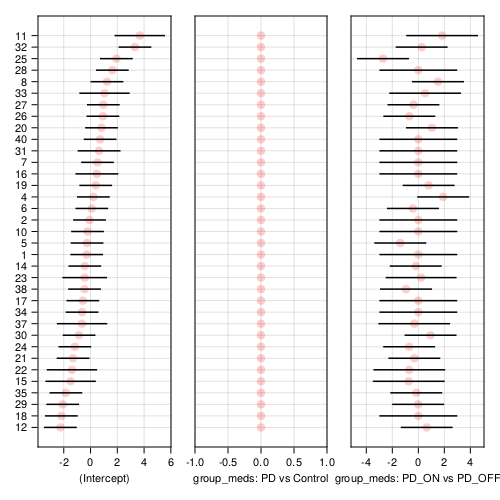

In [19]:
let lmm = pci_sip_lmm04
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

##### **Bootstrap**

In [433]:
pci_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, pci_sip_lmm);

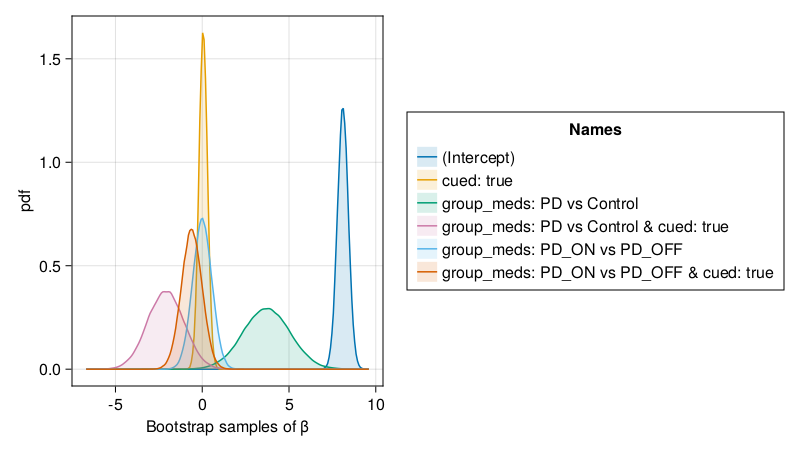

In [434]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(pci_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

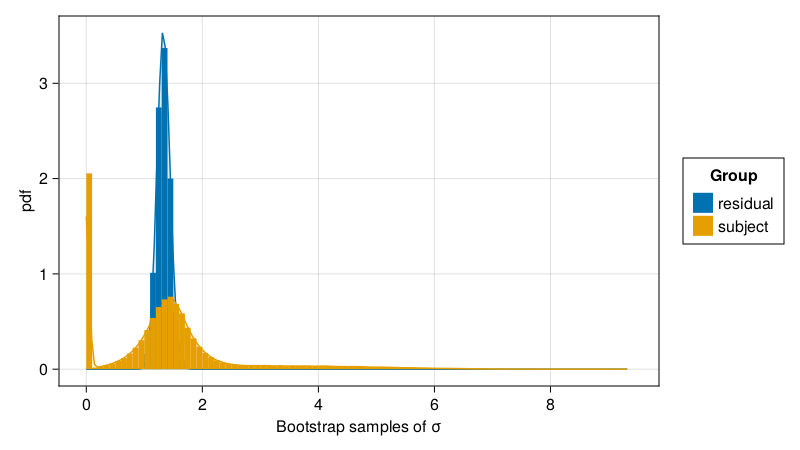

In [435]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(pci_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [436]:
print(pci_sip_lmm)

Linear mixed model fit by maximum likelihood
 pci ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
  -255.4745   510.9489   530.9489   532.8620   559.3117

Variance components:
                    Column           VarianceStd.Dev.  Corr.
subject  (Intercept)                  2.34782 1.53226
         group_meds: PD vs Control    0.00000 0.00000   .  
         group_meds: PD_ON vs PD_OFF  2.33164 1.52697   .     .  
Residual                              1.86717 1.36644
 Number of obs: 126; levels of grouping factors: 35

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                                8.10768      0.316408  25.62    <1e-99
group_meds: PD vs

In [437]:
stats_summary(pci_sip_lmm, pci_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),8.10768,"[7.0,9.0]",0.316408,25.6242,8.21082e-145
2,group_meds: PD vs Control,3.71023,"[1.0,6.0]",1.35243,2.74338,0.00608101
3,group_meds: PD_ON vs PD_OFF,-0.0015811,"[-1.0,1.0]",0.549726,-0.00287615,0.997705
4,cued: true,0.0571598,"[-0.4,0.5]",0.243994,0.234267,0.814777
5,group_meds: PD vs Control & cued: true,-2.09613,"[-4.0,-0.05]",1.04687,-2.00227,0.0452557
6,group_meds: PD_ON vs PD_OFF & cued: true,-0.602997,"[-2.0,0.5]",0.590829,-1.02059,0.307447


In [23]:
mods = (pci_sip_lmm, sipdata);
@rput mods;
R"""
mod_emm = emmeans(mods, list(pairwise ~ group_meds*cued))
summary(contrast(mod_emm, "pairwise")[c(1,2,3,4,5,7,10,13,14)], adjust = "holm")
"""

┌ Warning: RCall.jl: Warning: Due to missing values, reduced number of observations to 126
│ Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
│ boundary (singular) fit: see help('isSingular')
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172
┌ Warning: RCall.jl: Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
│ boundary (singular) fit: see help('isSingular')
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172


RObject{VecSxp}
 contrast                     estimate    SE   df t.ratio p.value
 Control false - PD_OFF false   -1.856 0.762 41.3  -2.436  0.1494
 Control false - PD_ON false    -1.854 0.737 37.6  -2.516  0.1463
 Control false - Control true   -0.756 0.443 77.2  -1.707  0.5509
 Control false - PD_OFF true    -1.865 0.762 41.3  -2.448  0.1494
 Control false - PD_ON true     -1.261 0.737 37.6  -1.711  0.5509
 PD_OFF false - Control true     1.100 0.762 41.3   1.444  0.5777
 PD_ON false - Control true      1.098 0.737 37.6   1.491  0.5777
 Control true - PD_OFF true     -1.109 0.762 41.3  -1.456  0.5777
 Control true - PD_ON true      -0.505 0.737 37.6  -0.685  0.5777

Degrees-of-freedom method: kenward-roger 
P value adjustment: holm method for 9 tests 


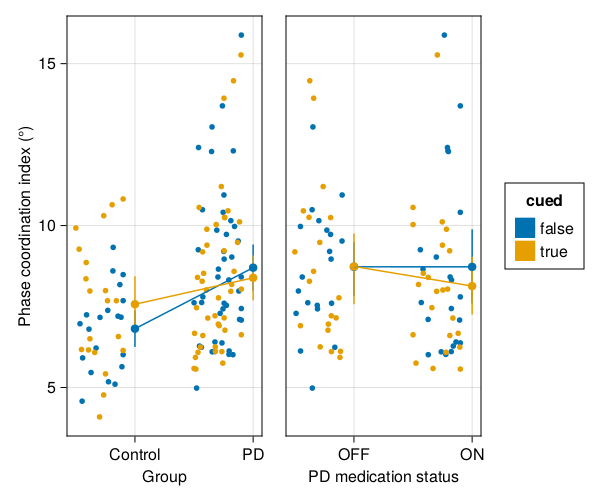

In [438]:
let variable = :pci, _data = @subset(sipdata, .!ismissing.($variable)), lmm = pci_sip_lmm, ylabel="Phase coordination index (°)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
        
    legend!(fg[1,3], grid)
    save("$(variable)_sip.png", fg)
    fg
end

### Clock var

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [26]:
clockvar_sip_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(clock_var ~ 1 + group_meds*cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 2533 	 Time: 0:00:01 ( 0.53 ms/it)


Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
   781.1603 -1562.3207 -1464.3207 -1397.1974 -1326.5237

Variance components:
                          Column                    Variance    Std.Dev.    Corr.
sample   (Intercept)                               0.000000095 0.000308784
         group_meds: PD vs Control                 0.000000102 0.000318741 -1.00
         group_meds: PD_ON vs PD_OFF               0.000000050 0.000224026 -0.98 +0.97
         cued: true                                0.000000052 0.000228925 -0.89 +0.89 +0.93
         group_meds: PD vs Control & cued: true    0.000001354 0.001163762 +0.79 -0.80 -0.77 -0.90
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000020 0.000142276 -0.46 +0.45 +0.50 +0.31 -0.32
subject  (Intercept)             

In [27]:
clockvar_sip_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(clock_var ~ 1 + group_meds*cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
   768.9579 -1537.9158 -1499.9158 -1492.5371 -1446.4843

Variance components:
                          Column                    Variance    Std.Dev.    Corr.
sample   (Intercept)                               0.000000000 0.000000000
         group_meds: PD vs Control                 0.000000000 0.000000000   .  
         group_meds: PD_ON vs PD_OFF               0.000000282 0.000531134   .     .  
         cued: true                                0.000000000 0.000000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.000000000 0.000000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000000 0.000000000   .     .     .    

In [28]:
clockvar_sip_lmm02.rePCA

(sample = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [0.5000000000000001, 1.0, 1.0, 1.0, 1.0, 1.0])

In [29]:
clockvar_sip_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(clock_var ~ 1 + group_meds*cued + (1|subject) + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 24 	 Time: 0:00:00 (11.05 ms/it)


Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
   767.9176 -1535.8351 -1517.8351 -1516.2422 -1492.5254

Variance components:
            Column     Variance    Std.Dev.  
sample   (Intercept)  0.000000027 0.000163659
subject  (Intercept)  0.000000077 0.000277912
Residual              0.000000150 0.000387151
 Number of obs: 123; levels of grouping factors: 61, 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.000474083  7.23878e-5    6.55    <1e-10
group_meds: PD vs Control                 -0.000448431  0.000308612  -1.45    0.1462
group_meds: PD_ON vs PD_OFF              

In [24]:
clockvar_sip_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(clock_var ~ 1 + group_meds*cued + (1|subject)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
   767.4517 -1534.9033 -1518.9033 -1517.6402 -1496.4059

Variance components:
            Column     Variance    Std.Dev.  
subject  (Intercept)  0.000000087 0.000294349
Residual              0.000000167 0.000408159
 Number of obs: 123; levels of grouping factors: 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.000473392  7.30625e-5    6.48    <1e-10
group_meds: PD vs Control                 -0.000450841  0.000311701  -1.45    0.1481
group_meds: PD_ON vs PD_OFF               -0.000206223  0.000131175  -1.57    0.1159
cued: true           

In [31]:
likelihoodratiotest(clockvar_sip_lmm03, clockvar_sip_lmm04)

|                                                                                        | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                 |         8 |    -1535 |     |        |        |
| clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample) |         9 |    -1536 |   1 |      1 | 0.3344 |


In [25]:
clockvar_sip_lmm = clockvar_sip_lmm04;

##### **Random effects caterpillar chart**

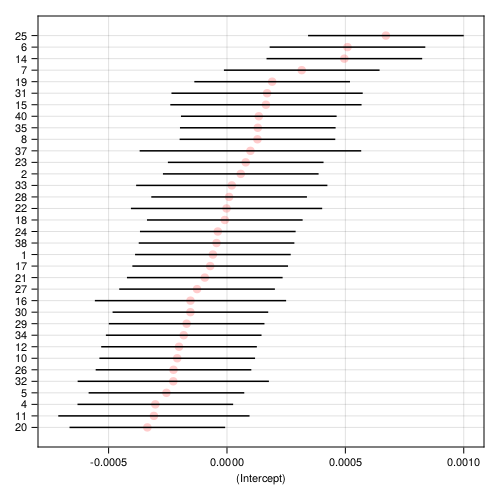

In [32]:
let lmm = clockvar_sip_lmm04
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

##### **Bootstrap**

In [34]:
clockvar_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, clockvar_sip_lmm);

┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary

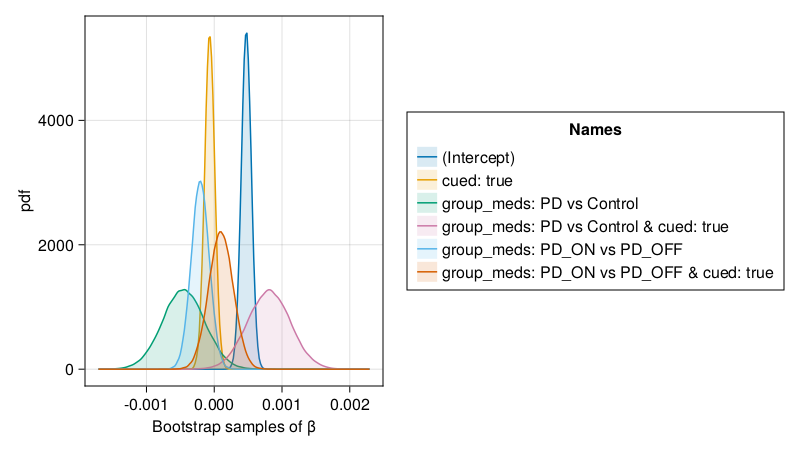

In [35]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(clockvar_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

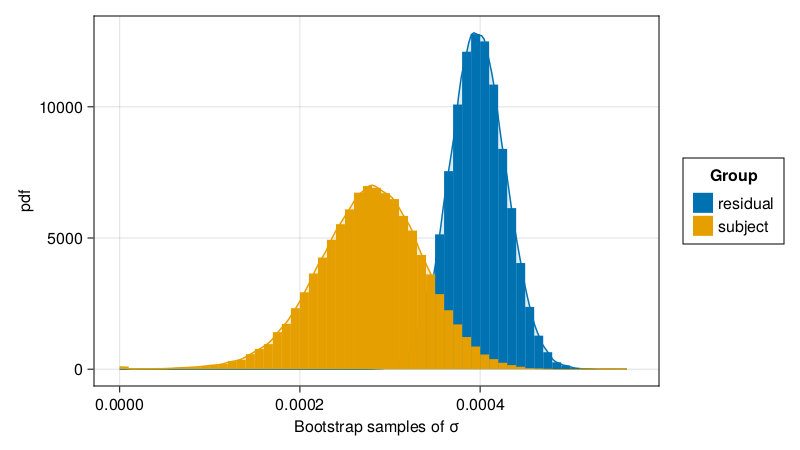

In [36]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(clockvar_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [37]:
print(clockvar_sip_lmm)

Linear mixed model fit by maximum likelihood
 clock_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
   767.4517 -1534.9033 -1518.9033 -1517.6402 -1496.4059

Variance components:
            Column     Variance    Std.Dev.  
subject  (Intercept)  0.000000087 0.000294349
Residual              0.000000167 0.000408159
 Number of obs: 123; levels of grouping factors: 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.000473392  7.30625e-5    6.48    <1e-10
group_meds: PD vs Control                 -0.000450841  0.000311701  -1.45    0.1481
group_meds: PD_ON vs PD_OFF               -0.000206223  0.000131175  -1.57    0.1159
cued: true           

In [38]:
stats_summary(clockvar_sip_lmm, clockvar_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),0.000473392,"[0.0003,0.0006]",7.30625e-5,6.47927,9.21651e-11
2,group_meds: PD vs Control,-0.000450841,"[-0.001,0.0002]",0.000311701,-1.44639,0.148068
3,group_meds: PD_ON vs PD_OFF,-0.000206223,"[-0.0005,5.0e-5]",0.000131175,-1.57212,0.115923
4,cued: true,-6.71071e-5,"[-0.0002,8.0e-5]",7.38796e-5,-0.908331,0.363704
5,group_meds: PD vs Control & cued: true,0.000807262,"[0.0002,0.001]",0.000314805,2.56433,0.0103377
6,group_meds: PD_ON vs PD_OFF & cued: true,9.9106e-5,"[-0.0003,0.0005]",0.000180179,0.550043,0.58229


In [27]:
mods = (clockvar_sip_lmm, sipdata);
@rput mods;
R"""
mod_emm = emmeans(mods, list(pairwise ~ group_meds*cued))
summary(contrast(mod_emm, "pairwise")[c(1,2,3,4,5,7,10,13,14)], adjust = "holm")
"""

┌ Warning: RCall.jl: Warning: Due to missing values, reduced number of observations to 123
│ Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172
┌ Warning: RCall.jl: Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172


RObject{VecSxp}
 contrast                      estimate       SE   df t.ratio p.value
 Control false - PD_OFF false  1.22e-04 0.000176 79.5   0.694  1.0000
 Control false - PD_ON false   3.29e-04 0.000171 75.5   1.924  0.4654
 Control false - Control true  3.36e-04 0.000132 93.5   2.540  0.1145
 Control false - PD_OFF true   1.04e-04 0.000176 79.5   0.592  1.0000
 Control false - PD_ON true    2.12e-04 0.000169 74.4   1.249  1.0000
 PD_OFF false - Control true   2.14e-04 0.000176 79.5   1.213  1.0000
 PD_ON false - Control true    7.66e-06 0.000171 75.5   0.045  1.0000
 Control true - PD_OFF true   -2.32e-04 0.000176 79.5  -1.315  1.0000
 Control true - PD_ON true    -1.25e-04 0.000169 74.4  -0.736  1.0000

Degrees-of-freedom method: kenward-roger 
P value adjustment: holm method for 9 tests 


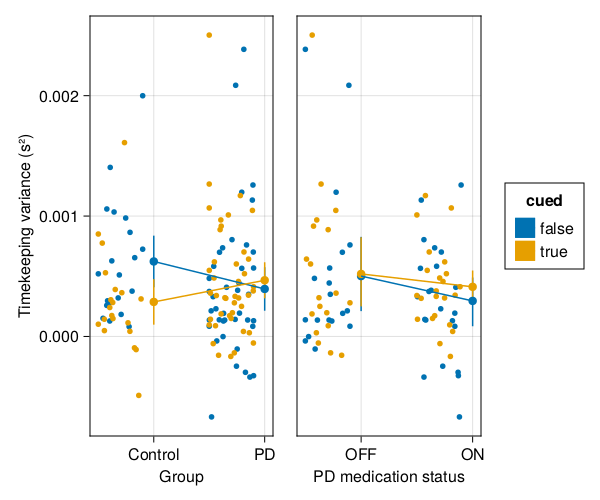

In [39]:
let variable = :clock_var, _data = @subset(sipdata, .!ismissing.($variable)), lmm = clockvar_sip_lmm, ylabel="Timekeeping variance (s²)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
        
    legend!(fg[1,3], grid)
    save("$(variable)_sip.png", fg)
    fg
end

### Motor var

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [40]:
motorvar_sip_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds*cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 2280 	 Time: 0:00:00 ( 0.27 ms/it)
  objective:  -1739.5313159579782


Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
   869.7657 -1739.5313 -1641.5313 -1574.4080 -1503.7343

Variance components:
                          Column                    Variance    Std.Dev.    Corr.
sample   (Intercept)                               0.000000018 0.000132481
         group_meds: PD vs Control                 0.000000009 0.000092807 +1.00
         group_meds: PD_ON vs PD_OFF               0.000000090 0.000299770 +0.57 +0.57
         cued: true                                0.000000031 0.000176541 -0.93 -0.93 -0.35
         group_meds: PD vs Control & cued: true    0.000000166 0.000407627 +0.56 +0.56 +0.14 -0.81
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000067 0.000259638 -0.42 -0.41 -0.99 +0.19 -0.04
subject  (Intercept)             

In [41]:
motorvar_sip_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds*cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
   854.1692 -1708.3383 -1670.3383 -1662.9597 -1616.9068

Variance components:
                          Column                    Variance    Std.Dev.    Corr.
sample   (Intercept)                               0.000000000 0.000000000
         group_meds: PD vs Control                 0.000000000 0.000000000   .  
         group_meds: PD_ON vs PD_OFF               0.000000025 0.000157162   .     .  
         cued: true                                0.000000000 0.000000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.000000138 0.000371775   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000000 0.000000000   .     .     .    

In [42]:
motorvar_sip_lmm02.rePCA

(sample = [0.5, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0])

In [43]:
motorvar_sip_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds*cued + (1|subject) + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
   853.6448 -1707.2895 -1689.2895 -1687.6966 -1663.9799

Variance components:
            Column     Variance    Std.Dev.  
sample   (Intercept)  0.000000000 0.000000000
subject  (Intercept)  0.000000028 0.000167967
Residual              0.000000038 0.000195969
 Number of obs: 123; levels of grouping factors: 61, 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.000168905  3.83623e-5    4.40    <1e-04
group_meds: PD vs Control                  0.0003544    0.000163806   2.16    0.0305
group_meds: PD_ON vs PD_OFF              

In [28]:
motorvar_sip_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(motor_var ~ 1 + group_meds*cued + (1|subject)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
   853.6448 -1707.2895 -1691.2895 -1690.0264 -1668.7921

Variance components:
            Column     Variance    Std.Dev.  
subject  (Intercept)  0.000000028 0.000167967
Residual              0.000000038 0.000195969
 Number of obs: 123; levels of grouping factors: 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.000168905  3.83623e-5    4.40    <1e-04
group_meds: PD vs Control                  0.0003544    0.000163806   2.16    0.0305
group_meds: PD_ON vs PD_OFF                7.56159e-5   6.3228e-5     1.20    0.2317
cued: true           

In [45]:
likelihoodratiotest(motorvar_sip_lmm04, motorvar_sip_lmm04)

|                                                                        | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:---------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) |         8 |    -1707 |     |        |        |
| motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) |         8 |    -1707 |   0 |      0 | NaN    |


In [29]:
motorvar_sip_lmm = motorvar_sip_lmm04;

##### **Random effects caterpillar chart**

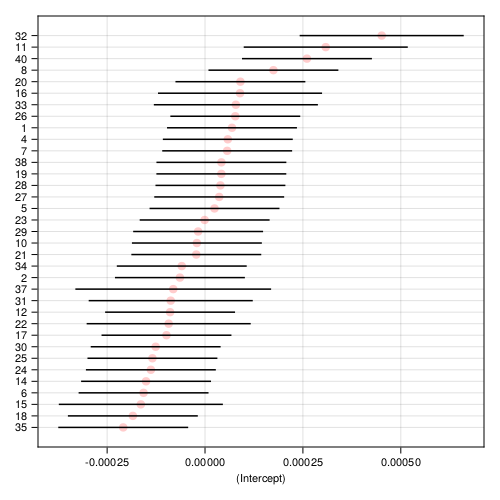

In [55]:
let lmm = motorvar_sip_lmm04
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

##### **Bootstrap**

In [56]:
motorvar_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, motorvar_sip_lmm);

┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary.jl:180
┌ Warning: NLopt was roundoff limited
└ @ MixedModels ~/.julia/packages/MixedModels/ezbpk/src/optsummary

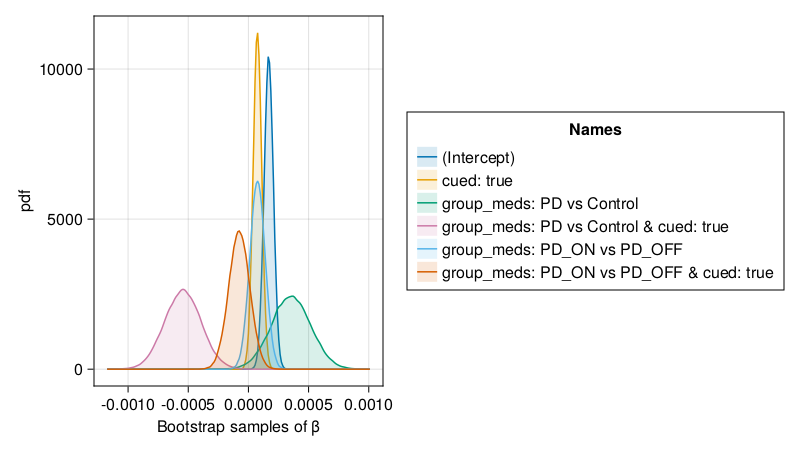

In [57]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(motorvar_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

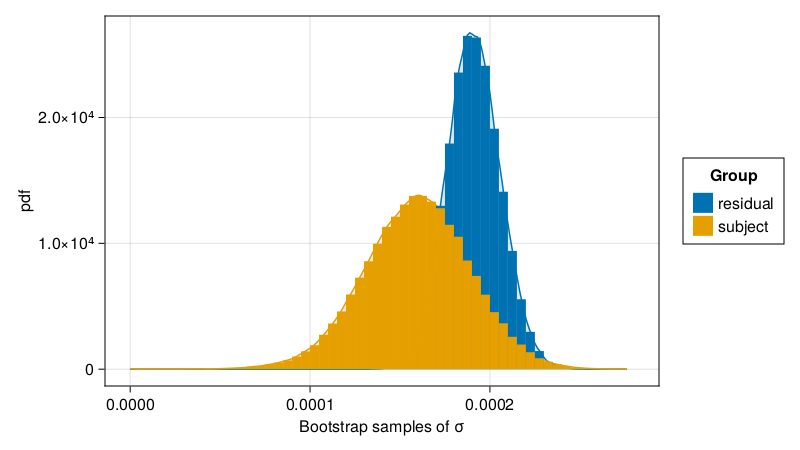

In [58]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(motorvar_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [59]:
print(motorvar_sip_lmm)

Linear mixed model fit by maximum likelihood
 motor_var ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
   853.6448 -1707.2895 -1691.2895 -1690.0264 -1668.7921

Variance components:
            Column     Variance    Std.Dev.  
subject  (Intercept)  0.000000028 0.000167967
Residual              0.000000038 0.000195969
 Number of obs: 123; levels of grouping factors: 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────────
                                                 Coef.   Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────────
(Intercept)                                0.000168905  3.83623e-5    4.40    <1e-04
group_meds: PD vs Control                  0.0003544    0.000163806   2.16    0.0305
group_meds: PD_ON vs PD_OFF                7.56159e-5   6.3228e-5     1.20    0.2317
cued: true           

In [60]:
stats_summary(motorvar_sip_lmm, motorvar_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),0.000168905,"[9.0e-5,0.0002]",3.83623e-5,4.40289,1.06817e-5
2,group_meds: PD vs Control,0.0003544,"[3.0e-5,0.0007]",0.000163806,2.16354,0.0304999
3,group_meds: PD_ON vs PD_OFF,7.56159e-5,"[-5.0e-5,0.0002]",6.3228e-5,1.19592,0.231726
4,cued: true,7.47552e-5,"[5.0e-6,0.0001]",3.54814e-5,2.10689,0.0351275
5,group_meds: PD vs Control & cued: true,-0.000545018,"[-0.0008,-0.0002]",0.000151167,-3.6054,0.000311671
6,group_meds: PD_ON vs PD_OFF & cued: true,-7.61794e-5,"[-0.0002,9.0e-5]",8.65446e-5,-0.880233,0.378733


In [30]:
mods = (motorvar_sip_lmm, sipdata);
@rput mods;
R"""
mod_emm = emmeans(mods, list(pairwise ~ group_meds*cued))
summary(contrast(mod_emm, "pairwise")[c(1,2,3,4,5,7,10,13,14)], adjust = "holm")
"""

┌ Warning: RCall.jl: Warning: Due to missing values, reduced number of observations to 123
│ Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172
┌ Warning: RCall.jl: Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172


RObject{VecSxp}
 contrast                      estimate       SE   df t.ratio p.value
 Control false - PD_OFF false -1.39e-04 9.14e-05 71.8  -1.526  0.6574
 Control false - PD_ON false  -2.15e-04 8.88e-05 67.6  -2.421  0.1453
 Control false - Control true -2.56e-04 6.35e-05 93.3  -4.036  0.0010
 Control false - PD_OFF true  -1.61e-04 9.14e-05 71.8  -1.767  0.5080
 Control false - PD_ON true   -1.61e-04 8.82e-05 66.6  -1.824  0.5080
 PD_OFF false - Control true  -1.17e-04 9.14e-05 71.8  -1.281  0.8173
 PD_ON false - Control true   -4.14e-05 8.88e-05 67.6  -0.466  0.8464
 Control true - PD_OFF true    9.50e-05 9.14e-05 71.8   1.040  0.8464
 Control true - PD_ON true     9.56e-05 8.82e-05 66.6   1.084  0.8464

Degrees-of-freedom method: kenward-roger 
P value adjustment: holm method for 9 tests 


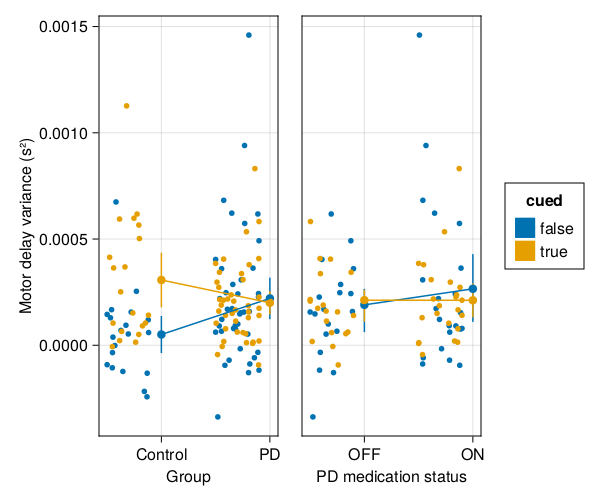

In [63]:
let variable = :motor_var, _data = @subset(sipdata, .!ismissing.($variable)), lmm = motorvar_sip_lmm, ylabel="Motor delay variance (s²)"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
        
    legend!(fg[1,3], grid)
    save("$(variable)_sip.png", fg)
    fg
end

### $P_I(1)$ (Lag one correlation)

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [64]:
lag1corr_sip_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds*cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 1664 	 Time: 0:00:00 ( 0.29 ms/it)
  objective:  -77.6361585382027


Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
    38.8181   -77.6362    20.3638    87.4871   158.1609

Variance components:
                          Column                   Variance  Std.Dev.   Corr.
sample   (Intercept)                               0.0152879 0.1236444
         group_meds: PD vs Control                 0.0045257 0.0672730 +0.38
         group_meds: PD_ON vs PD_OFF               0.0238343 0.1543835 +0.55 -0.21
         cued: true                                0.0207973 0.1442126 -1.00 -0.34 -0.60
         group_meds: PD vs Control & cued: true    0.0980949 0.3132010 +0.62 -0.28 +0.96 -0.68
         group_meds: PD_ON vs PD_OFF & cued: true  0.0181482 0.1347153 +0.05 +0.55 -0.80 +0.01 -0.71
subject  (Intercept)                               0.0241484 

In [65]:
lag1corr_sip_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds*cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
    28.3938   -56.7876   -18.7876   -11.4090    34.6439

Variance components:
                          Column                    Variance    Std.Dev.    Corr.
sample   (Intercept)                               0.000000000 0.000000000
         group_meds: PD vs Control                 0.000000000 0.000000000   .  
         group_meds: PD_ON vs PD_OFF               0.008257224 0.090869271   .     .  
         cued: true                                0.000000000 0.000000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.000000379 0.000615268   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000000 0.000000000   .     .     .    

In [66]:
lag1corr_sip_lmm02.rePCA

(sample = [0.5, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [0.3333333333333333, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0])

In [67]:
lag1corr_sip_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds*cued + zerocorr(1+group_meds|subject) + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 60 	 Time: 0:00:00 ( 5.42 ms/it)
  objective:  -56.69562911739185


Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject)) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
    28.3478   -56.6956   -34.6956   -32.3173    -3.7616

Variance components:
                    Column            Variance  Std.Dev.   Corr.
subject  (Intercept)                  0.0226388 0.1504620
         group_meds: PD vs Control    0.0000000 0.0000000   .  
         group_meds: PD_ON vs PD_OFF  0.0026447 0.0514266   .     .  
sample   (Intercept)                  0.0000000 0.0000000
Residual                              0.0242043 0.1555772
 Number of obs: 123; levels of grouping factors: 35, 61

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────

In [68]:
lag1corr_sip_lmm03p1 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds*cued + zerocorr(1+group_meds|subject)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject))
   logLik   -2 logLik     AIC       AICc        BIC    
    28.3478   -56.6956   -36.6956   -34.7313    -8.5738

Variance components:
                    Column            Variance  Std.Dev.   Corr.
subject  (Intercept)                  0.0226383 0.1504604
         group_meds: PD vs Control    0.0000000 0.0000000   .  
         group_meds: PD_ON vs PD_OFF  0.0026449 0.0514286   .     .  
Residual                              0.0242044 0.1555776
 Number of obs: 123; levels of grouping factors: 35

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.191341     0.032738   -5.

In [31]:
lag1corr_sip_lmm03p2 = let
    lmtmp = fit(MixedModel,
        @formula(lag1_corr ~ 1 + group_meds*cued + (1|subject)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
    28.3113   -56.6226   -40.6226   -39.3595   -18.1252

Variance components:
            Column   Variance Std.Dev. 
subject  (Intercept)  0.022640 0.150465
Residual              0.024701 0.157167
 Number of obs: 123; levels of grouping factors: 35

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.191422     0.0328229  -5.83    <1e-08
group_meds: PD vs Control                 -0.364114     0.140242   -2.60    0.0094
group_meds: PD_ON vs PD_OFF               -0.00230568   0.0508283  -0.05    0.9638
cued: true                                -0.072847

In [70]:
likelihoodratiotest(lag1corr_sip_lmm03, lag1corr_sip_lmm03p1, lag1corr_sip_lmm03p2)

|                                                                                                                           | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                                                    |         8 |      -57 |     |        |        |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject))                 |        10 |      -57 |   0 |      2 | 0.9642 |
| lag1_corr ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| subject)) + (1 \| sample) |        11 |      -57 |   0 |      1 | 1.0000 |


In [32]:
lag1corr_sip_lmm = lag1corr_sip_lmm03p2;

##### **Random effects caterpillar chart**

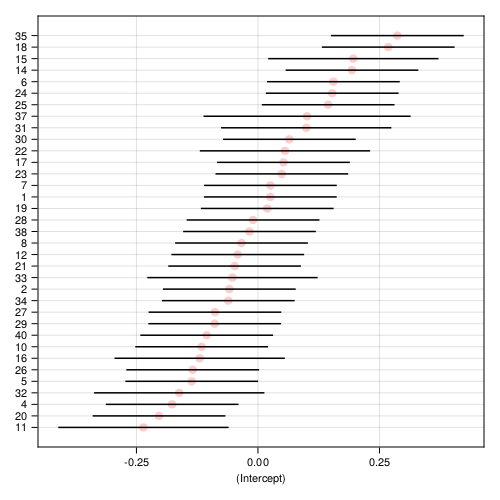

In [72]:
let lmm = lag1corr_sip_lmm
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

##### **Bootstrap**

In [73]:
lag1corr_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, lag1corr_sip_lmm);

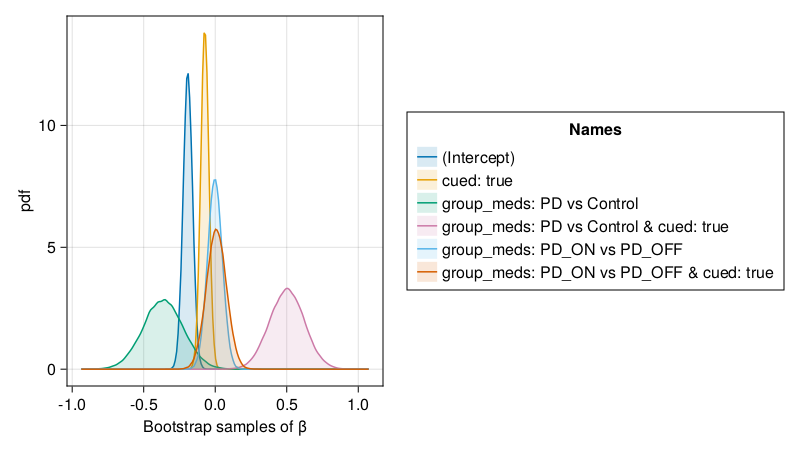

In [74]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(lag1corr_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

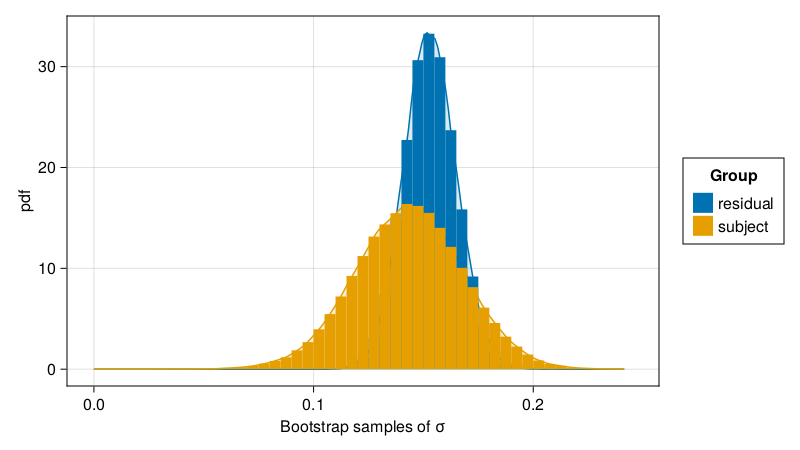

In [75]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(lag1corr_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [76]:
print(lag1corr_sip_lmm)

Linear mixed model fit by maximum likelihood
 lag1_corr ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
    28.3113   -56.6226   -40.6226   -39.3595   -18.1252

Variance components:
            Column   Variance Std.Dev. 
subject  (Intercept)  0.022640 0.150465
Residual              0.024701 0.157167
 Number of obs: 123; levels of grouping factors: 35

  Fixed-effects parameters:
──────────────────────────────────────────────────────────────────────────────────
                                                Coef.  Std. Error      z  Pr(>|z|)
──────────────────────────────────────────────────────────────────────────────────
(Intercept)                               -0.191422     0.0328229  -5.83    <1e-08
group_meds: PD vs Control                 -0.364114     0.140242   -2.60    0.0094
group_meds: PD_ON vs PD_OFF               -0.00230568   0.0508283  -0.05    0.9638
cued: true                                -0.072847

In [77]:
stats_summary(lag1corr_sip_lmm, lag1corr_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),-0.191422,"[-0.3,-0.1]",0.0328229,-5.83198,5.47741e-9
2,group_meds: PD vs Control,-0.364114,"[-0.6,-0.09]",0.140242,-2.59633,0.00942259
3,group_meds: PD_ON vs PD_OFF,-0.00230568,"[-0.1,0.1]",0.0508283,-0.0453622,0.963819
4,cued: true,-0.0728477,"[-0.1,-0.02]",0.0284612,-2.55954,0.0104809
5,group_meds: PD vs Control & cued: true,0.501785,"[0.3,0.7]",0.121247,4.13855,3.4951e-5
6,group_meds: PD_ON vs PD_OFF & cued: true,0.00835665,"[-0.1,0.1]",0.0694278,0.120364,0.904194


In [33]:
mods = (lag1corr_sip_lmm, sipdata);
@rput mods;
R"""
mod_emm = emmeans(mods, list(pairwise ~ group_meds*cued))
summary(contrast(mod_emm, "pairwise")[c(1,2,3,4,5,7,10,13,14)], adjust = "holm")
"""

┌ Warning: RCall.jl: Warning: Due to missing values, reduced number of observations to 123
│ Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172
┌ Warning: RCall.jl: Warning in optwrap(optimizer, devfun, getStart(start, rho$pp), lower = rho$lower,  :
│   convergence code 5 from nloptwrap: NLOPT_MAXEVAL_REACHED: Optimization stopped because maxeval (above) was reached.
└ @ RCall ~/.julia/packages/RCall/LWzAQ/src/io.jl:172


RObject{VecSxp}
 contrast                     estimate     SE   df t.ratio p.value
 Control false - PD_OFF false   0.1809 0.0775 67.0   2.334  0.1583
 Control false - PD_ON false    0.1832 0.0755 63.0   2.426  0.1452
 Control false - Control true   0.2401 0.0510 93.2   4.712  0.0001
 Control false - PD_OFF true    0.1743 0.0775 67.0   2.249  0.1670
 Control false - PD_ON true     0.1682 0.0750 62.0   2.243  0.1670
 PD_OFF false - Control true    0.0592 0.0775 67.0   0.764  1.0000
 PD_ON false - Control true     0.0569 0.0755 63.0   0.753  1.0000
 Control true - PD_OFF true    -0.0658 0.0775 67.0  -0.849  1.0000
 Control true - PD_ON true     -0.0719 0.0750 62.0  -0.958  1.0000

Degrees-of-freedom method: kenward-roger 
P value adjustment: holm method for 9 tests 


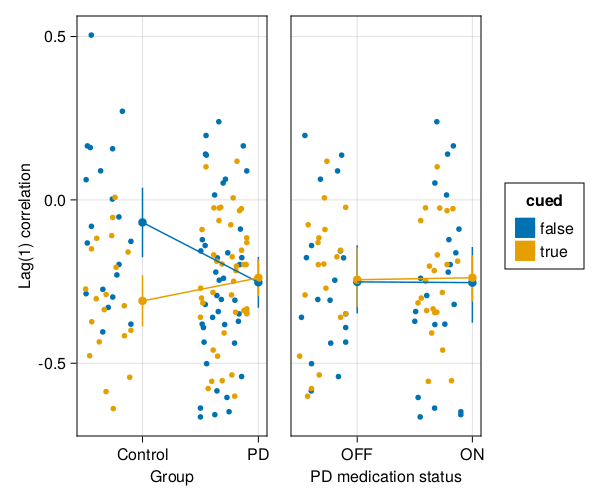

In [78]:
let variable = :lag1_corr, _data = @subset(sipdata, .!ismissing.($variable)), lmm = lag1corr_sip_lmm, ylabel="Lag(1) correlation"
    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
        
    legend!(fg[1,3], grid)
    save("$(variable)_sip.png", fg)
    fg
end

### MA Step time COV

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [60]:
macov_sip_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds*cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 989 	 Time: 0:00:00 ( 0.26 ms/it)


Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -182.3277   364.6554   462.6554   528.8717   600.8492

Variance components:
                          Column                  Variance Std.Dev.   Corr.
sample   (Intercept)                               0.227760 0.477242
         group_meds: PD vs Control                 1.386587 1.177534 -0.44
         group_meds: PD_ON vs PD_OFF               0.469057 0.684877 -0.37 -0.64
         cued: true                                0.046366 0.215328 -0.92 +0.14 +0.61
         group_meds: PD vs Control & cued: true    0.299202 0.546994 -0.80 -0.10 +0.76 +0.97
         group_meds: PD_ON vs PD_OFF & cued: true  0.456273 0.675480 +0.36 +0.31 -0.52 -0.43 -0.49
subject  (Intercept)                               1.058139 1.028659

In [61]:
macov_sip_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds*cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -194.0481   388.0962   426.0962   433.4039   479.6816

Variance components:
                          Column                  Variance Std.Dev.   Corr.
sample   (Intercept)                               0.216740 0.465553
         group_meds: PD vs Control                 0.000000 0.000000   .  
         group_meds: PD_ON vs PD_OFF               1.455946 1.206626   .     .  
         cued: true                                0.000000 0.000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.000000 0.000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.000000 0.000000   .     .     .     .     .  
subject  (Intercept)    

In [62]:
macov_sip_lmm02.rePCA

(sample = [0.5, 1.0, 1.0, 1.0, 1.0, 1.0], subject = [0.3333333333333333, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0])

In [63]:
macov_sip_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds*cued + zerocorr(1+group_meds|subject) + zerocorr(1+group_meds|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 99 	 Time: 0:00:00 ( 1.33 ms/it)
  objective:  388.96473288472725


Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | subject)) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -194.4824   388.9647   414.9647   418.2738   451.6284

Variance components:
                    Column           Variance Std.Dev.   Corr.
sample   (Intercept)                  0.095489 0.309014
         group_meds: PD vs Control    0.646178 0.803852   .  
         group_meds: PD_ON vs PD_OFF  1.491087 1.221101   .     .  
subject  (Intercept)                  0.627398 0.792085
         group_meds: PD vs Control    0.000000 0.000000   .  
         group_meds: PD_ON vs PD_OFF  0.000000 0.000000   .     .  
Residual                              0.743610 0.862328
 Number of obs: 124; levels of grouping factors: 61, 35

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────


In [64]:
macov_sip_lmm03.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0], subject = [1.0, 1.0, 1.0])

In [80]:
macov_sip_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds*cued + (1|subject) + zerocorr(1+group_meds|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -194.4824   388.9647   410.9647   413.3219   441.9878

Variance components:
                    Column           Variance Std.Dev.   Corr.
sample   (Intercept)                  0.137894 0.371341
         group_meds: PD vs Control    0.265058 0.514838   .  
         group_meds: PD_ON vs PD_OFF  1.363670 1.167763   .     .  
subject  (Intercept)                  0.627376 0.792071
Residual                              0.743615 0.862331
 Number of obs: 124; levels of grouping factors: 61, 35

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(

In [69]:
macov_sip_lmm05 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds*cued + (1|subject) + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -197.0647   394.1294   412.1294   413.7083   437.5119

Variance components:
            Column   Variance Std.Dev. 
sample   (Intercept)  0.373519 0.611162
subject  (Intercept)  0.688877 0.829986
Residual              0.769895 0.877437
 Number of obs: 124; levels of grouping factors: 61, 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.15888     0.197784  26.08    <1e-99
group_meds: PD vs Control                  0.666826    0.845981   0.79    0.4306
group_meds: PD_ON vs PD_OFF               -0.398451    0.343868  -1.16    0.24

In [81]:
likelihoodratiotest(macov_sip_lmm04, macov_sip_lmm05)

|                                                                                                                                  | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample)                                    |         9 |      390 |     |        |        |
| ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        11 |      389 |   1 |      2 | 0.7161 |


##### **Random effects caterpillar chart**

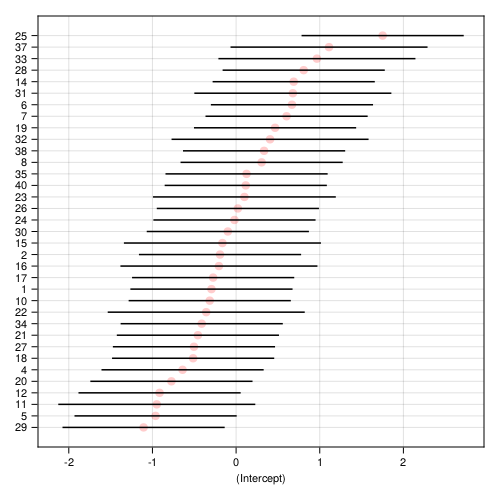

In [70]:
let lmm = macov_sip_lmm05
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

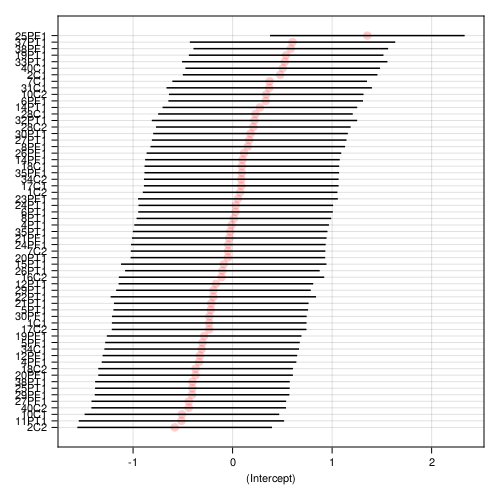

In [71]:
let lmm = macov_sip_lmm05
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :sample),
    )
end

##### **Continuing...**

In [77]:
macov_sip_lmm06 = let
    lmtmp = fit(MixedModel,
        @formula(ma_step_time_cov ~ 1 + group_meds*cued + (1|subject)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject)
   logLik   -2 logLik     AIC       AICc        BIC    
  -196.7110   393.4221   409.4221   410.6742   431.9843

Variance components:
            Column   Variance Std.Dev. 
subject  (Intercept)  0.876393 0.936159
Residual              0.928746 0.963715
 Number of obs: 124; levels of grouping factors: 35

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.11633      0.201813  25.35    <1e-99
group_meds: PD vs Control                  0.988999     0.86509    1.14    0.2529
group_meds: PD_ON vs PD_OFF               -0.418381     0.309722  -1.35    0.1768
cued: true                                -0.14688

In [78]:
likelihoodratiotest(macov_sip_lmm05, macov_sip_lmm06)

|                                                                                               | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:--------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject)                 |         8 |      393 |     |        |        |
| ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample) |         9 |      390 |   4 |      1 | 0.0516 |


In [72]:
macov_sip_lmm = macov_sip_lmm05;

##### **Bootstrap**

In [73]:
macov_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, macov_sip_lmm);

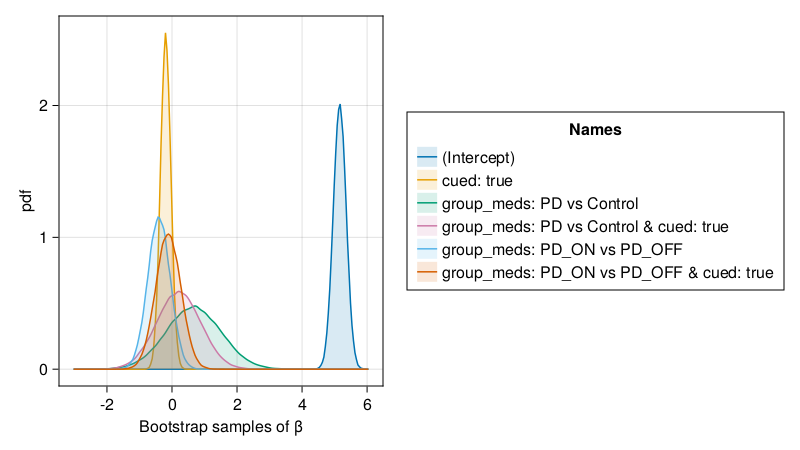

In [74]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(macov_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

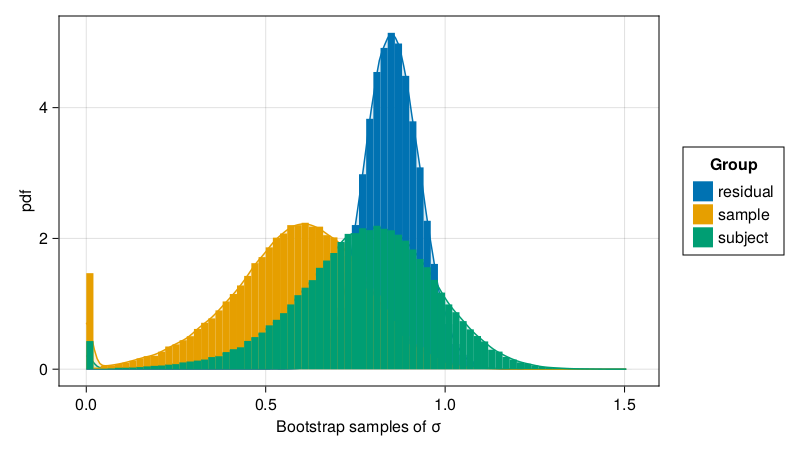

In [75]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(macov_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [76]:
print(macov_sip_lmm)

Linear mixed model fit by maximum likelihood
 ma_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -197.0647   394.1294   412.1294   413.7083   437.5119

Variance components:
            Column   Variance Std.Dev. 
sample   (Intercept)  0.373519 0.611162
subject  (Intercept)  0.688877 0.829986
Residual              0.769895 0.877437
 Number of obs: 124; levels of grouping factors: 61, 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.15888     0.197784  26.08    <1e-99
group_meds: PD vs Control                  0.666826    0.845981   0.79    0.4306
group_meds: PD_ON vs PD_OFF               -0.398451    0.343868  -1.16    0.24

In [77]:
stats_summary(macov_sip_lmm, macov_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),5.15888,"[5.0,6.0]",0.197784,26.0834,5.62484e-150
2,group_meds: PD vs Control,0.666826,"[-1.0,2.0]",0.845981,0.788228,0.430563
3,group_meds: PD_ON vs PD_OFF,-0.398451,"[-1.0,0.3]",0.343868,-1.15873,0.246565
4,cued: true,-0.194284,"[-0.5,0.1]",0.158106,-1.22882,0.219141
5,group_meds: PD vs Control & cued: true,0.204883,"[-1.0,2.0]",0.675239,0.303422,0.761568
6,group_meds: PD_ON vs PD_OFF & cued: true,-0.114416,"[-0.9,0.6]",0.384693,-0.297421,0.766145


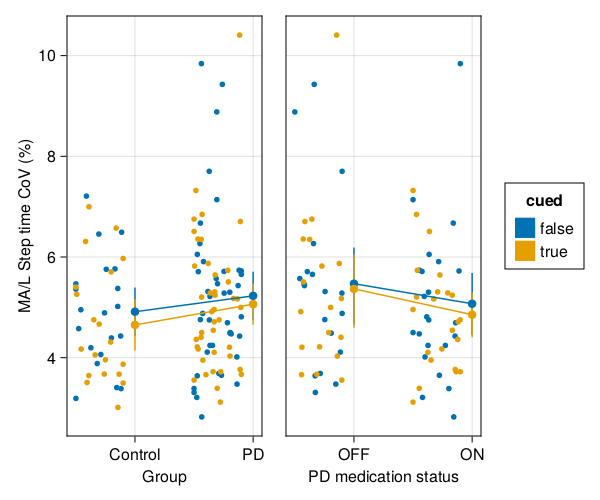

In [78]:
let variable = :ma_step_time_cov, _data = @subset(sipdata, .!ismissing.($variable)), lmm = macov_sip_lmm, 
    ylabel="MA/L Step time CoV (%)"

    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
        
    legend!(fg[1,3], grid)
    save("$(variable)_sip.png", fg)
    fg
end

### LA Step time COV

#### Model reduction

Beginning with overparameterized maximal model, we first switch to a zero-correlation-parameter mixed model. Then we iteratively remove the smallest variance components (ie random effects) until the PCA/rePCA "no longer suggests overidentification.

##### **Dropping variance components according to PCA:**

In [87]:
lacov_sip_lmm01 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds*cued + (1+group_meds*cued|subject) + (1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Minimizing 2574 	 Time: 0:00:00 ( 0.27 ms/it)
  objective:  399.23547614418817


Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 + group_meds + cued + group_meds & cued | subject) + (1 + group_meds + cued + group_meds & cued | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -199.6177   399.2355   497.2355   563.4517   635.4293

Variance components:
                          Column                   Variance Std.Dev.   Corr.
sample   (Intercept)                                0.281243 0.530323
         group_meds: PD vs Control                  6.297183 2.509419 -0.89
         group_meds: PD_ON vs PD_OFF                0.189023 0.434768 -0.71 +0.32
         cued: true                                 0.168440 0.410414 -0.45 +0.77 -0.25
         group_meds: PD vs Control & cued: true     5.638239 2.374498 +0.89 -0.88 -0.51 -0.68
         group_meds: PD_ON vs PD_OFF & cued: true   0.176605 0.420244 -0.81 +0.53 +0.89 +0.02 -0.58
subject  (Intercept)                                1.276110 

In [88]:
lacov_sip_lmm02 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds*cued + zerocorr(1+group_meds*cued|subject) + zerocorr(1+group_meds*cued|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | subject)) + MixedModels.ZeroCorr((1 + group_meds + cued + group_meds & cued | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -210.8234   421.6469   459.6469   466.9545   513.2322

Variance components:
                          Column                   Variance   Std.Dev.    Corr.
sample   (Intercept)                               0.42932397 0.65522818
         group_meds: PD vs Control                 0.00000128 0.00113222   .  
         group_meds: PD_ON vs PD_OFF               1.12669291 1.06145792   .     .  
         cued: true                                0.00000000 0.00000000   .     .     .  
         group_meds: PD vs Control & cued: true    0.00000000 0.00000000   .     .     .     .  
         group_meds: PD_ON vs PD_OFF & cued: true  0.00000000 0.00000000   .     .     .     .     

In [89]:
lacov_sip_lmm02.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0], subject = [0.5000000000000001, 1.0, 1.0, 1.0, 1.0, 1.0])

In [90]:
lacov_sip_lmm03 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds*cued + (1|subject) + zerocorr(1+group_meds|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -210.8234   421.6469   443.6469   446.0040   474.6700

Variance components:
                    Column           Variance Std.Dev.   Corr.
sample   (Intercept)                  0.354427 0.595337
         group_meds: PD vs Control    0.674241 0.821122   .  
         group_meds: PD_ON vs PD_OFF  1.351459 1.162523   .     .  
subject  (Intercept)                  0.623880 0.789861
Residual                              0.963163 0.981408
 Number of obs: 124; levels of grouping factors: 61, 35

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Int

In [91]:
lacov_sip_lmm03.rePCA

(sample = [0.3333333333333333, 0.6666666666666666, 1.0], subject = [1.0])

In [92]:
lacov_sip_lmm04 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds*cued + zerocorr(1+group_meds|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds | sample))
   logLik   -2 logLik     AIC       AICc        BIC    
  -212.1971   424.3943   444.3943   446.3412   472.5971

Variance components:
                    Column           Variance Std.Dev.   Corr.
sample   (Intercept)                  0.650058 0.806262
         group_meds: PD vs Control    0.135699 0.368373   .  
         group_meds: PD_ON vs PD_OFF  3.632001 1.905781   .     .  
Residual                              0.962864 0.981256
 Number of obs: 124; levels of grouping factors: 61

  Fixed-effects parameters:
────────────────────────────────────────────────────────────────────────────────
                                              Coef.  Std. Error      z  Pr(>|z|)
────────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.36785     0.191249  28.07    <1e-99

In [93]:
likelihoodratiotest(lacov_sip_lmm03, lacov_sip_lmm04)

|                                                                                                                                  | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + MixedModels.ZeroCorr((1 + group_meds \| sample))                  |        10 |      424 |     |        |        |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        11 |      422 |   3 |      1 | 0.0974 |


In [79]:
lacov_sip_lmm04p1 = let
    lmtmp = fit(MixedModel,
        @formula(la_step_time_cov ~ 1 + group_meds*cued + (1|subject) + (1|sample)),
        sipdata; contrasts)
    print(lmtmp)
    lmtmp
end;

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -202.7989   405.5979   423.5979   425.1768   448.9804

Variance components:
            Column   Variance Std.Dev. 
sample   (Intercept)  0.547360 0.739838
subject  (Intercept)  0.726510 0.852356
Residual              0.789258 0.888402
 Number of obs: 124; levels of grouping factors: 61, 35

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.35749      0.208555  25.69    <1e-99
group_meds: PD vs Control                  1.26845      0.891578   1.42    0.1548
group_meds: PD_ON vs PD_OFF               -0.278446     0.371692  -0.75  

In [98]:
likelihoodratiotest(lacov_sip_lmm03, lacov_sip_lmm04p1)

|                                                                                                                                  | model-dof | deviance |  χ² | χ²-dof | P(>χ²) |
|:-------------------------------------------------------------------------------------------------------------------------------- | ---------:| --------:| ---:| ------:|:------ |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + (1 \| sample)                                    |         9 |      422 |     |        |        |
| la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 \| subject) + MixedModels.ZeroCorr((1 + group_meds \| sample)) |        11 |      422 |   0 |      2 | 0.8839 |


In [87]:
lacov_sip_lmm = lacov_sip_lmm04p1;

##### **Random effects caterpillar chart**

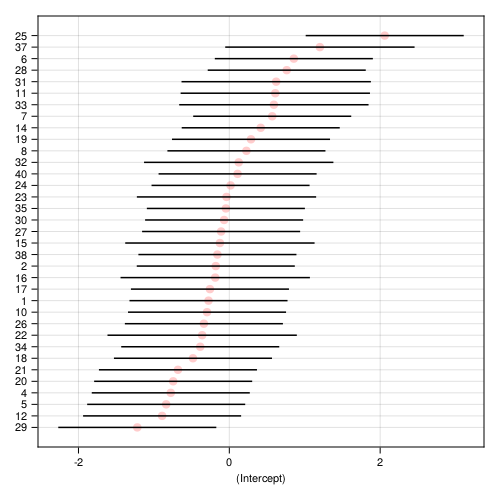

In [82]:
let lmm = lacov_sip_lmm04p1
    figsubject = caterpillar!(Figure(; resolution=(500, 500), fontsize=11),
      ranefinfo(lmm, :subject),
    )
end

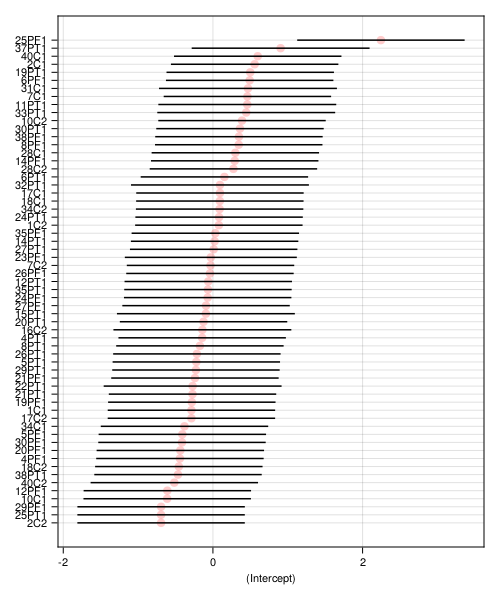

In [83]:
let lmm = lacov_sip_lmm04p1
    figsubject = caterpillar!(Figure(; resolution=(500, 600), fontsize=11),
      ranefinfo(lmm, :sample),
    )
end

##### **Bootstrap**

In [88]:
lacov_sip_btstrp = parametricbootstrap(Xoshiro(0xBEEF), 100_000, lacov_sip_lmm);

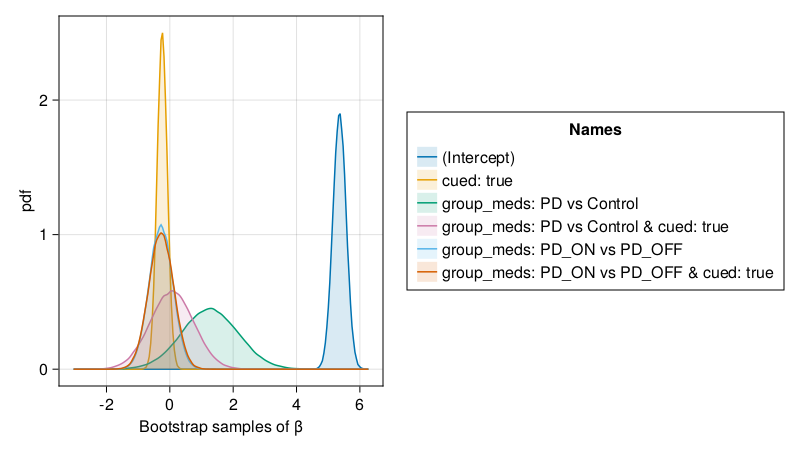

In [89]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(lacov_sip_btstrp.allpars), :type .== "β")) *
  mapping(
    :value => "Bootstrap samples of β";
    color=(:names => "Names"),
  ) *
  AlgebraOfGraphics.density();
  figure=(; resolution=(800, 450)),
)

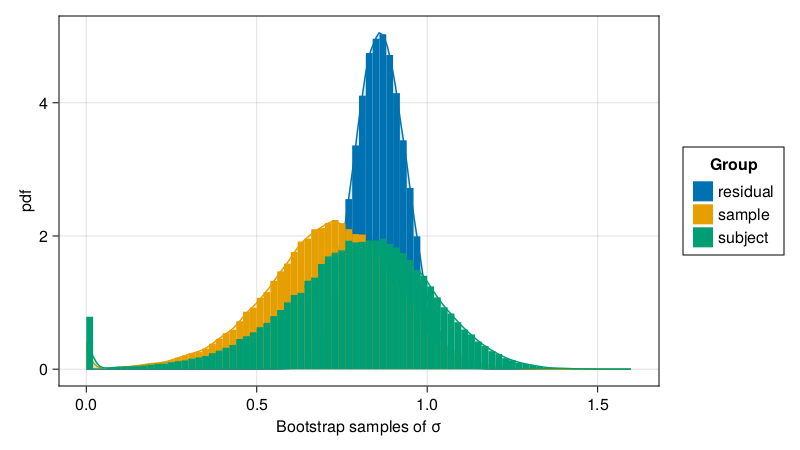

In [90]:
draw(
  AlgebraOfGraphics.data(@subset(DataFrame(lacov_sip_btstrp.allpars), :type .== "σ")) *
  mapping(
    :value => "Bootstrap samples of σ";
    color=(:group => "Group"),
  ) *
  (AlgebraOfGraphics.density() + AlgebraOfGraphics.histogram(; bins=100, normalization=:pdf));
  figure=(; resolution=(800, 450)),
)

#### Final model and results

In [91]:
print(lacov_sip_lmm)

Linear mixed model fit by maximum likelihood
 la_step_time_cov ~ 1 + group_meds + cued + group_meds & cued + (1 | subject) + (1 | sample)
   logLik   -2 logLik     AIC       AICc        BIC    
  -202.7989   405.5979   423.5979   425.1768   448.9804

Variance components:
            Column   Variance Std.Dev. 
sample   (Intercept)  0.547360 0.739838
subject  (Intercept)  0.726510 0.852356
Residual              0.789258 0.888402
 Number of obs: 124; levels of grouping factors: 61, 35

  Fixed-effects parameters:
─────────────────────────────────────────────────────────────────────────────────
                                               Coef.  Std. Error      z  Pr(>|z|)
─────────────────────────────────────────────────────────────────────────────────
(Intercept)                                5.35749      0.208555  25.69    <1e-99
group_meds: PD vs Control                  1.26845      0.891578   1.42    0.1548
group_meds: PD_ON vs PD_OFF               -0.278446     0.371692  -0.75  

In [92]:
stats_summary(lacov_sip_lmm, lacov_sip_btstrp)

Row,Name,Coef.,95% CI,Std. Error,z,Pr(>|z|)
,String,Float64,String?,Float64,Float64,Float64
1,(Intercept),5.35749,"[5.0,6.0]",0.208555,25.6887,1.56527e-145
2,group_meds: PD vs Control,1.26845,"[-0.5,3.0]",0.891578,1.4227,0.154823
3,group_meds: PD_ON vs PD_OFF,-0.278446,"[-1.0,0.5]",0.371692,-0.74913,0.453779
4,cued: true,-0.240469,"[-0.6,0.07]",0.160082,-1.50216,0.133056
5,group_meds: PD vs Control & cued: true,0.0663256,"[-1.0,1.0]",0.683677,0.0970131,0.922716
6,group_meds: PD_ON vs PD_OFF & cued: true,-0.272011,"[-1.0,0.5]",0.389501,-0.698357,0.484954


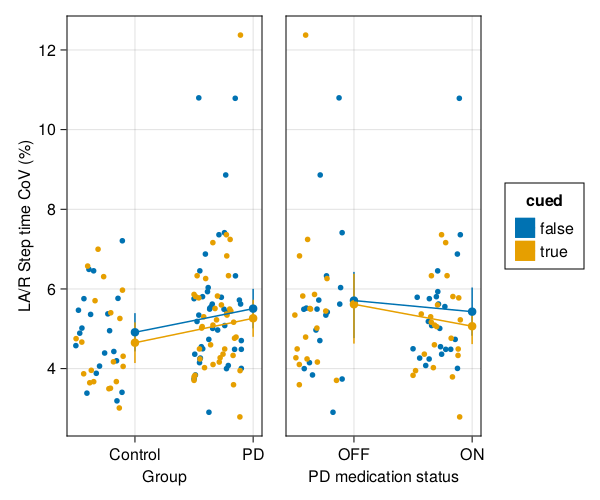

In [93]:
let variable = :la_step_time_cov, _data = @subset(sipdata, .!ismissing.($variable)), lmm = lacov_sip_lmm,
    ylabel="LA/R Step time CoV (%)"

    fg = Figure(;resolution=(600,500))
    axleft = Axis(fg[1,1]; xticks=(1:2, ["Control", "PD"]))
    axright = Axis(fg[1,2]; xticks=(1:2, ["OFF", "ON"]))
    linkyaxes!(axleft, axright)
    hideydecorations!(axright; grid=false)

    aog_p = AlgebraOfGraphics.data(_data) * mapping(:group, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8, 
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="Group", ylabel)

    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem, 
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(let data = _data
            gd = groupby(data, [:group,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:group, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    draw!(axleft, aog_p)

    aog_p = AlgebraOfGraphics.data(@subset(_data, :group .== "PD")) * 
        mapping(:meds, variable; color=:cued) *
        visual(RainClouds; plot_boxplots=false, clouds=nothing, side=:right, markersize=8,
        jitter_width=0.4, gap=0, side_nudge=0.3, xlabel="PD medication status")
    aog_p += AlgebraOfGraphics.data(let data = @subset(_data, :group .== "PD")
            gd = groupby(data, [:meds,:cued])
            summary = combine(gd, variable => mean, variable => sem => :sem; renamecols=false)
            @transform!(summary, :lower = $variable .- 1.96.*:sem,
                :upper = $variable .+ 1.96.*:sem)
        end) * mapping(:meds, :lower, :upper; color=:cued) * (visual(Rangebars))
    aog_p += AlgebraOfGraphics.data(
        let data = @subset(emmeans(lmm), :group_meds .!= "Control")
            transform!(data, [:cued, :group_meds] .=> CategoricalVector; renamecols=false)
            transform!(data, :group_meds => 
                ByRow(x -> endswith(string(x), "OFF") ? "OFF" : "ON") => :meds)
            @transform!(data, :lower = $variable .- 1.96.*:err, :upper = $variable .+ 1.96.*:err)
            transform!(data, :meds => x -> CategoricalVector(x; levels=["OFF", "ON"], ordered=true);
                renamecols=false)
            sort!(data, :meds)
        end) * mapping(:meds, variable; color=:cued) * (visual(Scatter) + visual(Lines))
    grid = draw!(axright, aog_p)
        
    legend!(fg[1,3], grid)
    save("$(variable)_sip.png", fg)
    fg
end